___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Assignment-1 (ANN)<br><br>Churn Prediction for Bank Customer<br><h1>

# Dataset Info

We have a dataset in which there are details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

The features in the given dataset are:
- **rownumber:** Row Numbers from 1 to 10000.
- **customerid:** A unique ID that identifies each customer.
- **surname:** The customer’s surname.
- **creditscore:** A credit score is a number between 300–850 that depicts a consumer's creditworthiness.
- **geography:** The country from which the customer belongs to.
- **Gender:** The customer’s gender: Male, Female
- **Age:** The customer’s current age, in years, at the time of being customer.
- **tenure:** The number of years for which the customer has been with the bank.
- **balance:** Bank balance of the customer.
- **numofproducts:** the number of bank products the customer is utilising.
- **hascrcard:** The number of credit cards given to the customer by the bank.
- **isactivemember:** Binary Flag for indicating if the client is active or not with the bank before the moment where the client exits the company (recorded in the variable "exited")
- **exited:** Binary flag 1 if the customer closed account with bank and 0 if the customer is retained.

# Improt Libraries & Data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12, 6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
import warnings

warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, average_precision_score
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [3]:
df = pd.read_csv("Churn_Modelling.csv", index_col='RowNumber')
df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.000,1,1,1,101348.880,1
2,15647311,Hill,608,Spain,Female,41,1,83807.860,1,0,1,112542.580,0
3,15619304,Onio,502,France,Female,42,8,159660.800,3,1,0,113931.570,1
4,15701354,Boni,699,France,Female,39,1,0.000,2,0,0,93826.630,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.820,1,1,1,79084.100,0


# Exploratory Data Analysis and Visualization

1. Implement basic steps to see how is your data looks like
2. Check for missing values
3. Drop the features that not suitable for modelling
4. Implement basic visualization steps such as histogram, countplot, heatmap
5. Convert categorical variables to dummy variables

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1 to 10000
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CustomerId       10000 non-null  int64  
 1   Surname          10000 non-null  object 
 2   CreditScore      10000 non-null  int64  
 3   Geography        10000 non-null  object 
 4   Gender           10000 non-null  object 
 5   Age              10000 non-null  int64  
 6   Tenure           10000 non-null  int64  
 7   Balance          10000 non-null  float64
 8   NumOfProducts    10000 non-null  int64  
 9   HasCrCard        10000 non-null  int64  
 10  IsActiveMember   10000 non-null  int64  
 11  EstimatedSalary  10000 non-null  float64
 12  Exited           10000 non-null  int64  
dtypes: float64(2), int64(8), object(3)
memory usage: 1.1+ MB


In [5]:
df.shape

(10000, 13)

In [6]:
df.isnull().sum().any()

False

In [7]:
df.duplicated().sum()

0

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerId,10000.000,15690940.569,71936.186,15565701.000,15628528.250,15690738.000,15753233.750,15815690.000
CreditScore,10000.000,650.529,96.653,350.000,584.000,652.000,718.000,850.000
Age,10000.000,38.922,10.488,18.000,32.000,37.000,44.000,92.000
Tenure,10000.000,5.013,2.892,0.000,3.000,5.000,7.000,10.000
Balance,10000.000,76485.889,62397.405,0.000,0.000,97198.540,127644.240,250898.090
NumOfProducts,10000.000,1.530,0.582,1.000,1.000,1.000,2.000,4.000
HasCrCard,10000.000,0.706,0.456,0.000,0.000,1.000,1.000,1.000
IsActiveMember,10000.000,0.515,0.500,0.000,0.000,1.000,1.000,1.000
EstimatedSalary,10000.000,100090.240,57510.493,11.580,51002.110,100193.915,149388.247,199992.480
Exited,10000.000,0.204,0.403,0.000,0.000,0.000,0.000,1.000


In [9]:
df.drop(['CustomerId', 'Surname'], axis=1, inplace=True)

In [10]:
df.Exited.value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

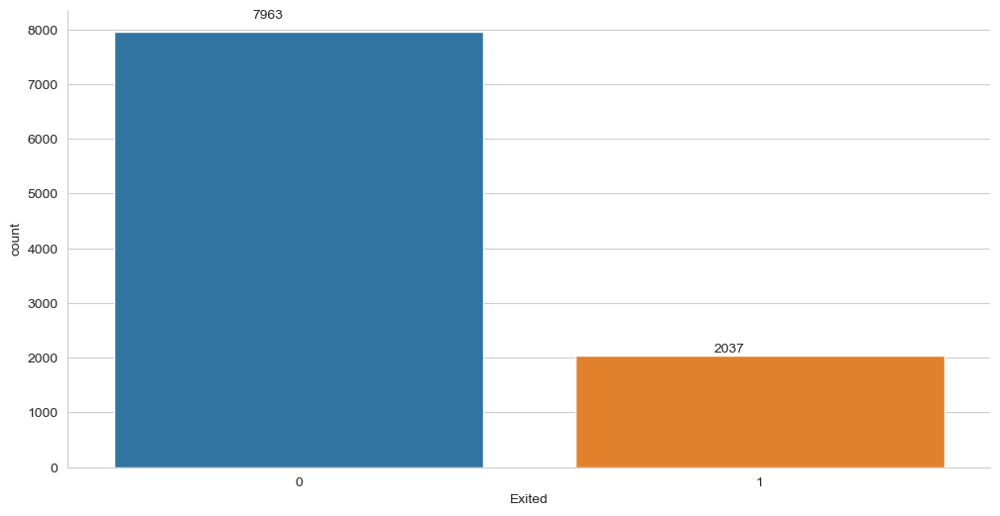

In [11]:
ax = sns.countplot(df.Exited)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + 0.3, p.get_height() * 1.03));

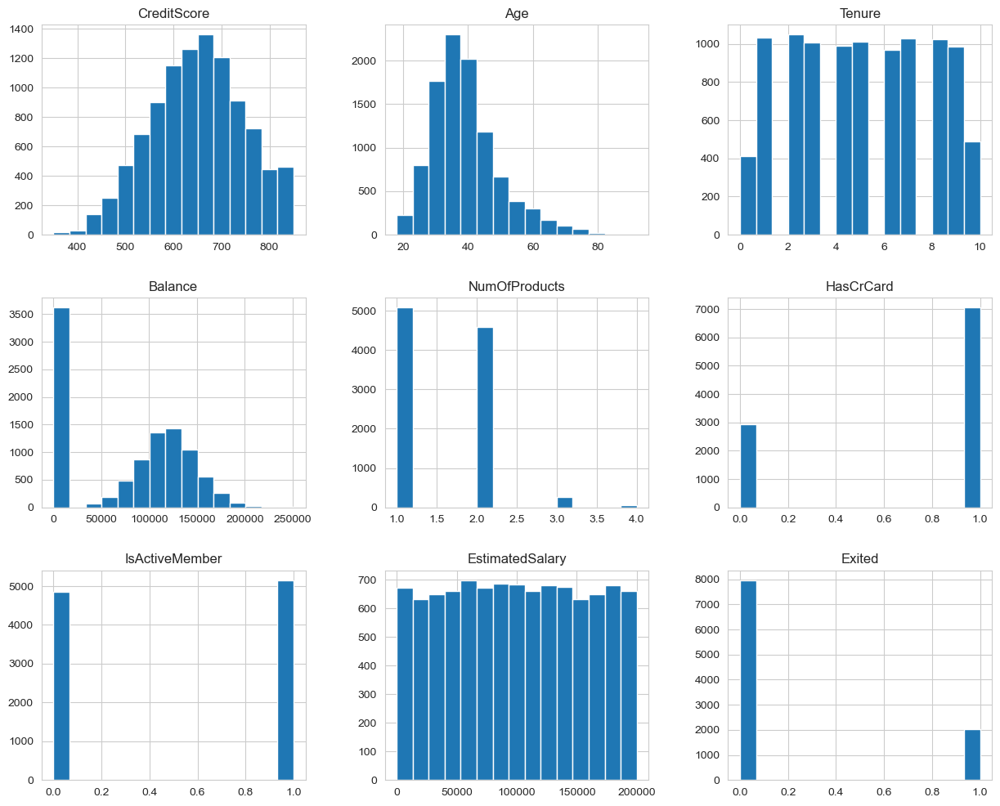

In [12]:
df.hist(figsize=(15, 12), bins=15);

<AxesSubplot:>

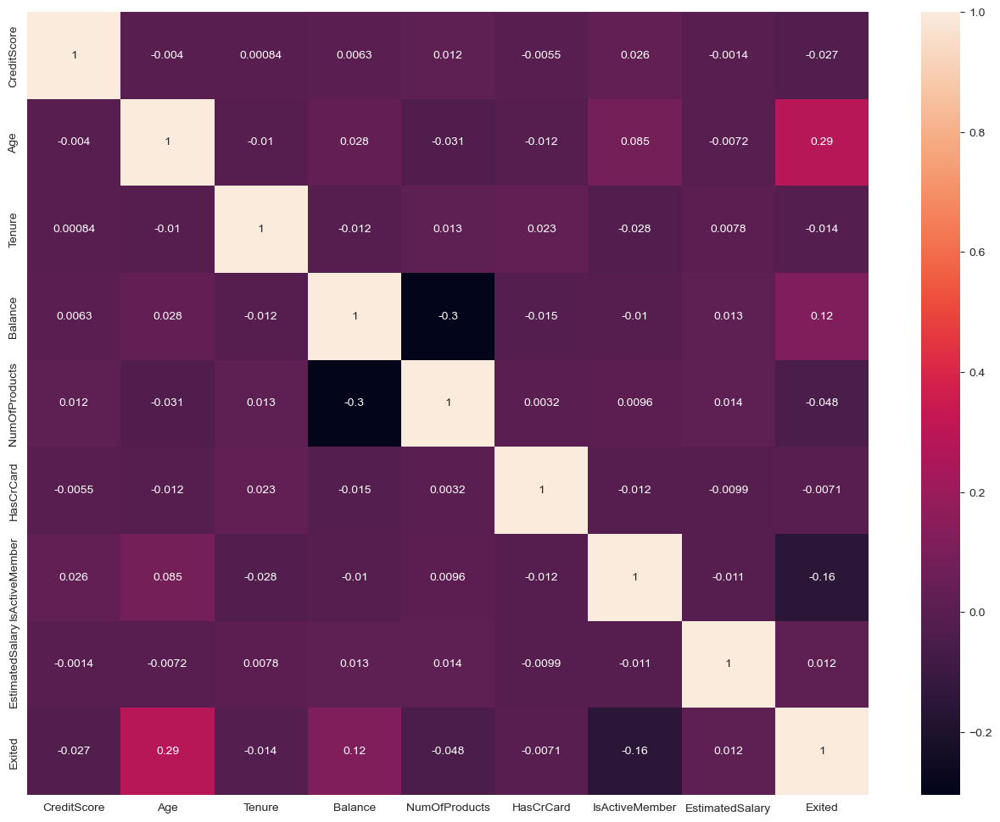

In [13]:
plt.figure(figsize=(16, 12))
sns.heatmap(df.corr(), annot=True)

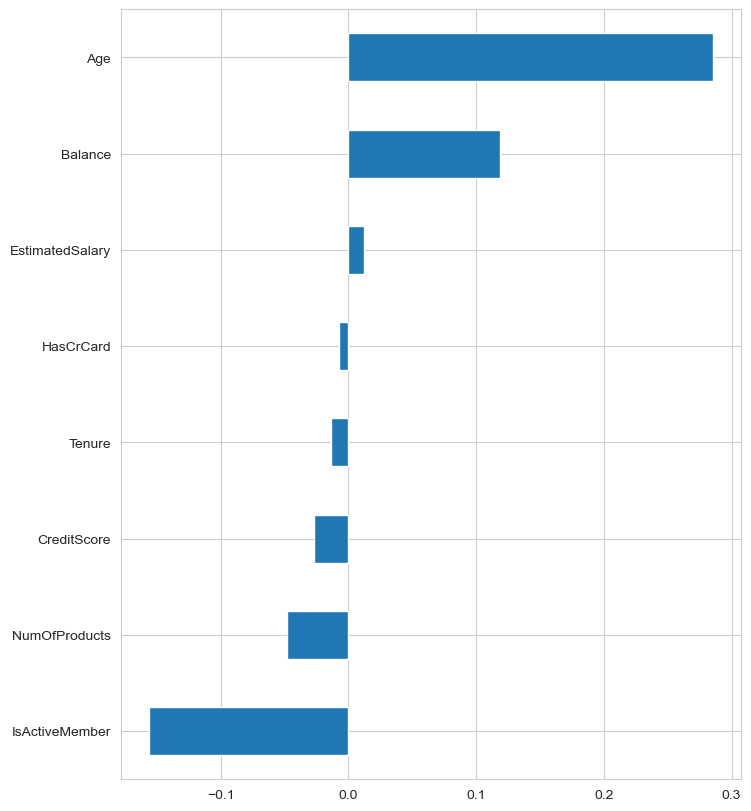

In [14]:
plt.figure(figsize = (8,10))
df.corr()["Exited"].sort_values().drop("Exited").plot(kind = "barh");

In [15]:
df = pd.get_dummies(df,drop_first=True)
df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain,Gender_Male
RowNumber,,,,,,,,,,,,
1,619,42,2,0.000,1,1,1,101348.880,1,0,0,0
2,608,41,1,83807.860,1,0,1,112542.580,0,0,1,0
3,502,42,8,159660.800,3,1,0,113931.570,1,0,0,0
4,699,39,1,0.000,2,0,0,93826.630,0,0,0,0
5,850,43,2,125510.820,1,1,1,79084.100,0,0,1,0


# Preprocessing of Data
- Train | Test Split, Scalling

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
X = df.drop("Exited",axis=1)
y = df.Exited

In [18]:
seed=42

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = seed)

In [20]:
from sklearn.preprocessing import MinMaxScaler

In [21]:
scaler = MinMaxScaler()

In [22]:
X_train = scaler.fit_transform(X_train)

In [23]:
X_test = scaler.transform(X_test)

# Modelling & Model Performance

## without class_weigth

### Create The Model

In [24]:
from tensorflow.python.keras import optimizers as opt
from tensorflow.keras.optimizers import Adam

In [25]:
model = Sequential()

tf.random.set_seed(seed)

model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.001)
model.compile(optimizer=opt,loss="binary_crossentropy",metrics=["Recall"])

2022-10-03 12:45:13.097859: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [26]:
early_stop = EarlyStopping(monitor="val_loss",mode="auto",verbose=1,patience=15)

In [27]:
model.fit(x=X_train,y=y_train,validation_split=0.1,batch_size=128,epochs=200,verbose=1,callbacks=[early_stop])

Epoch 1/200
57/57 [==============================] - 0s 3ms/step - loss: 0.5433 - recall: 0.0000e+00 - val_loss: 0.4865 - val_recall: 0.0000e+00
Epoch 2/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4984 - recall: 0.0000e+00 - val_loss: 0.4733 - val_recall: 0.0000e+00
Epoch 3/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4888 - recall: 0.0000e+00 - val_loss: 0.4660 - val_recall: 0.0000e+00
Epoch 4/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4814 - recall: 0.0000e+00 - val_loss: 0.4600 - val_recall: 0.0000e+00
Epoch 5/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4738 - recall: 0.0169 - val_loss: 0.4534 - val_recall: 0.0395
Epoch 6/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4667 - recall: 0.0602 - val_loss: 0.4487 - val_recall: 0.0592
Epoch 7/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4621 - recall: 0.0900 - val_loss: 0.4449 - val_recall: 0.0789
Epoch 8/2

Epoch 60/200
57/57 [==============================] - 0s 943us/step - loss: 0.3527 - recall: 0.4411 - val_loss: 0.3271 - val_recall: 0.4539
Epoch 61/200
57/57 [==============================] - 0s 923us/step - loss: 0.3531 - recall: 0.4310 - val_loss: 0.3261 - val_recall: 0.4342
Epoch 62/200
57/57 [==============================] - 0s 935us/step - loss: 0.3526 - recall: 0.4371 - val_loss: 0.3261 - val_recall: 0.4079
Epoch 63/200
57/57 [==============================] - 0s 937us/step - loss: 0.3522 - recall: 0.4317 - val_loss: 0.3246 - val_recall: 0.4211
Epoch 64/200
57/57 [==============================] - 0s 930us/step - loss: 0.3524 - recall: 0.4398 - val_loss: 0.3258 - val_recall: 0.4408
Epoch 65/200
57/57 [==============================] - 0s 913us/step - loss: 0.3516 - recall: 0.4425 - val_loss: 0.3235 - val_recall: 0.4079
Epoch 66/200
57/57 [==============================] - 0s 930us/step - loss: 0.3512 - recall: 0.4371 - val_loss: 0.3237 - val_recall: 0.4079
Epoch 67/200
57/57 [

57/57 [==============================] - 0s 972us/step - loss: 0.3411 - recall: 0.4472 - val_loss: 0.3164 - val_recall: 0.4605
Epoch 119/200
57/57 [==============================] - 0s 966us/step - loss: 0.3415 - recall: 0.4540 - val_loss: 0.3159 - val_recall: 0.4342
Epoch 120/200
57/57 [==============================] - 0s 933us/step - loss: 0.3414 - recall: 0.4547 - val_loss: 0.3156 - val_recall: 0.4276
Epoch 121/200
57/57 [==============================] - 0s 951us/step - loss: 0.3413 - recall: 0.4594 - val_loss: 0.3149 - val_recall: 0.4276
Epoch 122/200
57/57 [==============================] - 0s 922us/step - loss: 0.3403 - recall: 0.4594 - val_loss: 0.3155 - val_recall: 0.4211
Epoch 123/200
57/57 [==============================] - 0s 933us/step - loss: 0.3396 - recall: 0.4493 - val_loss: 0.3148 - val_recall: 0.4276
Epoch 124/200
57/57 [==============================] - 0s 936us/step - loss: 0.3406 - recall: 0.4540 - val_loss: 0.3185 - val_recall: 0.3684
Epoch 125/200
57/57 [======

57/57 [==============================] - 0s 975us/step - loss: 0.3345 - recall: 0.4723 - val_loss: 0.3119 - val_recall: 0.4474
Epoch 176: early stopping


In [28]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                192       
                                                                 
 dense_1 (Dense)             (None, 8)                 136       
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 337
Trainable params: 337
Non-trainable params: 0
_________________________________________________________________


### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [29]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall,val_loss,val_recall
0,0.543,0.000,0.487,0.000
1,0.498,0.000,0.473,0.000
2,0.489,0.000,0.466,0.000
3,0.481,0.000,0.460,0.000
4,0.474,0.017,0.453,0.039


<AxesSubplot:>

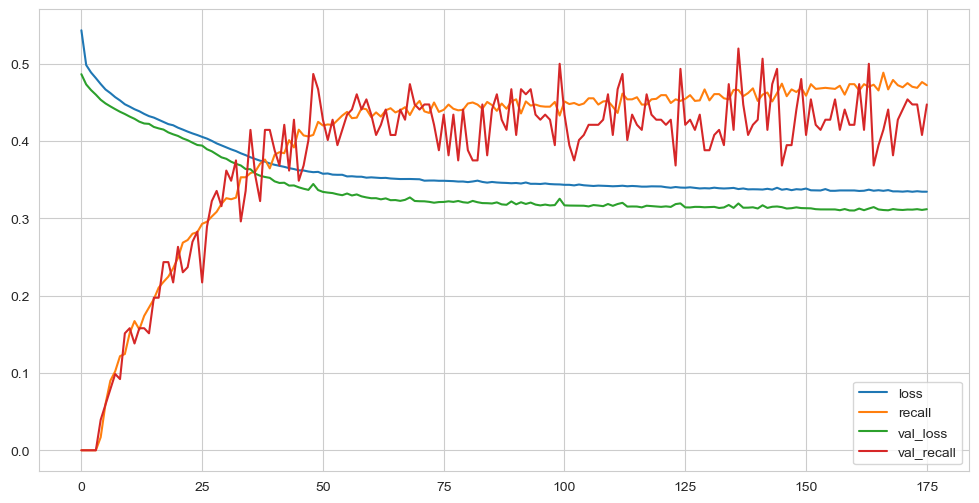

In [30]:
loss_df.plot()

In [31]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

63/63 [==============================] - 0s 468us/step
[[1535   58]
 [ 216  191]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.92      1593
           1       0.77      0.47      0.58       407

    accuracy                           0.86      2000
   macro avg       0.82      0.72      0.75      2000
weighted avg       0.85      0.86      0.85      2000



63/63 [==============================] - 0s 461us/step


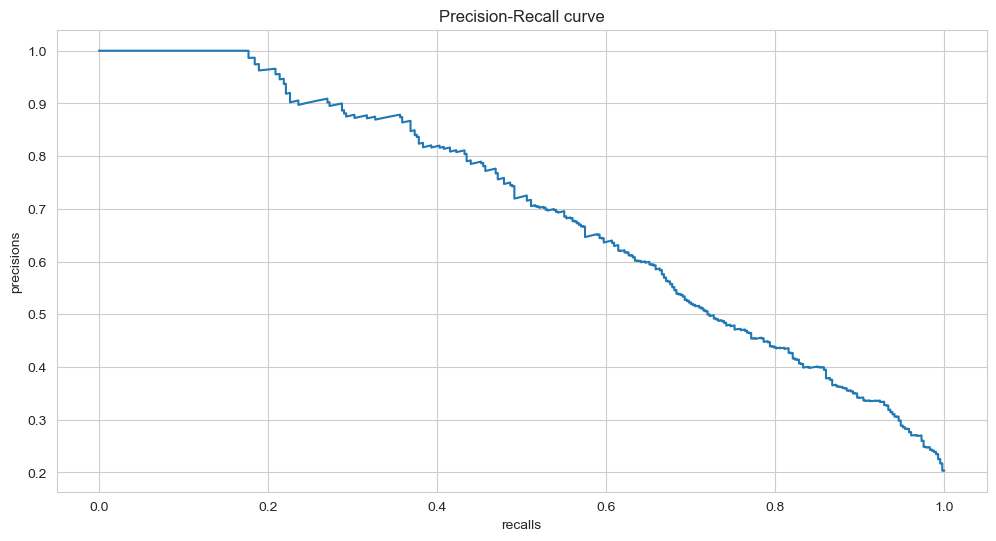

In [32]:
y_pred_proba = model.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

## with class_weigth

Investigate how the "class_weight" hyper-parameter is used in a Neural Network.

### Create The Model

In [33]:
model = Sequential()

tf.random.set_seed(seed)

model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.001)
model.compile(optimizer=opt, loss="binary_crossentropy",metrics=["Recall"])

In [34]:
from sklearn.utils import class_weight

In [35]:
class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(y_train),y=y_train)

In [36]:
class_weights = {0: class_weights[0], 1: class_weights[1]}
class_weights

{0: 0.6279434850863422, 1: 2.4539877300613497}

In [37]:
model.fit(x=X_train,y=y_train,validation_split=0.1,batch_size=128,epochs=200,verbose=1,callbacks=[early_stop],class_weight=class_weights)

Epoch 1/200
57/57 [==============================] - 0s 3ms/step - loss: 0.6896 - recall: 0.2300 - val_loss: 0.6664 - val_recall: 0.5329
Epoch 2/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6702 - recall: 0.5298 - val_loss: 0.6526 - val_recall: 0.5658
Epoch 3/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6522 - recall: 0.6543 - val_loss: 0.6179 - val_recall: 0.5592
Epoch 4/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6362 - recall: 0.6360 - val_loss: 0.6375 - val_recall: 0.6711
Epoch 5/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6259 - recall: 0.6516 - val_loss: 0.6138 - val_recall: 0.6184
Epoch 6/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6179 - recall: 0.6624 - val_loss: 0.5900 - val_recall: 0.5987
Epoch 7/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6125 - recall: 0.6671 - val_loss: 0.5913 - val_recall: 0.6184
Epoch 8/200
57/57 [======================

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

<AxesSubplot:>

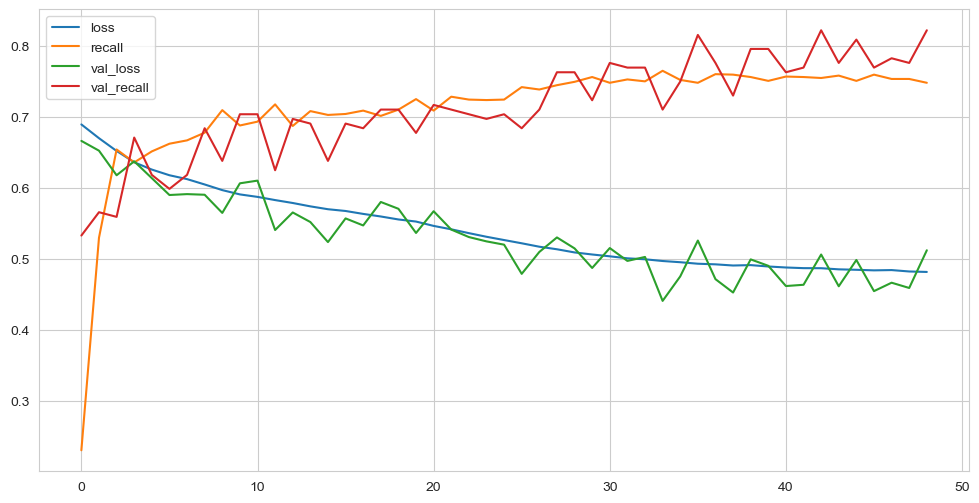

In [38]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [39]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

63/63 [==============================] - 0s 498us/step
[[1135  458]
 [  78  329]]
              precision    recall  f1-score   support

           0       0.94      0.71      0.81      1593
           1       0.42      0.81      0.55       407

    accuracy                           0.73      2000
   macro avg       0.68      0.76      0.68      2000
weighted avg       0.83      0.73      0.76      2000



63/63 [==============================] - 0s 460us/step


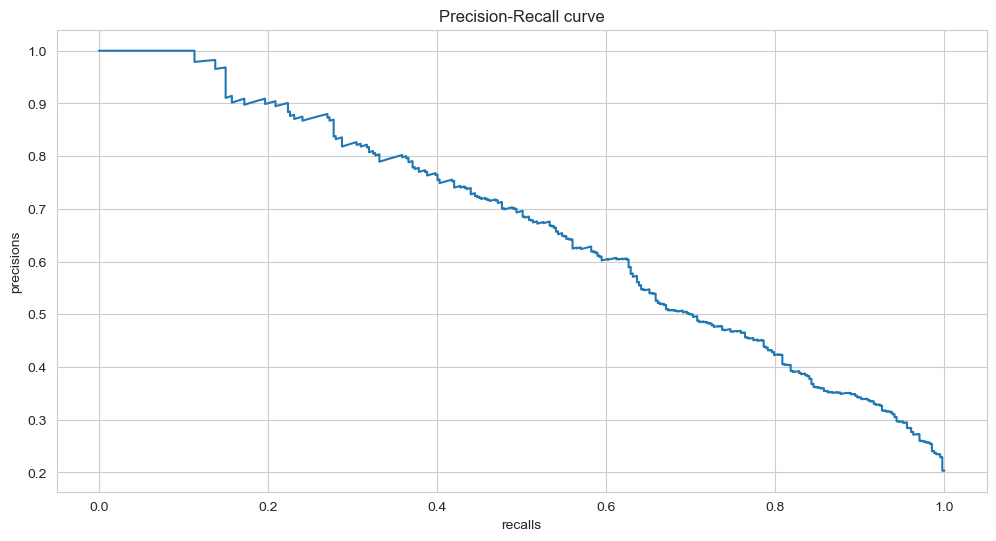

In [40]:
y_pred_proba = model.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

## Implementation Different Methods to Develop The Model

- Implement the following methods on model creating with "class_weight" parameter
- Create and evaluate model for each method 

### Increase The Learning Rate and Observe The Results

In [41]:
model = Sequential()

tf.random.set_seed(seed)

model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.003)
model.compile(optimizer=opt, loss="binary_crossentropy",metrics=["Recall"])

In [42]:
class_weights = class_weight.compute_class_weight('balanced',classes=np.unique(y_train),y=y_train)

In [43]:
class_weights = {0: class_weights[0], 1: class_weights[1]}
class_weights

{0: 0.6279434850863422, 1: 2.4539877300613497}

In [44]:
model.fit(x=X_train,y=y_train,validation_split=0.1,batch_size=128,epochs=200,verbose=1,callbacks=[early_stop],class_weight=class_weights)

Epoch 1/200
57/57 [==============================] - 0s 3ms/step - loss: 0.6752 - recall: 0.4668 - val_loss: 0.6699 - val_recall: 0.7566
Epoch 2/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6342 - recall: 0.6353 - val_loss: 0.6616 - val_recall: 0.7368
Epoch 3/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6136 - recall: 0.6854 - val_loss: 0.5958 - val_recall: 0.6513
Epoch 4/200
57/57 [==============================] - 0s 1ms/step - loss: 0.5955 - recall: 0.6982 - val_loss: 0.5450 - val_recall: 0.6118
Epoch 5/200
57/57 [==============================] - 0s 1ms/step - loss: 0.5848 - recall: 0.6942 - val_loss: 0.5145 - val_recall: 0.5987
Epoch 6/200
57/57 [==============================] - 0s 1ms/step - loss: 0.5743 - recall: 0.7003 - val_loss: 0.5658 - val_recall: 0.6908
Epoch 7/200
57/57 [==============================] - 0s 1ms/step - loss: 0.5638 - recall: 0.7050 - val_loss: 0.5278 - val_recall: 0.6513
Epoch 8/200
57/57 [======================

<AxesSubplot:>

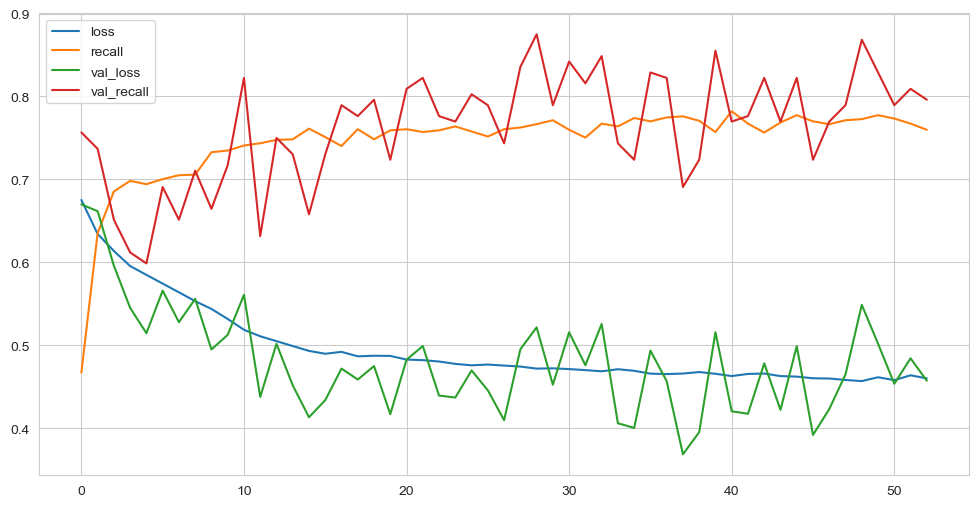

In [45]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [46]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

63/63 [==============================] - 0s 483us/step
[[1207  386]
 [  78  329]]
              precision    recall  f1-score   support

           0       0.94      0.76      0.84      1593
           1       0.46      0.81      0.59       407

    accuracy                           0.77      2000
   macro avg       0.70      0.78      0.71      2000
weighted avg       0.84      0.77      0.79      2000



63/63 [==============================] - 0s 477us/step


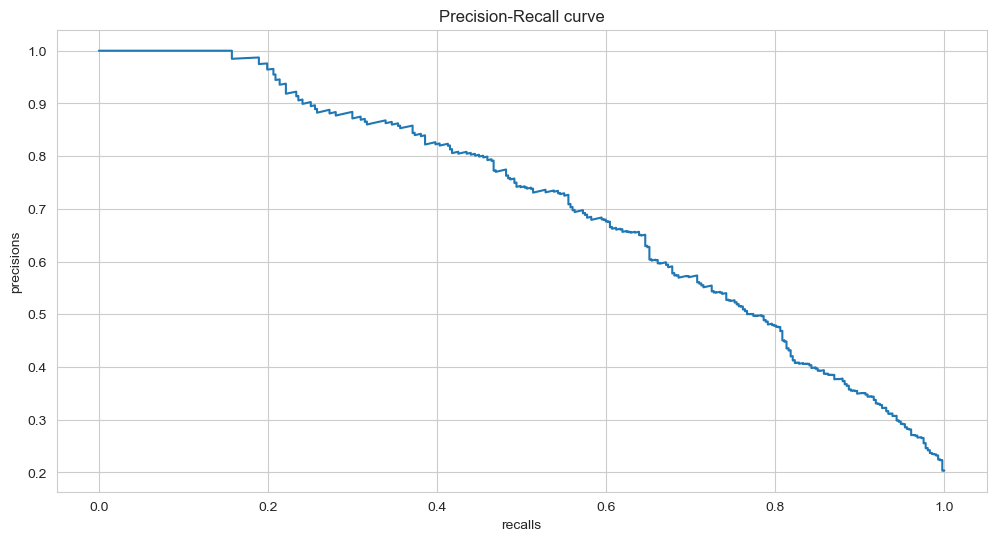

In [47]:
y_pred_proba = model.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

### Add Dropout Layer

In [48]:
from tensorflow.keras.layers import Dropout

In [49]:
model = Sequential()

tf.random.set_seed(seed)

model.add(Dense(16, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(8, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.003)
model.compile(optimizer=opt, loss="binary_crossentropy",metrics=["Recall"])

### Add Early Stop

#### Monitor the "val_loss" as metric

In [50]:
early_stop = EarlyStopping(monitor="val_loss",mode="auto",verbose=1,patience=15)

In [51]:
model.fit(x=X_train,y=y_train,validation_split=0.1,batch_size=128,epochs=200,verbose=1,callbacks=[early_stop],class_weight=class_weights)

Epoch 1/200
57/57 [==============================] - 1s 3ms/step - loss: 0.6912 - recall: 0.4878 - val_loss: 0.6868 - val_recall: 0.7763
Epoch 2/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6627 - recall: 0.6671 - val_loss: 0.6686 - val_recall: 0.7500
Epoch 3/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6489 - recall: 0.6888 - val_loss: 0.6395 - val_recall: 0.7237
Epoch 4/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6386 - recall: 0.6671 - val_loss: 0.6356 - val_recall: 0.7434
Epoch 5/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6287 - recall: 0.6691 - val_loss: 0.5965 - val_recall: 0.6711
Epoch 6/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6201 - recall: 0.6928 - val_loss: 0.6064 - val_recall: 0.7105
Epoch 7/200
57/57 [==============================] - 0s 1ms/step - loss: 0.6104 - recall: 0.6867 - val_loss: 0.5861 - val_recall: 0.7171
Epoch 8/200
57/57 [======================

#### Monitor the "val_recall" as metric

In [52]:
early_stop = EarlyStopping(monitor="val_recall",mode="auto",verbose=1,patience=15)

In [53]:
model.fit(x=X_train,y=y_train,validation_split=0.1,batch_size=128,epochs=200,verbose=1,callbacks=[early_stop],class_weight=class_weights)

Epoch 1/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4912 - recall: 0.7754 - val_loss: 0.4681 - val_recall: 0.7895
Epoch 2/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4959 - recall: 0.7585 - val_loss: 0.4755 - val_recall: 0.8026
Epoch 3/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4879 - recall: 0.7801 - val_loss: 0.4462 - val_recall: 0.7697
Epoch 4/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4942 - recall: 0.7706 - val_loss: 0.4654 - val_recall: 0.7895
Epoch 5/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4944 - recall: 0.7666 - val_loss: 0.4729 - val_recall: 0.8026
Epoch 6/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4897 - recall: 0.7821 - val_loss: 0.4485 - val_recall: 0.7763
Epoch 7/200
57/57 [==============================] - 0s 1ms/step - loss: 0.4923 - recall: 0.7788 - val_loss: 0.4594 - val_recall: 0.7829
Epoch 8/200
57/57 [======================

## GridSearchCV

In [54]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.optimizers import Adadelta, RMSprop, Nadam, Adam, SGD

In [55]:
def build_classifier(optimizer,learn_rate):
    classifier = Sequential()
    classifier.add(Dense(units=16, activation='relu'))
    classifier.add(Dense(units=8, activation='relu'))
    classifier.add(Dense(units=1, activation='sigmoid'))
    classifier.compile(optimizer=optimizer(learn_rate),
                       loss='binary_crossentropy',
                       metrics=['Recall'])
    return classifier

In [56]:
class_weights

{0: 0.6279434850863422, 1: 2.4539877300613497}

In [58]:
tf.random.set_seed(seed)

classifier = KerasClassifier(build_fn=build_classifier, epochs=200)
parameters = {
    'batch_size': [128, 256],
    'optimizer': [Adam, RMSprop, Nadam, Adadelta, SGD],
    'learn_rate': [0.001, 0.003, 0.005]}

In [59]:
grid_model = GridSearchCV(estimator=classifier,
                          param_grid=parameters,
                          scoring='recall',
                          cv=5,
                          n_jobs=-1,
                          verbose=0).fit(X_train,
                                         y_train,
                                         class_weight=class_weights)

/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warn

Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200


2022-10-03 12:46:23.724363: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/200
50/50 [==============================] - 1s 3ms/step - loss: 0.6959 - recall: 0.02340
Epoch 2/200
50/50 [==============================] - 1s 3ms/step - loss: 0.6933 - recall: 0.3036
Epoch 2/200
50/50 [==============================] - 1s 2ms/step - loss: 0.6790 - recall: 0.7097
Epoch 2/200
50/50 [==============================] - 1s 2ms/step - loss: 0.6894 - recall: 0.4796
Epoch 2/200
50/50 [==============================] - 1s 2ms/step - loss: 0.6902 - recall: 0.2015
Epoch 2/200
50/50 [==============================] - 1s 2ms/step - loss: 0.6877 - recall: 0.4789
Epoch 2/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6778 - recall: 0.2137
Epoch 3/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6532 - recall: 0.5861
Epoch 3/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6691 - recall: 0.6878
Epoch 3/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6662 - recall: 0.4916
Epoch 3/200
50/50 [==========

50/50 [==============================] - 0s 1ms/step - loss: 0.5911 - recall: 0.7112
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5825 - recall: 0.6878
Epoch 12/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5898 - recall: 0.6810
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5967 - recall: 0.7137
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5678 - recall: 0.6948
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5816 - recall: 0.6947
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5772 - recall: 0.6938
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5918 - recall: 0.7198
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5578 - recall: 0.7273
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5871 - recall: 0.6690
Epoch 14/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.5835 - recall: 0.6942
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5512 - recall: 0.7281
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5807 - recall: 0.6721
Epoch 15/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5790 - recall: 0.6895
Epoch 15/200
Epoch 16/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5438 - recall: 0.7356
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5842 - recall: 0.7127
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5736 - recall: 0.6931
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5560 - recall: 0.6894
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5745 - recall: 0.6909
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5381 - recall: 0.7334
Epoch 17/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.5587 - recall: 0.7028
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5614 - recall: 0.7255
Epoch 24/200
31/50 [=================>............] - ETA: 0s - loss: 0.5352 - recall: 0.7150Epoch 24/200
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5288 - recall: 0.7160
Epoch 25/200
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4983 - recall: 0.7545
Epoch 26/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5560 - recall: 0.7005
Epoch 26/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5329 - recall: 0.7366
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5579 - recall: 0.7338
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5062 - recall: 0.7347
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5401 - recall: 0.7447
Epoch 22/200

50/50 [==============================] - 0s 1ms/step - loss: 0.5149 - recall: 0.7376
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5204 - recall: 0.7324
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4940 - recall: 0.7515
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5522 - recall: 0.7114
Epoch 28/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5306 - recall: 0.7591
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5005 - recall: 0.7379
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5122 - recall: 0.7406
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5240 - recall: 0.7412
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5166 - recall: 0.7089
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4913 - recall: 0.7432
Epoch 29/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.5075 - recall: 0.7413
Epoch 30/200
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5421 - recall: 0.7255
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5106 - recall: 0.7285
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5173 - recall: 0.7613
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4899 - recall: 0.7447
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5458 - recall: 0.7122
Epoch 31/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5053 - recall: 0.7564
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5108 - recall: 0.7511
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4935 - recall: 0.7410
Epoch 30/200
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4853 - recall: 0.7568
Epoch 3

50/50 [==============================] - 0s 2ms/step - loss: 0.5248 - recall: 0.7293
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4769 - recall: 0.7651
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5059 - recall: 0.7428
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4816 - recall: 0.7520
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4856 - recall: 0.7332
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4901 - recall: 0.7549
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4881 - recall: 0.7825
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5223 - recall: 0.7324
Epoch 42/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4878 - recall: 0.7519
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5025 - recall: 0.7541
Epoch 41/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4876 - recall: 0.7526
Epoch 42/200
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4847 - recall: 0.7779
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4839 - recall: 0.7285
Epoch 43/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4745 - recall: 0.7621
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4855 - recall: 0.7527
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7488
Epoch 43/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4808 - recall: 0.7340
Epoch 44/200
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4865 - recall: 0.7579
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4831 - recall: 0.7817
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4751 - recall: 0.7598
Epoch 4

50/50 [==============================] - 0s 1ms/step - loss: 0.4843 - recall: 0.7550
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4735 - recall: 0.7591
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4938 - recall: 0.7677
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4770 - recall: 0.7496
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4810 - recall: 0.7893
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4796 - recall: 0.7355
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4854 - recall: 0.7624
Epoch 46/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4933 - recall: 0.7564
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4831 - recall: 0.7511
Epoch 46/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4753 - recall: 0.7535
Epoch 46/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4800 - recall: 0.7557
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5025 - recall: 0.7418
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4781 - recall: 0.7573
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4741 - recall: 0.7433
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7553
Epoch 55/200
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4741 - recall: 0.7878
Epoch 53/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4794 - recall: 0.7670
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5009 - recall: 0.7457
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4781 - recall: 0.7618
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4739 - recall: 0.7426
Epoch 57/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4728 - recall: 0.7457
Epoch 59/200
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4817 - recall: 0.7602
Epoch 57/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4721 - recall: 0.7840
Epoch 55/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4779 - recall: 0.7579
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4688 - recall: 0.7598
Epoch 60/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4721 - recall: 0.7426
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4804 - recall: 0.7670
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4776 - recall: 0.7550
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4998 - recall: 0.7340
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7520
Epoch 58/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.4765 - recall: 0.7542
Epoch 60/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4991 - recall: 0.7465
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4770 - recall: 0.7624
Epoch 60/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4708 - recall: 0.7855
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4696 - recall: 0.7576
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4719 - recall: 0.7520
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4691 - recall: 0.7582
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4822 - recall: 0.7466
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4770 - recall: 0.7542
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4990 - recall: 0.7379
Epoch 62/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4779 - recall: 0.7692
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4673 - recall: 0.7553
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4694 - recall: 0.7504
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4709 - recall: 0.7449
Epoch 63/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4780 - recall: 0.7730
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4956 - recall: 0.7434
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4760 - recall: 0.7632
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4700 - recall: 0.7855
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4675 - recall: 0.7591
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4684 - recall: 0.7551
Epoch 63/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4732 - recall: 0.7626
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4894 - recall: 0.7496
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4755 - recall: 0.7617
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4679 - recall: 0.7465
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4655 - recall: 0.7983
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7559
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4733 - recall: 0.7632
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4731 - recall: 0.7649
Epoch 73/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4891 - recall: 0.7434
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4645 - recall: 0.7666
Epoch 75/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7602
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4669 - recall: 0.7418
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7893
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7587
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4880 - recall: 0.7402
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7748
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4623 - recall: 0.7520
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7545
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4671 - recall: 0.7441
Epoch 74/200
Epoch 76/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4627 - recall: 0.7504
Epoch 75/200
50/50 [

Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7664
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7598
Epoch 79/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4744 - recall: 0.7685
Epoch 79/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4629 - recall: 0.7613
Epoch 77/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4647 - recall: 0.7855
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7480
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4718 - recall: 0.7609
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4862 - recall: 0.7520
Epoch 79/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4724 - recall: 0.7707
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7679
Epoch 78/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7465
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4709 - recall: 0.7609
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4868 - recall: 0.7473
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7687
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4625 - recall: 0.7606
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4724 - recall: 0.7738
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7900
Epoch 79/200
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4658 - recall: 0.7504
Epoch 81/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4709 - recall: 0.7541
Epoch 81/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4852 - recall: 0.7465
Epoch 82/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.4692 - recall: 0.7763
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7878
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4737 - recall: 0.7647
Epoch 81/200
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7621
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4701 - recall: 0.7655
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7488
Epoch 84/200
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4685 - recall: 0.7618
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7870
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4719 - recall: 0.7738
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7551
Epoch 8

50/50 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7655
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4840 - recall: 0.7449
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7504
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4682 - recall: 0.7626
Epoch 85/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4709 - recall: 0.7655
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7666
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4606 - recall: 0.7457
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7931
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4701 - recall: 0.7617
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4832 - recall: 0.7512
Epoch 87/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4725 - recall: 0.7609
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7621
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7613
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7863
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4696 - recall: 0.7579
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4834 - recall: 0.7551
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4647 - recall: 0.7496
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4678 - recall: 0.7695
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7583
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4626 - recall: 0.7893
Epoch 87/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4601 - recall: 0.7527
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4682 - recall: 0.7656
Epoch 90/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4603 - recall: 0.7636
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4625 - recall: 0.7847
Epoch 89/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4684 - recall: 0.7617
Epoch 91/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4820 - recall: 0.7480
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7634
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7543
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7681
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7885
Epoch 90/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7832
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7636
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4698 - recall: 0.7790
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4685 - recall: 0.7617
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4626 - recall: 0.7457
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4810 - recall: 0.7496
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7543
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4604 - recall: 0.7923
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4677 - recall: 0.7670
Epoch 94/200
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7644
Epoch 95/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7543
Epoch 95/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4811 - recall: 0.7512
Epoch 96/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4573 - recall: 0.7543
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7672
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7795
Epoch 96/200
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4800 - recall: 0.7504
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7527
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4571 - recall: 0.7590
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4591 - recall: 0.7681
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4603 - recall: 0.7908
Epoch 95/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.4611 - recall: 0.7847
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7718
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4674 - recall: 0.7640
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4804 - recall: 0.7496
Epoch 99/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4605 - recall: 0.7512
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4566 - recall: 0.7520
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4704 - recall: 0.7873
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7908
Epoch 97/200
36/50 [====================>.........] - ETA: 0s - loss: 0.4599 - recall: 0.7341Epoch 98/200
Epoch 99/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4617 - recall: 0.7512
Epoch 99/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7738
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4672 - recall: 0.7640
Epoch 99/200
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7695
Epoch 100/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4785 - recall: 0.7551
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7449
Epoch 101/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4582 - recall: 0.7621
Epoch 101/200
Epoch 100/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4693 - recall: 0.7722
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4787 - recall: 0.7598
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7640
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.78

50/50 [==============================] - 0s 2ms/step - loss: 0.4661 - recall: 0.7707
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4785 - recall: 0.7465
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7832
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7613
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7457
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7629
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4715 - recall: 0.7647
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7748
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4665 - recall: 0.7602
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4593 - recall: 0.7825
Epoch 102/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4638 - recall: 0.7710
Epoch 105/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4577 - recall: 0.7606
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4687 - recall: 0.7768
Epoch 107/200
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7832
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4550 - recall: 0.7598
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4775 - recall: 0.7488
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7512
Epoch 106/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4588 - recall: 0.7606
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4645 - recall: 0.7740
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7624
Epoch 107/

50/50 [==============================] - 0s 1ms/step - loss: 0.4599 - recall: 0.7488
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7582
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4782 - recall: 0.7496
Epoch 109/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4563 - recall: 0.7568
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7692
Epoch 107/200
Epoch 109/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4679 - recall: 0.7707
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7535
Epoch 110/200
Epoch 109/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4585 - recall: 0.7659
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7598
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7

50/50 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7591
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7480
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7710
Epoch 110/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4589 - recall: 0.7878
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7685
Epoch 112/200
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7465
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4773 - recall: 0.7590
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7742
Epoch 111/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4583 - recall: 0.7810
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7794
Epoch 110/

50/50 [==============================] - 0s 2ms/step - loss: 0.4765 - recall: 0.7566
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7515
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7847
Epoch 113/200
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7496
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7543
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4769 - recall: 0.7441
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4565 - recall: 0.7659
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4648 - recall: 0.7655
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4627 - recall: 0.7725
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7855
Epoch 113/

50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7674
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7832
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7748
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4534 - recall: 0.7559
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7753
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4677 - recall: 0.7707
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4765 - recall: 0.7598
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4530 - recall: 0.7559
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4571 - recall: 0.7863
Epoch 115/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4677 - recall: 0.7730
Epoch 118/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4756 - recall: 0.7559
Epoch 119/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4581 - recall: 0.7870
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4612 - recall: 0.7756
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4694 - recall: 0.7647
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7512
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4549 - recall: 0.7636
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7624
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7574
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7465
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7885
Epoch 118/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7659
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7730
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7647
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7496
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7771
Epoch 121/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4667 - recall: 0.7715
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7668
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7651
Epoch 121/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4762 - recall: 0.7559
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7692
Epoch 122/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4741 - recall: 0.7465
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7660
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4538 - recall: 0.7651
Epoch 123/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4571 - recall: 0.7847
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4682 - recall: 0.7775
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7692
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4748 - recall: 0.7543
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4604 - recall: 0.7832
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7527
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7660
Epoch 123/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4504 - recall: 0.7582
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4630 - recall: 0.7685
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7636
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7847
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4575 - recall: 0.7512
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4753 - recall: 0.7512
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7763
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4500 - recall: 0.7676
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4661 - recall: 0.7805
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7715
Epoch 127/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4736 - recall: 0.7527
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4556 - recall: 0.7543
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7763
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4505 - recall: 0.7645
Epoch 127/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4554 - recall: 0.7863
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7692
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7655
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4566 - recall: 0.7535
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4497 - recall: 0.7590
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4551 - recall: 0.7795
Epoch 129/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4546 - recall: 0.7598
Epoch 130/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4722 - recall: 0.7543
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4610 - recall: 0.7798
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7512
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7779
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7813
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7621
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7847
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4735 - recall: 0.7551
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7681
Epoch 131/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7645
Epoch 139/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4702 - recall: 0.7426
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7775
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7659
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7718
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7598
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7567
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7543
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7810
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7745
Epoch 143/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7768
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7733
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7527
Epoch 143/200
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7566
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4654 - recall: 0.7677
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4538 - recall: 0.7900
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7727
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7738
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4591 - recall: 0.7771
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4543 - recall: 0.7551
Epoch 144/

50/50 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7480
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7723
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7637
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7817
Epoch 145/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4602 - recall: 0.7715
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7576
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7763
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7520
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4649 - recall: 0.7783
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7527
Epoch 148/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4588 - recall: 0.7722
Epoch 157/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4507 - recall: 0.7520
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7704
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7684
Epoch 156/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4664 - recall: 0.7473
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7738
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7863
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4535 - recall: 0.7551
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7768
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4491 - recall: 0.7674
Epoch 157/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4655 - recall: 0.7527
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7832
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4436 - recall: 0.7645
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7821
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4566 - recall: 0.7771
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7768
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4661 - recall: 0.7644
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7674
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4530 - recall: 0.7551
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7637
Epoch 159/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7775
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7817
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7843
Epoch 162/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4508 - recall: 0.7870
Epoch 161/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4447 - recall: 0.7590
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7681
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4638 - recall: 0.7559
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4646 - recall: 0.7783
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7725
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4582 - recall: 0.7715
Epoch 163/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7676
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7543
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7689
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4633 - recall: 0.7574
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4645 - recall: 0.7798
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7817
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7847
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7662
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7606
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7496
Epoch 165/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7855
Epoch 175/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4568 - recall: 0.7813
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7689
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7606
Epoch 174/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4488 - recall: 0.7802
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4516 - recall: 0.7598
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7730
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7828
Epoch 177/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4412 - recall: 0.7653
Epoch 175/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4583 - recall: 0.7566
Epoch 179/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7710
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7863
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7512
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7734
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7760
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7722
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7645
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7840
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4492 - recall: 0.7787
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7628
Epoch 178/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7590
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7702
Epoch 180/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4565 - recall: 0.7707
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4403 - recall: 0.7684
Epoch 179/200
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7923
Epoch 180/200
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7836
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7598
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4421 - recall: 0.7746
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7783
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4592 - recall: 0.7

50/50 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7787
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7855
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4560 - recall: 0.7668
Epoch 195/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4495 - recall: 0.7621
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7740
Epoch 192/200
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7590
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7821
Epoch 193/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7757
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7685
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7885
Epoch 193/

50/50 [==============================] - 0s 2ms/step - loss: 0.4539 - recall: 0.7733
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7606
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7660
Epoch 193/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7908
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7828
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7757
Epoch 194/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4491 - recall: 0.7582
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7851
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7613
Epoch 194/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4463 - recall: 0.7878
Epoch 196/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4554 - recall: 0.7805
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7757
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7606
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4539 - recall: 0.7779
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7746
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4612 - recall: 0.7805
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4562 - recall: 0.7559
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7858
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4421 - recall: 0.7764
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7676
Epoch 198/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6105 - recall: 0.6416
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6374 - recall: 0.7160
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6231 - recall: 0.6626
Epoch 5/200
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6044 - recall: 0.6626
Epoch 10/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6037 - recall: 0.6526
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6384 - recall: 0.6131
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.8513
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5871 - recall: 0.6739
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6133 - recall: 0.6748
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6281 - recall: 0.6451
Epoch 7/200
50/50 [========

50/50 [==============================] - 0s 2ms/step - loss: 0.5843 - recall: 0.6778
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6058 - recall: 0.6756
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.8513
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5811 - recall: 0.6862
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5824 - recall: 0.6771
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6030 - recall: 0.7160
Epoch 9/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6138 - recall: 0.6638
Epoch 8/200
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5873 - recall: 0.6710
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5750 - recall: 0.6823
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5806 - recall: 0.6849
Epoch 14/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.5825 - recall: 0.6695
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5698 - recall: 0.6894
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.8505
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5788 - recall: 0.6802
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5735 - recall: 0.7119
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6030 - recall: 0.6693
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5860 - recall: 0.7137
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5784 - recall: 0.6817
Epoch 15/200
50/50 [==============================] - 0s 3ms/step - loss: 0.5902 - recall: 0.6992
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.8505
Epoch 14/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.5388 - recall: 0.7351
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5272 - recall: 0.7500
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5265 - recall: 0.7066
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5671 - recall: 0.7076
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5124 - recall: 0.7572
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5501 - recall: 0.7184
Epoch 22/200
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5350 - recall: 0.7298
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5225 - recall: 0.7364
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5646 - recall: 0.7137
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5221 - recall: 0.7183
Epoch 26/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.5327 - recall: 0.7366
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4900 - recall: 0.7617
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5135 - recall: 0.7410
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.8474
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4889 - recall: 0.7316
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5437 - recall: 0.7012
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4869 - recall: 0.7674
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4886 - recall: 0.7745
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5033 - recall: 0.7496
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5102 - recall: 0.7496
Epoch 33/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4888 - recall: 0.7559
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4807 - recall: 0.7624
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7504
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4743 - recall: 0.7666
Epoch 42/200
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4970 - recall: 0.7679
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4895 - recall: 0.7595
Epoch 47/200
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4873 - recall: 0.7605
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7632
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7371
Epoch 47/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5183 - recall: 0.7262
Epoch 4

50/50 [==============================] - 0s 2ms/step - loss: 0.4828 - recall: 0.7603
Epoch 53/200
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7496
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4740 - recall: 0.7670
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7644
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.8427
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4999 - recall: 0.7434
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4779 - recall: 0.7629
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4821 - recall: 0.7588
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4857 - recall: 0.7672
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4733 - recall: 0.7730
Epoch 55/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6849 - recall: 0.8427
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7496
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4894 - recall: 0.7387
Epoch 65/200
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4814 - recall: 0.7649
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4782 - recall: 0.7611
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7613
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4712 - recall: 0.7699
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4888 - recall: 0.7551
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6848 - recall: 0.8419
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7488
Epoch 69/200
50/50 [

50/50 [==============================] - 0s 3ms/step - loss: 0.4586 - recall: 0.7621
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7559
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4674 - recall: 0.7692
Epoch 76/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4467 - recall: 0.7488
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4751 - recall: 0.7603
Epoch 82/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4586 - recall: 0.7591
Epoch 81/200
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7668
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4671 - recall: 0.7707
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4815 - recall: 0.7535
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7480
Epoch 81/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4778 - recall: 0.7687
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7488
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4752 - recall: 0.7588
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4648 - recall: 0.7676
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4803 - recall: 0.7520
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7722
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6845 - recall: 0.8388
Epoch 77/200
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4769 - recall: 0.7725
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4738 - recall: 0.7649
Epoch 83/200
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4808 - recall: 0.7582
Epoch 7

50/50 [==============================] - 0s 2ms/step - loss: 0.4746 - recall: 0.7641
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6843 - recall: 0.8349
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7710
Epoch 96/200
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7683
Epoch 94/200
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4757 - recall: 0.7512
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7734
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4741 - recall: 0.7664
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4727 - recall: 0.7687
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.8349
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7559
Epoch 9

50/50 [==============================] - 0s 2ms/step - loss: 0.4711 - recall: 0.7649
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7651
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7672
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4733 - recall: 0.7480
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7512
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7730
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7629
Epoch 100/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6840 - recall: 0.8326
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4703 - recall: 0.7626
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7681
Epoch 100/200
50/50 [=====

50/50 [==============================] - 0s 3ms/step - loss: 0.4690 - recall: 0.7740
Epoch 117/200
50/50 [==============================] - 0s 5ms/step - loss: 0.6838 - recall: 0.8302
Epoch 114/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4704 - recall: 0.7535
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4565 - recall: 0.7683
Epoch 110/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4627 - recall: 0.7677
Epoch 110/200
50/50 [==============================] - 0s 4ms/step - loss: 0.4690 - recall: 0.7702
Epoch 109/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4566 - recall: 0.7676
Epoch 111/200
50/50 [==============================] - 0s 6ms/step - loss: 0.4392 - recall: 0.7613
Epoch 114/200
50/50 [==============================] - 0s 4ms/step - loss: 0.4686 - recall: 0.7710
Epoch 118/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4703 - recall: 0.7566
Epoch 120/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7664
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7645
Epoch 123/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4510 - recall: 0.7560
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4671 - recall: 0.7695
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4685 - recall: 0.7559
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7683
Epoch 125/200
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4623 - recall: 0.7738
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7710
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7645
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4674 - recall: 0.7710
Epoch 119/

50/50 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7543
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4671 - recall: 0.7718
Epoch 121/200
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4696 - recall: 0.7559
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7692
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4528 - recall: 0.7683
Epoch 123/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4672 - recall: 0.7695
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4679 - recall: 0.7535
Epoch 132/200
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7664
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6835 - recall: 0.8279
Epoch 128/200
 1/50 [..............................] - ETA: 0s - loss: 0.7133 - recall: 0.8000E

50/50 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7621
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4663 - recall: 0.7771
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6835 - recall: 0.8279
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7718
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4522 - recall: 0.7605
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7707
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7613
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7567
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7733
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6835 - recall: 0.8279
Epoch 130/200
50/50 [===

Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7668
Epoch 127/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4378 - recall: 0.7621
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4622 - recall: 0.7753
Epoch 126/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6835 - recall: 0.8279
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7734
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4666 - recall: 0.7644
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4371 - recall: 0.7645
Epoch 125/200
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7702
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4622 - recall: 0.7685
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7

50/50 [==============================] - 0s 1ms/step - loss: 0.4485 - recall: 0.7689
Epoch 135/200
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7679
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6832 - recall: 0.8239
Epoch 140/200
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7668
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4616 - recall: 0.7745
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4487 - recall: 0.7651
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4355 - recall: 0.7629
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7641
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6832 - recall: 0.8232
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4514 - recall: 0.7

50/50 [==============================] - 0s 2ms/step - loss: 0.4352 - recall: 0.7700
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7730
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7582
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7691
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6830 - recall: 0.8224
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7742
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7664
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7748
Epoch 146/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4494 - recall: 0.7605
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7647
Epoch 148/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6828 - recall: 0.8192
Epoch 164/200
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7760
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4634 - recall: 0.7763
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7711
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7740
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7637
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7707
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7722
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7779
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7749
Epoch 159/

50/50 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7795
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7748
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4610 - recall: 0.7662
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4336 - recall: 0.7715
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6827 - recall: 0.8185
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7733
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7715
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7711
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7605
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7656
Epoch 160/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4630 - recall: 0.7756
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.8146
Epoch 170/200
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7745
Epoch 172/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4466 - recall: 0.7652
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4326 - recall: 0.7793
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7695
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7719
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7660
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7771
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.8146
Epoch 179/

50/50 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7629
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.8138
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7660
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7771
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7742
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7676
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7809
Epoch 173/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6824 - recall: 0.8138
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7715
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4326 - recall: 0.7723
Epoch 180/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7715
Epoch 190/200
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4601 - recall: 0.7670
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6822 - recall: 0.8075
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7656
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7660
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7763
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7696
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4461 - recall: 0.7683
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4317 - recall: 0.7723
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7722
Epoch 186/

50/50 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7763
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7745
Epoch 4/200
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4445 - recall: 0.7699
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7787
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7641
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7414 - recall: 0.1139
Epoch 5/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7745
Epoch 197/200
50/50 [==============================] - 0s 3ms/step - loss: 0.7238 - recall: 0.0989
Epoch 1/200
Epoch 2/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7746
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7772
Epoc

50/50 [==============================] - 0s 1ms/step - loss: 0.7186 - recall: 0.1133
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6899 - recall: 0.4437
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7266 - recall: 0.9547
Epoch 5/200
Epoch 5/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7396 - recall: 0.1192
Epoch 20/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7020 - recall: 0.6420
Epoch 12/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.0062
Epoch 14/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7182 - recall: 0.1148
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.4351
Epoch 7/200
50/50 [==============================] - 0s 3ms/step - loss: 0.7035 - recall: 0.9579
Epoch 3/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7394 - recall: 0.1192
Epoch 21/200
50/50 [=====

50/50 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.0062
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7019 - recall: 0.6420
Epoch 14/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7175 - recall: 0.1163
Epoch 19/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6999 - recall: 0.9267
Epoch 5/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7392 - recall: 0.1207
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.0070
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7018 - recall: 0.6420
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.4241
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6983 - recall: 0.9111
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7391 - recall: 0.1207
Epoch 24/200
50/50 [===============

50/50 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.8939
Epoch 7/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6924 - recall: 0.6071
Epoch 10/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7017 - recall: 0.6412
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.0070
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7165 - recall: 0.1193
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.4186
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.8822
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7388 - recall: 0.1214
Epoch 26/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6923 - recall: 0.6116
Epoch 11/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7017 - recall: 0.6412
Epoch 11/200
Epoch 18/200
50/50 [==

50/50 [==============================] - 0s 2ms/step - loss: 0.7159 - recall: 0.1208
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.8526
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.4210
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6921 - recall: 0.6199
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7138 - recall: 0.8489
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7386 - recall: 0.1222
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7015 - recall: 0.6412
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.0070
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7156 - recall: 0.1208
Epoch 25/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6925 - recall: 0.8385
Epoch 11/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.7383 - recall: 0.1229
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7014 - recall: 0.6412
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.8190
Epoch 13/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6919 - recall: 0.6267
Epoch 15/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6856 - recall: 0.4077
Epoch 17/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7106 - recall: 0.8112
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7382 - recall: 0.1237
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7013 - recall: 0.6405
Epoch 23/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6918 - recall: 0.6305
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.0070
Epoch 25/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.8034
Epoch 15/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7143 - recall: 0.1246
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.4069
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7088 - recall: 0.7885
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7380 - recall: 0.1244
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.6350
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7012 - recall: 0.6405
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.7910
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.4069
Epoch 30/200
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.0070
Epoch 19/200
Epoch 2

50/50 [==============================] - 0s 2ms/step - loss: 0.6839 - recall: 0.4014
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7134 - recall: 0.1307
Epoch 22/200
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6917 - recall: 0.0078
Epoch 29/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6913 - recall: 0.6395
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7376 - recall: 0.1267
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7010 - recall: 0.6405
Epoch 28/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6872 - recall: 0.7621
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7131 - recall: 0.1322
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6835 - recall: 0.3998
Epoch 23/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7056 - recall: 0.7553
Epoch 22/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.6463
Epoch 38/200
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7009 - recall: 0.6405
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.7395
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6829 - recall: 0.4030
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7042 - recall: 0.7356
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6917 - recall: 0.0078
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7372 - recall: 0.1297
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.6486
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7008 - recall: 0.6405
Epoch 31/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7122 - recall: 0.1382
Epoch 36/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6854 - recall: 0.7215
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7119 - recall: 0.1390
Epoch 37/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7370 - recall: 0.1327
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.0078
Epoch 34/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6908 - recall: 0.6546
Epoch 26/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7007 - recall: 0.6397
Epoch 33/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6850 - recall: 0.7098
Epoch 24/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7023 - recall: 0.7168
Epoch 27/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7369 - recall: 0.1327
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7116 - recall: 0.1412
Epoch 38/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.0078
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7006 - recall: 0.6389
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6843 - recall: 0.6903
Epoch 26/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6812 - recall: 0.4085
Epoch 40/200
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7012 - recall: 0.7062
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7366 - recall: 0.1327
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6905 - recall: 0.6569
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.0078
Epoch 37/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7005 - recall: 0.6389
Epoch 36/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6840 - recall: 0.6841
Epoch 27/200
50/50 [

Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.4077
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6903 - recall: 0.6629
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7364 - recall: 0.1327
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.0078
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.6389
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.6685
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.6798
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7102 - recall: 0.1465
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6803 - recall: 0.4092
Epoch 33/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6902 - recall: 0.6621
Epoch 32/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.0078
Epoch 41/200
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.6669
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7096 - recall: 0.1480
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6900 - recall: 0.6674
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7360 - recall: 0.1335
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.6389
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.0078
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.6451
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6979 - recall: 0.6692
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7094 - recall: 0.1495
Epoch 46/200
50/50 [

Epoch 47/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6897 - recall: 0.6682
Epoch 36/200
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7358 - recall: 0.1357
Epoch 51/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6820 - recall: 0.6396
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.6382
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.0086
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.6669
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.6727
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7088 - recall: 0.1518
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.4131
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7357 - recall: 0.1357
Epoch 5

50/50 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.0094
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.6579
Epoch 39/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6894 - recall: 0.6810
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7083 - recall: 0.1526
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6781 - recall: 0.4147
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7354 - recall: 0.1365
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6812 - recall: 0.6279
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6999 - recall: 0.6382
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6954 - recall: 0.6480
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.0094
Epoch 47/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6944 - recall: 0.6420
Epoch 42/200
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.6154
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7352 - recall: 0.1373
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.0094
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.6840
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.6344
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6997 - recall: 0.6382
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.6123
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7351 - recall: 0.1380
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.6817
Epoch 43/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6888 - recall: 0.6833
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6767 - recall: 0.4233
Epoch 45/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6799 - recall: 0.6061
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.0094
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7069 - recall: 0.1609
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6930 - recall: 0.6367
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.6382
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7348 - recall: 0.1380
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6764 - recall: 0.4241
Epoch 46/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6926 - recall: 0.6307
Epoch 46/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6794 - recall: 0.5991
Epoch 44/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6885 - recall: 0.6893
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6758 - recall: 0.4311
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7061 - recall: 0.1677
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6912 - recall: 0.0094
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6993 - recall: 0.6382
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7345 - recall: 0.1403
Epoch 62/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6917 - recall: 0.6186
Epoch 48/200
Epoch 45/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6884 - recall: 0.6885
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.4304
Epoch 49/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6908 - recall: 0.6088
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.0094
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7343 - recall: 0.1410
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6786 - recall: 0.5835
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.6931
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6750 - recall: 0.4288
Epoch 51/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7054 - recall: 0.1730
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6903 - recall: 0.6065
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.0101
Epoch 57/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7342 - recall: 0.1418
Epoch 65/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6744 - recall: 0.4335
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.6080
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7049 - recall: 0.1760
Epoch 63/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6878 - recall: 0.6968
Epoch 53/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6779 - recall: 0.5819
Epoch 50/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6990 - recall: 0.6366
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.0101
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6741 - recall: 0.4358
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7339 - recall: 0.1433
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.6057
Epoch 54/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6910 - recall: 0.0109
Epoch 61/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6875 - recall: 0.6968
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6774 - recall: 0.5733
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6989 - recall: 0.6359
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.4390
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.6065
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6874 - recall: 0.6991
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7041 - recall: 0.1798
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.0109
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7336 - recall: 0.1433
Epoch 70/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.6095
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.7036
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6987 - recall: 0.6351
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6766 - recall: 0.5702
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7037 - recall: 0.1828
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7334 - recall: 0.1440
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.4397
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6870 - recall: 0.6050
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.7074
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6986 - recall: 0.6359
Epoch 65/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.1835
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7331 - recall: 0.1440
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.0109
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.6073
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.7119
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.6351
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6759 - recall: 0.5608
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7030 - recall: 0.1835
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6720 - recall: 0.4429
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.0109
Epoch 67/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.7127
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6984 - recall: 0.6351
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7328 - recall: 0.1448
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.4468
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7025 - recall: 0.1835
Epoch 73/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6849 - recall: 0.6088
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.0109
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6751 - recall: 0.5647
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6983 - recall: 0.6351
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6845 - recall: 0.6110
Epoch 65/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.0109
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.7127
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6746 - recall: 0.5616
Epoch 80/200
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.6351
Epoch 67/200
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7018 - recall: 0.1858
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.6140
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.0109
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.7149
Epoch 67/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6744 - recall: 0.5577
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7324 - recall: 0.1478
Epoch 8

50/50 [==============================] - 0s 2ms/step - loss: 0.6741 - recall: 0.5585
Epoch 65/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6702 - recall: 0.4554
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6981 - recall: 0.6351
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7323 - recall: 0.1486
Epoch 82/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6830 - recall: 0.6216
Epoch 78/200
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.0109
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.7142
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6739 - recall: 0.5624
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.4577
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7012 - recall: 0.1873
Epoch 79/200
Epoch 7

50/50 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.0109
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.7179
Epoch 71/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6734 - recall: 0.5546
Epoch 68/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7319 - recall: 0.1486
Epoch 85/200
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7007 - recall: 0.1911
Epoch 72/200
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6820 - recall: 0.6201
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.0109
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6852 - recall: 0.7187
Epoch 72/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6731 - recall: 0.5616
Epoch 69/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6978 - recall: 0.6351
Epoch 7

50/50 [==============================] - 0s 2ms/step - loss: 0.7317 - recall: 0.1508
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6977 - recall: 0.6344
Epoch 75/200
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.0109
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.1949
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6726 - recall: 0.5546
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7316 - recall: 0.1508
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.6163
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6976 - recall: 0.6344
Epoch 76/200
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.0109
Epoch 80/200
 1/50 [..............................] - ETA: 0s - loss: 0.6746 - recall: 0.0400Epoch 85/200

50/50 [==============================] - 0s 2ms/step - loss: 0.6773 - recall: 0.6171
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6661 - recall: 0.4859
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6698 - recall: 0.5554
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6977 - recall: 0.2100
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6832 - recall: 0.7225
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6904 - recall: 0.0109
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.6328
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6770 - recall: 0.6208
Epoch 87/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6695 - recall: 0.5554
Epoch 83/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6659 - recall: 0.4875
Epoch 87/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.7302 - recall: 0.1576
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6973 - recall: 0.2130
Epoch 97/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6693 - recall: 0.5538
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6829 - recall: 0.7240
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6968 - recall: 0.6328
Epoch 94/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6656 - recall: 0.4898
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6763 - recall: 0.6231
Epoch 89/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6654 - recall: 0.4914
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6690 - recall: 0.5546
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6968 - recall: 0.6328
Epoch 95/200
50/50 [============

50/50 [==============================] - 0s 2ms/step - loss: 0.6687 - recall: 0.5530
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7300 - recall: 0.1576
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.2168
Epoch 99/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6826 - recall: 0.7225
Epoch 90/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6903 - recall: 0.0109
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6649 - recall: 0.4969
Epoch 91/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6967 - recall: 0.6321
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6685 - recall: 0.5546
Epoch 87/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6757 - recall: 0.6231
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6967 - recall: 0.2183
Epoch 100/200
50/50 [===========

50/50 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.2356
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6624 - recall: 0.5063
Epoch 105/200
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6724 - recall: 0.6276
Epoch 102/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6655 - recall: 0.5632
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7288 - recall: 0.1621
Epoch 102/200
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.6328
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6622 - recall: 0.5102
Epoch 103/200
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6653 - recall: 0.5624
Epoch 99/200
Epoch 106/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6805 - recall: 0.7255
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - 

50/50 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.6328
Epoch 110/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6617 - recall: 0.5156
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.6299
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7286 - recall: 0.1629
Epoch 117/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6900 - recall: 0.0125
Epoch 108/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6943 - recall: 0.2409
Epoch 113/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7285 - recall: 0.1629
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6801 - recall: 0.7262
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6712 - recall: 0.6299
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6957 - recall: 0.6328
Epoch 111/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6951 - recall: 0.6275
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6615 - recall: 0.5671
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6924 - recall: 0.2553
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6590 - recall: 0.5297
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6681 - recall: 0.6337
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.0133
Epoch 119/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6951 - recall: 0.6275
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7274 - recall: 0.1659
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.7164
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6678 - recall: 0.6344
Epoch 118/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6675 - recall: 0.6360
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.0133
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7272 - recall: 0.1674
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6586 - recall: 0.5305
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.6260
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6607 - recall: 0.5686
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6776 - recall: 0.7134
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.2598
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6672 - recall: 0.6367
Epoch 120/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6584 - recall: 0.5305
Epoch 120/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.7270 - recall: 0.1682
Epoch 133/200
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6772 - recall: 0.7104
Epoch 121/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.2613
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6667 - recall: 0.6375
Epoch 122/200
Epoch 122/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6897 - recall: 0.0133
Epoch 123/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6599 - recall: 0.5718
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7269 - recall: 0.1697
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.6275
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6770 - recall: 0.7112
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.2

50/50 [==============================] - 0s 2ms/step - loss: 0.6575 - recall: 0.5352
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6594 - recall: 0.5725
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7267 - recall: 0.1704
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.6275
Epoch 124/200
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6897 - recall: 0.0133
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6911 - recall: 0.2644
Epoch 132/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6659 - recall: 0.6390
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6573 - recall: 0.5368
Epoch 122/200
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7266 - recall: 0.1704
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6910 - recall: 0.2

50/50 [==============================] - 0s 1ms/step - loss: 0.6762 - recall: 0.7029
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6908 - recall: 0.2659
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7265 - recall: 0.1704
Epoch 128/200
Epoch 138/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6568 - recall: 0.5360
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6945 - recall: 0.6267
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6586 - recall: 0.5725
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6760 - recall: 0.7029
Epoch 127/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7264 - recall: 0.1712
Epoch 139/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6896 - recall: 0.0133
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6944 - recall: 0.6275
Epoch 135/

Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.6998
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6562 - recall: 0.5368
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6645 - recall: 0.6390
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.0133
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6943 - recall: 0.6275
Epoch 137/200
Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6578 - recall: 0.5718
Epoch 127/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6753 - recall: 0.6961
Epoch 130/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7261 - recall: 0.1750
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6560 - recall: 0.5383
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6642 - recall: 0.6

50/50 [==============================] - 0s 2ms/step - loss: 0.6558 - recall: 0.5415
Epoch 139/200
Epoch 132/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6942 - recall: 0.6275
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.6397
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6573 - recall: 0.5749
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.0133
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7259 - recall: 0.1750
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6556 - recall: 0.5423
Epoch 140/200
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.6275
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6637 - recall: 0.6412
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6570 - recall: 0.5

50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.0133
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7257 - recall: 0.1750
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6631 - recall: 0.6382
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6551 - recall: 0.5438
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.6275
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6745 - recall: 0.6976
Epoch 134/200
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.0148
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7256 - recall: 0.1757
Epoch 147/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6628 - recall: 0.6390
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6549 - recall: 0.5438
Epoch 136/

50/50 [==============================] - 0s 1ms/step - loss: 0.6893 - recall: 0.2772
Epoch 141/200
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6547 - recall: 0.5462
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6741 - recall: 0.6983
Epoch 136/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6559 - recall: 0.5764
Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7254 - recall: 0.1772
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6938 - recall: 0.6282
Epoch 142/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6892 - recall: 0.2787
Epoch 145/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6739 - recall: 0.6991
Epoch 137/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6894 - recall: 0.0148
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6623 - recall: 0.6390
Epoch 138/

50/50 [==============================] - 0s 1ms/step - loss: 0.6734 - recall: 0.6991
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7252 - recall: 0.1795
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6937 - recall: 0.6282
Epoch 140/200
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6541 - recall: 0.5438
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6618 - recall: 0.6375
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6552 - recall: 0.5764
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6732 - recall: 0.6968
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7251 - recall: 0.1795
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.6290
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6539 - recall: 0.5469
Epoch 141/

50/50 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.6290
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.0148
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6537 - recall: 0.5477
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6612 - recall: 0.6352
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6546 - recall: 0.5757
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.2832
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.6998
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7250 - recall: 0.1795
Epoch 154/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6535 - recall: 0.5469
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6935 - recall: 0.6282
Epoch 147/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.7248 - recall: 0.1795
Epoch 156/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6723 - recall: 0.6961
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6605 - recall: 0.6352
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6531 - recall: 0.5509
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.6267
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6539 - recall: 0.5811
Epoch 142/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6893 - recall: 0.0156
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.2855
Epoch 152/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6721 - recall: 0.6953
Epoch 145/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6933 - recall: 0.6267
Epoch 150/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.7246 - recall: 0.1802
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6933 - recall: 0.6267
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6534 - recall: 0.5827
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6599 - recall: 0.6322
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.2878
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6716 - recall: 0.6961
Epoch 147/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7245 - recall: 0.1802
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6531 - recall: 0.5780
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6932 - recall: 0.6267
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6524 - recall: 0.5509
Epoch 148/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6876 - recall: 0.2900
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7243 - recall: 0.1817
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6712 - recall: 0.6931
Epoch 150/200
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6520 - recall: 0.5516
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.6267
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.2900
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.0164
Epoch 162/200
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6518 - recall: 0.5532
Epoch 151/200
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6523 - recall: 0.5819
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6873

50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.0164
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7241 - recall: 0.1840
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6707 - recall: 0.6931
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6521 - recall: 0.5819
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6929 - recall: 0.6267
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6872 - recall: 0.2923
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7240 - recall: 0.1855
Epoch 164/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6929 - recall: 0.6267
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.0164
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6584 - recall: 0.6307
Epoch 153/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6582 - recall: 0.6299
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.0164
Epoch 151/200
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6869 - recall: 0.2968
Epoch 161/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6579 - recall: 0.6299
Epoch 155/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6510 - recall: 0.5532
Epoch 155/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6513 - recall: 0.5842
Epoch 152/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6700 - recall: 0.6916
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.0164
Epoch 154/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6868 - recall: 0.2983
Epoch 162/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6928 - recall: 0.6267
Epoch 159/

50/50 [==============================] - 0s 1ms/step - loss: 0.7237 - recall: 0.1870
Epoch 168/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6695 - recall: 0.6900
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6574 - recall: 0.6284
Epoch 157/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6926 - recall: 0.6260
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6508 - recall: 0.5835
Epoch 157/200
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.0164
Epoch 156/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7236 - recall: 0.1870
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6692 - recall: 0.6893
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6572 - recall: 0.6292
Epoch 158/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6504 - recall: 0.5548
Epoch 158/

50/50 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.0164
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.3036
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7234 - recall: 0.1878
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6687 - recall: 0.6870
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6567 - recall: 0.6284
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6500 - recall: 0.5556
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6501 - recall: 0.5827
Epoch 157/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6925 - recall: 0.6260
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.3066
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.0164
Epoch 159/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6496 - recall: 0.5811
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6924 - recall: 0.6260
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.0164
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6683 - recall: 0.6840
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6562 - recall: 0.6269
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7232 - recall: 0.1893
Epoch 173/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6923 - recall: 0.6260
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.3089
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6493 - recall: 0.5850
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.6817
Epoch 162/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6922 - recall: 0.6252
Epoch 168/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6856 - recall: 0.3112
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6489 - recall: 0.5819
Epoch 162/200
50/50 [==============================] - 0s 3ms/step - loss: 0.7231 - recall: 0.1900
Epoch 175/200
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6555 - recall: 0.6276
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6921 - recall: 0.6237
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.3112
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7230 - recall: 0.1900
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6673 - recall: 0.6787
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6552 - recall: 0.6284
Epoch 166/

50/50 [==============================] - 0s 2ms/step - loss: 0.6484 - recall: 0.5835
Epoch 164/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6550 - recall: 0.6284
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6485 - recall: 0.5610
Epoch 167/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7228 - recall: 0.1916
Epoch 178/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6548 - recall: 0.6292
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.6244
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6852 - recall: 0.3119
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6481 - recall: 0.5827
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6668 - recall: 0.6787
Epoch 168/200
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6889 - recall: 0.0195
Epoch 166/

50/50 [==============================] - 0s 1ms/step - loss: 0.6919 - recall: 0.6252
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6543 - recall: 0.6299
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6850 - recall: 0.3142
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6477 - recall: 0.5835
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6479 - recall: 0.5603
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6663 - recall: 0.6742
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7225 - recall: 0.1923
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.6244
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6541 - recall: 0.6284
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.3157
Epoch 177/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6848 - recall: 0.3172
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6475 - recall: 0.5642
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6658 - recall: 0.6750
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.0211
Epoch 170/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7224 - recall: 0.1938
Epoch 183/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6536 - recall: 0.6299
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.3180
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6473 - recall: 0.5649
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6655 - recall: 0.6757
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7223 - recall: 0.1938
Epoch 176/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6465 - recall: 0.5827
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6531 - recall: 0.6307
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6844 - recall: 0.3218
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.6244
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6470 - recall: 0.5649
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6651 - recall: 0.6742
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7221 - recall: 0.1938
Epoch 186/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6463 - recall: 0.5835
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.0211
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6529 - recall: 0.6322
Epoch 176/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.0218
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6524 - recall: 0.6314
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.6244
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6464 - recall: 0.5665
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6841 - recall: 0.3248
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6643 - recall: 0.6750
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7218 - recall: 0.1946
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6456 - recall: 0.5827
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.0218
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6522 - recall: 0.6329
Epoch 179/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.3278
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6638 - recall: 0.6719
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7217 - recall: 0.1938
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6452 - recall: 0.5874
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.0226
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6517 - recall: 0.6322
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6458 - recall: 0.5689
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6837 - recall: 0.3293
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.6221
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6636 - recall: 0.6689
Epoch 180/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6513 - recall: 0.6337
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6454 - recall: 0.5696
Epoch 183/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6911 - recall: 0.6221
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6835 - recall: 0.3308
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7214 - recall: 0.1938
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6445 - recall: 0.5881
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6510 - recall: 0.6344
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.0242
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.6206
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.3308
Epoch 190/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.3316
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6626 - recall: 0.6644
Epoch 184/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6441 - recall: 0.5913
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6506 - recall: 0.6329
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6448 - recall: 0.5712
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7213 - recall: 0.1946
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.0250
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.6206
Epoch 189/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6438 - recall: 0.5913
Epoch 184/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6624 - recall: 0.6637
Epoch 185/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.7211 - recall: 0.1961
Epoch 198/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6619 - recall: 0.6629
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.0250
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6908 - recall: 0.6206
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6434 - recall: 0.5936
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6442 - recall: 0.5720
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7210 - recall: 0.1961
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6616 - recall: 0.6659
Epoch 188/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.0250
Epoch 186/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6432 - recall: 0.5928
Epoch 187/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.6198
Epoch 193/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6827 - recall: 0.3346
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6438 - recall: 0.5736
Epoch 191/200
Epoch 191/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6885 - recall: 0.0250
Epoch 188/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6611 - recall: 0.6629
Epoch 190/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6436 - recall: 0.5751
Epoch 197/200
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6492 - recall: 0.6329
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6609 - recall: 0.6652
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6426 - recall: 0.5944
Epoch 190/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6434 - recall: 0.5

50/50 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.0273
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7143 - recall: 0.9962
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6422 - recall: 0.6260
Epoch 3/200
50/50 [==============================] - 0s 3ms/step - loss: 0.7114 - recall: 0.9954
Epoch 8/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6192 - recall: 0.6471
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6746 - recall: 0.5068
Epoch 2/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7089 - recall: 0.9947
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6037 - recall: 0.6573
Epoch 5/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7066 - recall: 0.9924
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6347 - recall: 0.6395
Epoch 3/200
50/50 [====================

50/50 [==============================] - 0s 2ms/step - loss: 0.4866 - recall: 0.7441
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5146 - recall: 0.7368
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4927 - recall: 0.7356
Epoch 12/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5639 - recall: 0.7153
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.9344
Epoch 11/200
Epoch 23/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4854 - recall: 0.7426
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5799 - recall: 0.7142
Epoch 7/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5078 - recall: 0.7466
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5584 - recall: 0.7003
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5593 - recall: 0.7024
Epoch 14/200
50/50 [==

50/50 [==============================] - 0s 2ms/step - loss: 0.5057 - recall: 0.7428
Epoch 18/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6842 - recall: 0.8252
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7559
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4911 - recall: 0.7598
Epoch 25/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4810 - recall: 0.7565
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4745 - recall: 0.7512
Epoch 20/200
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4774 - recall: 0.7715
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5007 - recall: 0.7640
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7621
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4722 - recall: 0.7441
Epoch 25/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4819 - recall: 0.7576
Epoch 27/200
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4722 - recall: 0.7662
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6832 - recall: 0.8038
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7606
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4916 - recall: 0.7632
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4720 - recall: 0.7621
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4929 - recall: 0.7496
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4771 - recall: 0.7595
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4812 - recall: 0.7651
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4731 - recall: 0.7798
Epoch 39/200
Epoch 3

50/50 [==============================] - 0s 1ms/step - loss: 0.4710 - recall: 0.7480
Epoch 29/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4897 - recall: 0.7557
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7590
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4898 - recall: 0.7512
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7534
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4766 - recall: 0.7651
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6823 - recall: 0.7962
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4714 - recall: 0.7753
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4720 - recall: 0.7566
Epoch 24/200
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7676
Epoch 35/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4855 - recall: 0.7598
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4780 - recall: 0.7718
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6818 - recall: 0.7832
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4702 - recall: 0.7760
Epoch 35/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4838 - recall: 0.7655
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4707 - recall: 0.7551
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4747 - recall: 0.7618
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4845 - recall: 0.7567
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6815 - recall: 0.7802
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7628
Epoch 33/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4682 - recall: 0.7632
Epoch 34/200
Epoch 37/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4827 - recall: 0.7582
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.7725
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4758 - recall: 0.7664
Epoch 33/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4653 - recall: 0.7527
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7655
Epoch 29/200
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7645
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4804 - recall: 0.7668
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6807 - recall: 0.7687
Epoch 47/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4731 - recall: 0.7542
Epoch 3

50/50 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7656
Epoch 35/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4689 - recall: 0.7553
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4675 - recall: 0.7640
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7617
Epoch 37/200
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.7626
Epoch 42/200
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4729 - recall: 0.7603
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4734 - recall: 0.7576
Epoch 38/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4662 - recall: 0.7685
Epoch 41/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6800 - recall: 0.7603
Epoch 50/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4795 - recall: 0.7504
Epoch 3

50/50 [==============================] - 0s 2ms/step - loss: 0.6797 - recall: 0.7595
Epoch 39/200
Epoch 51/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4498 - recall: 0.7731
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4797 - recall: 0.7567
Epoch 35/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4737 - recall: 0.7672
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7662
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4677 - recall: 0.7681
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6795 - recall: 0.7573
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7551
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7655
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4714 - recall: 0.7618
Epoch 39/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4752 - recall: 0.7677
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4696 - recall: 0.7587
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4479 - recall: 0.7700
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6790 - recall: 0.7519
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7530
Epoch 42/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4490 - recall: 0.7574
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7760
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.7466
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7588
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4626 - recall: 0.7449
Epoch 43/200
50/50 [=============

Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6768 - recall: 0.7260
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7672
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4719 - recall: 0.7700
Epoch 45/200
Epoch 51/200
Epoch 47/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4457 - recall: 0.7762
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7582
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6765 - recall: 0.7252
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7656
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7530
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4701 - recall: 0.7685
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4723 - recall: 0

50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7582
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4455 - recall: 0.7543
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4666 - recall: 0.7641
Epoch 52/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6761 - recall: 0.7221
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7700
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4716 - recall: 0.7660
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4582 - recall: 0.7568
Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4581 - recall: 0.7559
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7786
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7843
Epoch 58/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4679 - recall: 0.7746
Epoch 52/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4578 - recall: 0.7681
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4678 - recall: 0.7672
Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4470 - recall: 0.7707
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.7191
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4611 - recall: 0.7730
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7559
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4652 - recall: 0.7695
Epoch 55/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4592 - recall: 0.7636
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7677
Epoch 51/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6751 - recall: 0.7130
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7685
Epoch 62/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4665 - recall: 0.7692
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7779
Epoch 57/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4668 - recall: 0.7700
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7689
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6749 - recall: 0.7122
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7637
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7722
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7543
Epoch 59/200
50/50 [=============

50/50 [==============================] - 0s 3ms/step - loss: 0.4577 - recall: 0.7722
Epoch 73/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4561 - recall: 0.7636
Epoch 70/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4461 - recall: 0.7629
Epoch 74/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4539 - recall: 0.7527
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4622 - recall: 0.7611
Epoch 68/200
45/50 [==========================>...] - ETA: 0s - loss: 0.4574 - recall: 0.7735Epoch 66/200
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7700
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7722
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7793
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4522 - recall: 0.7613
Epoch 70/200
50/50 [=====

50/50 [==============================] - 0s 2ms/step - loss: 0.6708 - recall: 0.7023
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7707
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4622 - recall: 0.7653
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7543
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7710
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7715
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7757
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7670
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6706 - recall: 0.7023
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4426 - recall: 0.7801
Epoch 85/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7551
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7825
Epoch 95/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4588 - recall: 0.7621
Epoch 87/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4537 - recall: 0.7722
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7756
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7798
Epoch 85/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4458 - recall: 0.7629
Epoch 91/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4553 - recall: 0.7731
Epoch 88/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4570 - recall: 0.7760
Epoch 96/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4529 - recall: 0.7687
Epoch 90/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4557 - recall: 0.7740
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4527 - recall: 0.7821
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4581 - recall: 0.7783
Epoch 87/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4525 - recall: 0.7757
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.6916
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7786
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7881
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7715
Epoch 88/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4586 - recall: 0.7613
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6678 - recall: 0.6885
Epoch 109/200
50/50 [===========

50/50 [==============================] - 0s 2ms/step - loss: 0.6676 - recall: 0.6885
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7621
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7580
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7551
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4438 - recall: 0.7825
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6674 - recall: 0.6901
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4511 - recall: 0.7775
Epoch 100/200
50/50 [==============================] - 0s 4ms/step - loss: 0.4499 - recall: 0.7764
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7809
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7652
Epoch 96/200
50/50 [=========

50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7644
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6654 - recall: 0.6863
Epoch 121/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4496 - recall: 0.7725
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7778
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7745
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7527
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4530 - recall: 0.7606
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6652 - recall: 0.6870
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4491 - recall: 0.7790
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4479 - recall: 0.7687
Epoch 104/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7801
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7734
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7745
Epoch 102/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4448 - recall: 0.7488
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7798
Epoch 113/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4422 - recall: 0.7723
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6648 - recall: 0.6855
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7702
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4516 - recall: 0.7757
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7730
Epoch 103/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6629 - recall: 0.6832
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7742
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7836
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7692
Epoch 123/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4404 - recall: 0.7644
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7660
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7695
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7730
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6627 - recall: 0.6840
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7817
Epoch 124/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7764
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7520
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7790
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6609 - recall: 0.6802
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4422 - recall: 0.7855
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4493 - recall: 0.7770
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4366 - recall: 0.7746
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7836
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7757
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6608 - recall: 0.6794
Epoch 145/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7723
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4371 - recall: 0.7746
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6604 - recall: 0.6786
Epoch 130/200
Epoch 135/200
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7851
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4488 - recall: 0.7684
Epoch 127/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4475 - recall: 0.7696
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7702
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4371 - recall: 0.7746
Epoch 136/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6602 - recall: 0.6771
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7

50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7702
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4376 - recall: 0.7770
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6600 - recall: 0.6771
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4483 - recall: 0.7813
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4426 - recall: 0.7863
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7574
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7775
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7739
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7723
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7919
Epoch 150/200
Epoch 138/

Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7660
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4511 - recall: 0.7692
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4487 - recall: 0.7684
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6594 - recall: 0.6763
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7793
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4522 - recall: 0.7662
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7817
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4404 - recall: 0.7543
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4514 - recall: 0.7790
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7770
Epoch 132/

50/50 [==============================] - 0s 1ms/step - loss: 0.4391 - recall: 0.7740
Epoch 141/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4447 - recall: 0.7878
Epoch 143/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4465 - recall: 0.7836
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4353 - recall: 0.7801
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4507 - recall: 0.7836
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7793
Epoch 141/200
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6575 - recall: 0.6718
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7794
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7903
Epoch 150/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4369 - recall: 0.7723
Epoch 150/

50/50 [==============================] - 0s 2ms/step - loss: 0.6571 - recall: 0.6702
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7676
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7613
Epoch 146/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4371 - recall: 0.7695
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7832
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7754
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6569 - recall: 0.6702
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7775
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7739
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7637
Epoch 147/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7900
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7858
Epoch 142/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7786
Epoch 154/200
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7828
Epoch 154/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4367 - recall: 0.7559
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4481 - recall: 0.7843
Epoch 143/200
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7863
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6564 - recall: 0.6702
Epoch 168/200
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4392 - recall: 0.7801
Epoch 155/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4356

50/50 [==============================] - 0s 1ms/step - loss: 0.4424 - recall: 0.7843
Epoch 156/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4490 - recall: 0.7873
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7676
Epoch 148/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4341 - recall: 0.7598
Epoch 151/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4380 - recall: 0.7832
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7832
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6560 - recall: 0.6710
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7731
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7828
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7896
Epoch 146/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7748
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6556 - recall: 0.6710
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4442 - recall: 0.7851
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7700
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7775
Epoch 148/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6554 - recall: 0.6710
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4359 - recall: 0.7687
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7858
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4440 - recall: 0.7809
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4448 - recall: 0.7770
Epoch 152/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7801
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7754
Epoch 169/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6538 - recall: 0.6718
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7772
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7613
Epoch 163/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4352 - recall: 0.7763
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7707
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7653
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6536 - recall: 0.6710
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7801
Epoch 170/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7858
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4337 - recall: 0.7695
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4385 - recall: 0.7817
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6532 - recall: 0.6710
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4429 - recall: 0.7848
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7888
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7793
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7843
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7551
Epoch 166/200
 1/50 [..............................] - ETA: 0s - loss: 0.4542 - recall: 0.7838Epoch 166/200
Epoch 166/200
5

50/50 [==============================] - 0s 1ms/step - loss: 0.4407 - recall: 0.7851
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4326 - recall: 0.7756
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4315 - recall: 0.7668
Epoch 174/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6516 - recall: 0.6626
Epoch 194/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4415 - recall: 0.7731
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4384 - recall: 0.7810
Epoch 174/200
Epoch 169/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4393 - recall: 0.7873
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4340 - recall: 0.7794
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4346 - recall: 0.7465
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7754
Epoch 181/

Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7956
Epoch 171/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4384 - recall: 0.7692
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6510 - recall: 0.6618
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7881
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7762
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7794
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7527
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4348 - recall: 0.7870
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7851
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6508 - recall: 0.6611
Epoch 198/

50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7934
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4428 - recall: 0.7762
Epoch 177/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4328 - recall: 0.7590
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7843
Epoch 179/200
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4372 - recall: 0.7832
Epoch 179/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4356 - recall: 0.7762
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6504 - recall: 0.6603
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7746
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7888
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7605
Epoch 180/

50/50 [==============================] - 0s 1ms/step - loss: 0.4301 - recall: 0.7676
Epoch 191/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4429 - recall: 0.7949
Epoch 186/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6267 - recall: 0.6563
Epoch 3/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7896
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7817
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7832
Epoch 198/200
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4295 - recall: 0.7551
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6078 - recall: 0.6858
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7919
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7858
Epoch 199/200


50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7881
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7739
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7832
Epoch 193/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4410 - recall: 0.7840
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4308 - recall: 0.7605
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4426 - recall: 0.7888
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5842 - recall: 0.7002
Epoch 6/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4352 - recall: 0.7824
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4341 - recall: 0.7893
Epoch 193/200
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4301 - recall: 0.7598
Epoch 195/20

50/50 [==============================] - 0s 1ms/step - loss: 0.4887 - recall: 0.7719
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5844 - recall: 0.6977
Epoch 5/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6053 - recall: 0.6661
Epoch 5/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4865 - recall: 0.7734
Epoch 21/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5680 - recall: 0.7130
Epoch 6/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5920 - recall: 0.6825
Epoch 6/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4856 - recall: 0.7757
Epoch 22/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5544 - recall: 0.7214
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5792 - recall: 0.6864
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4840 - recall: 0.7644
Epoch 23/200
50/50 [===================

50/50 [==============================] - 0s 2ms/step - loss: 0.5025 - recall: 0.7489
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4849 - recall: 0.7542
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5622 - recall: 0.6950
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7473
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4892 - recall: 0.7488
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4959 - recall: 0.7443
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5483 - recall: 0.6989
Epoch 8/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4741 - recall: 0.7704
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4820 - recall: 0.7465
Epoch 21/200
50/50 [==============================] - 0s 3ms/step - loss: 0.5154 - recall: 0.7523
Epoch 13/200
50/50 [===============

50/50 [==============================] - 0s 1ms/step - loss: 0.4709 - recall: 0.7659
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4720 - recall: 0.7668
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4666 - recall: 0.7668
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4838 - recall: 0.7541
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7551
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4799 - recall: 0.7719
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4728 - recall: 0.7580
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4694 - recall: 0.7772
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4670 - recall: 0.7621
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4712 - recall: 0.7582
Epoch 33/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7666
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4766 - recall: 0.7534
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7580
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6254 - recall: 0.6725
Epoch 3/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4654 - recall: 0.7629
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7795
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4654 - recall: 0.7629
Epoch 44/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5897 - recall: 0.6931
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7739
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7704
Epoch 35/200
50/50 [===============

50/50 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7572
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7621
Epoch 40/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4610 - recall: 0.7621
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4859 - recall: 0.7550
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4558 - recall: 0.7645
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7519
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7817
Epoch 70/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4632 - recall: 0.7681
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4722 - recall: 0.7519
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7637
Epoch 55/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7605
Epoch 50/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4591 - recall: 0.7847
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4579 - recall: 0.7715
Epoch 65/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4585 - recall: 0.7687
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7636
Epoch 57/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4554 - recall: 0.7637
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4727 - recall: 0.7534
Epoch 24/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4691 - recall: 0.7511
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4583 - recall: 0.7679
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7644
Epoch 51/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4539 - recall: 0.7645
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4684 - recall: 0.7572
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4706 - recall: 0.7702
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7734
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7668
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7653
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7674
Epoch 60/200
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4712 - recall: 0.7679
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7772
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7707
Epoch 69/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4661 - recall: 0.7649
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7684
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7754
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7629
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4562 - recall: 0.7802
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7602
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4543 - recall: 0.7740
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4659 - recall: 0.7718
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4504 - recall: 0.7621
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7683
Epoch 64/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7817
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7695
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7613
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7715
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7672
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7624
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4528 - recall: 0.7699
Epoch 81/200
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7847
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7710
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7710
Epoch 92/200
50/50

50/50 [==============================] - 0s 2ms/step - loss: 0.4522 - recall: 0.7764
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7644
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7723
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7769
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4558 - recall: 0.7647
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7786
Epoch 58/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4494 - recall: 0.7649
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4492 - recall: 0.7885
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7769
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7676
Epoch 93/200
50/50 [=========

50/50 [==============================] - 0s 2ms/step - loss: 0.4521 - recall: 0.7754
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7731
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7662
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4530 - recall: 0.7794
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4457 - recall: 0.7825
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7719
Epoch 103/200
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7746
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7754
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7692
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7668
Epoch 70/20

50/50 [==============================] - 0s 2ms/step - loss: 0.4457 - recall: 0.7832
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4521 - recall: 0.7715
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7756
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7723
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7733
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7772
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7644
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7863
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4507 - recall: 0.7722
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7769
Epoch 123/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7802
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7790
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7870
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7684
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7727
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4354 - recall: 0.7769
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7786
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7839
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7772
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7745
Epoch 123/200
50/50 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.4401 - recall: 0.7840
Epoch 161/200
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.7746
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7863
Epoch 100/200
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7711
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7740
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7760
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7761
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4324 - recall: 0.7683
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7723
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7

50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7762
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7777
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7794
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4417 - recall: 0.7810
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4455 - recall: 0.7738
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7787
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4455 - recall: 0.7885
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7770
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7777
Epoch 138/200
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7740
Epoch 160/

50/50 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7764
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4459 - recall: 0.7824
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7793
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7870
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4445 - recall: 0.7738
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7764
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7817
Epoch 140/200
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7795
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7769
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7738
Epoch 115/

50/50 [==============================] - 0s 2ms/step - loss: 0.4438 - recall: 0.7817
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7817
Epoch 188/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7745
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7855
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4301 - recall: 0.7676
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4416 - recall: 0.7793
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7817
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4351 - recall: 0.7801
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7809
Epoch 189/200
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7753
Epoch 160/

50/50 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7901
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4421 - recall: 0.7824
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7840
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4288 - recall: 0.7644
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7738
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4342 - recall: 0.7692
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7870
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7810
Epoch 200/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4416 - recall: 0.7754
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7878
Epoch 137/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4337 - recall: 0.7833
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4290 - recall: 0.7699
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4389 - recall: 0.7885
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4354 - recall: 0.7832
Epoch 188/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7828
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7777
Epoch 139/200
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7801
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7825
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4299 - recall: 0.7769
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4379 - recall: 0.7771
Epoch 189/

50/50 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7855
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4404 - recall: 0.7828
Epoch 184/200
22/50 [============>.................] - ETA: 0s - loss: 0.4409 - recall: 0.7543Epoch 184/200
Epoch 151/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6878 - recall: 0.4233
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7771
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7808
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7873
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4320 - recall: 0.7762
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7901
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6877 - recall: 0.4218
Epoch 5/200
50/50

Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7901
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7885
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4271 - recall: 0.7691
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7753
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7809
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7931
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7878
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4291 - recall: 0.7824
Epoch 179/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6874 - recall: 0.4233
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7760
Epoch 188/200


50/50 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7840
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7715
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7878
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4391 - recall: 0.7836
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4291 - recall: 0.7872
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.4186
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7115 - recall: 0.0867
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.8023
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4348 - recall: 0.7908
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7821
Epoch 199/200
50/50 [======

50/50 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7828
Epoch 200/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7112 - recall: 0.0875
Epoch 8/200
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7824
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4282 - recall: 0.7660
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.4241
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.7296
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7893
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6858 - recall: 0.4225
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7108 - recall: 0.0905
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4266 - recall: 0.7699
Epoch 193/200
50/50

50/50 [==============================] - 0s 1ms/step - loss: 0.6847 - recall: 0.8672
Epoch 6/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6929 - recall: 0.7258
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.5164
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7802
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7089 - recall: 0.0958
Epoch 23/200
Epoch 1/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6847 - recall: 0.4241
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6929 - recall: 0.7258
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.8672
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.5344
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7087 - recall: 0.0965
Epoch 180/200
Epoch 24/2

50/50 [==============================] - 0s 2ms/step - loss: 0.6822 - recall: 0.5063
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6923 - recall: 0.7168
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.6998
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6831 - recall: 0.8450
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6837 - recall: 0.4225
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.5546
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7832
Epoch 190/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6818 - recall: 0.5063
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6853 - recall: 0.6885
Epoch 10/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6836 - recall: 0.4225
Epoch 47/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6752 - recall: 0.6538
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6821 - recall: 0.8351
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6917 - recall: 0.7115
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4338 - recall: 0.7947
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6828 - recall: 0.4218
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7057 - recall: 0.1101
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6773 - recall: 0.5415
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6742 - recall: 0.6471
Epoch 20/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6820 - recall: 0.8359
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6917 - recall: 0.7107
Epoch 44/200
50/50 [============

50/50 [==============================] - 0s 2ms/step - loss: 0.6826 - recall: 0.4225
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6817 - recall: 0.8336
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6723 - recall: 0.6433
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6765 - recall: 0.5462
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.5406
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.7115
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6713 - recall: 0.6501
Epoch 33/200
Epoch 23/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6761 - recall: 0.5532
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6915 - recall: 0.7115
Epoch 47/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7051 - recall: 0.1131
Epoch 49/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.7115
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.5367
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7050 - recall: 0.1139
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6814 - recall: 0.8313
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.4257
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6753 - recall: 0.5587
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6694 - recall: 0.6410
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.7115
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.5359
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7049 - recall: 0.1154
Epoch 51/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6878 - recall: 0.4940
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.8160
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.5962
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.7077
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.5312
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6582 - recall: 0.6395
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7034 - recall: 0.1199
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.4947
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6801 - recall: 0.8160
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6696 - recall: 0.5986
Epoch 48/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6813 - recall: 0.4288
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.7054
Epoch 63/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6886 - recall: 0.5289
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6567 - recall: 0.6380
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7031 - recall: 0.1207
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.5030
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6799 - recall: 0.8145
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.7047
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.5265
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6559 - recall: 0.6433
Epoch 41/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.6041
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6797 - recall: 0.8122
Epoch 52/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6843 - recall: 0.5053
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6904 - recall: 0.7032
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.4257
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6544 - recall: 0.6425
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7028 - recall: 0.1244
Epoch 50/200
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6676 - recall: 0.6056
Epoch 53/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6837 - recall: 0.5091
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.8115
Epoch 53/200
50/50 [

Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6809 - recall: 0.4272
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6530 - recall: 0.6486
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7025 - recall: 0.1259
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6884 - recall: 0.5218
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6668 - recall: 0.6064
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.5151
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6794 - recall: 0.8107
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6903 - recall: 0.7032
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6523 - recall: 0.6448
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6808 - recall: 0.4272
Epoch 81/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6792 - recall: 0.8099
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6510 - recall: 0.6410
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6807 - recall: 0.4264
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7022 - recall: 0.1282
Epoch 73/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6656 - recall: 0.6119
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.5179
Epoch 55/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6807 - recall: 0.5204
Epoch 21/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.8099
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6801 - recall: 0.5272
Epoch 84/200
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7021 - recall: 0.1282
Epoch 74/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.7017
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.4304
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6648 - recall: 0.6111
Epoch 60/200
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6789 - recall: 0.8092
Epoch 60/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6881 - recall: 0.5148
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6790 - recall: 0.5287
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6644 - recall: 0.6095
Epoch 86/200
Epoch 61/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6484 - recall: 0.6418
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.8069
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6784 - recall: 0.5310
Epoch 5

50/50 [==============================] - 0s 2ms/step - loss: 0.6478 - recall: 0.6418
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.8069
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.5340
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6636 - recall: 0.6119
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7016 - recall: 0.1335
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6899 - recall: 0.7032
Epoch 76/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6472 - recall: 0.6440
Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6786 - recall: 0.8069
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6774 - recall: 0.5340
Epoch 27/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6632 - recall: 0.6095
Epoch 64/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.4288
Epoch 90/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6784 - recall: 0.8038
Epoch 65/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6897 - recall: 0.7032
Epoch 79/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7013 - recall: 0.1335
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.5125
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6764 - recall: 0.5332
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6625 - recall: 0.6135
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6801 - recall: 0.4272
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6783 - recall: 0.8053
Epoch 91/200
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6897 - recall: 0.7024
Epoch 80/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.7002
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7010 - recall: 0.1342
Epoch 83/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6617 - recall: 0.6103
Epoch 68/200
35/50 [====================>.........] - ETA: 0s - loss: 0.6779 - recall: 0.4199Epoch 65/200
Epoch 31/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6799 - recall: 0.4264
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6442 - recall: 0.6463
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6781 - recall: 0.8053
Epoch 68/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6613 - recall: 0.6111
Epoch 69/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6750 - recall: 0.5393
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7009 - recall: 0.1365
Epoch 84/200
50/50 [=====

50/50 [==============================] - 0s 1ms/step - loss: 0.6431 - recall: 0.6456
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6780 - recall: 0.8038
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6740 - recall: 0.5468
Epoch 34/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7007 - recall: 0.1403
Epoch 68/200
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6606 - recall: 0.6127
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.6979
Epoch 84/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6426 - recall: 0.6471
Epoch 62/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6735 - recall: 0.5506
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.8038
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6797 - recall: 0.4280
Epoch 96/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.5070
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6598 - recall: 0.6127
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.6979
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6415 - recall: 0.6501
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6777 - recall: 0.8031
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6725 - recall: 0.5521
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.4304
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.1418
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.5062
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6595 - recall: 0.6111
Epoch 74/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6715 - recall: 0.5650
Epoch 39/200
Epoch 75/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6794 - recall: 0.4296
Epoch 100/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6587 - recall: 0.6088
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.5055
Epoch 73/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6774 - recall: 0.8023
Epoch 76/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6710 - recall: 0.5740
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6793 - recall: 0.4296
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.6971
Epoch 89/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7000 - recall: 0.1463
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6400 - recall: 0.6478
Epoch 77/200
50/50

50/50 [==============================] - 0s 1ms/step - loss: 0.6891 - recall: 0.6971
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.5785
Epoch 42/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6390 - recall: 0.6523
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6772 - recall: 0.8000
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6792 - recall: 0.4304
Epoch 103/200
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6576 - recall: 0.6080
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.5047
Epoch 76/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6695 - recall: 0.5861
Epoch 43/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6385 - recall: 0.6493
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.8008
Epoch 79/200
50/50 

50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.8000
Epoch 80/200
41/50 [=======================>......] - ETA: 0s - loss: 0.6883 - recall: 0.4995Epoch 81/200
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6996 - recall: 0.1463
Epoch 96/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6873 - recall: 0.5047
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6685 - recall: 0.5937
Epoch 45/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6564 - recall: 0.6103
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6770 - recall: 0.8000
Epoch 81/200
 1/50 [..............................] - ETA: 0s - loss: 0.7089 - recall: 0.8333Epoch 106/200
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.1486
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.6020
Epoch 46/200
50

50/50 [==============================] - 0s 2ms/step - loss: 0.6675 - recall: 0.6050
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.6956
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6556 - recall: 0.6056
Epoch 74/200
Epoch 84/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6768 - recall: 0.7992
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6872 - recall: 0.5016
Epoch 99/200
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6669 - recall: 0.6103
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.4319
Epoch 109/200
 1/50 [..............................] - ETA: 0s - loss: 0.6510 - recall: 0.6000Epoch 84/200
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6552 - recall: 0.6103
Epoch 85/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6992 - recall: 0.148

50/50 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.4969
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.1493
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6659 - recall: 0.6133
Epoch 50/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6545 - recall: 0.6049
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.6964
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6786 - recall: 0.4358
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.4977
Epoch 102/200
Epoch 84/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6654 - recall: 0.6133
Epoch 51/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6349 - recall: 0.6599
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.6956
Epoch 100/200
50/

50/50 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.6949
Epoch 101/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6785 - recall: 0.4358
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6644 - recall: 0.6201
Epoch 88/200
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.4961
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6988 - recall: 0.1516
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6340 - recall: 0.6508
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6784 - recall: 0.4366
Epoch 102/200
Epoch 114/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6763 - recall: 0.7977
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.6193
Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6870 - recall: 0.4961
Ep

50/50 [==============================] - 0s 1ms/step - loss: 0.6524 - recall: 0.6025
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6883 - recall: 0.6926
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6782 - recall: 0.4374
Epoch 116/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6761 - recall: 0.7954
Epoch 91/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6629 - recall: 0.6224
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6869 - recall: 0.4938
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6328 - recall: 0.6508
Epoch 83/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6883 - recall: 0.6911
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6782 - recall: 0.4382
Epoch 117/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6760 - recall: 0.7947
Epoch 92/200
50/50 [=========

50/50 [==============================] - 0s 2ms/step - loss: 0.6619 - recall: 0.6254
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6512 - recall: 0.6017
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6320 - recall: 0.6614
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6868 - recall: 0.4938
Epoch 91/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6984 - recall: 0.1538
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.6896
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6780 - recall: 0.4390
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6759 - recall: 0.7939
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6614 - recall: 0.6276
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6508 - recall: 0.6072
Epoch 96/200
50/50 [==========

50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.4390
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6757 - recall: 0.7901
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6605 - recall: 0.6292
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6500 - recall: 0.6049
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.4899
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6309 - recall: 0.6546
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6981 - recall: 0.1561
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6880 - recall: 0.6888
Epoch 110/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6778 - recall: 0.4390
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6756 - recall: 0.7901
Epoch 97/200
50/50 [=========

50/50 [==============================] - 0s 1ms/step - loss: 0.6301 - recall: 0.6591
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6491 - recall: 0.6025
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.4899
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6979 - recall: 0.1591
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6591 - recall: 0.6352
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.6873
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.7885
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6297 - recall: 0.6637
Epoch 101/200
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.4906
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6978 - recall: 0.1599
Epoch 114/200
50

50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.4437
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.7840
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.6843
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.4805
Epoch 106/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6450 - recall: 0.5955
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.1689
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6548 - recall: 0.6390
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6262 - recall: 0.6674
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6770 - recall: 0.4437
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6747 - recall: 0.7832
Epoch 109/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.4782
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6967 - recall: 0.1712
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6540 - recall: 0.6360
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6255 - recall: 0.6652
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6438 - recall: 0.5970
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6746 - recall: 0.7840
Epoch 111/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6872 - recall: 0.6828
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6768 - recall: 0.4437
Epoch 136/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6966 - recall: 0.1727
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6536 - recall: 0.6352
Epoch 77/200
50/50 [=====

50/50 [==============================] - 0s 1ms/step - loss: 0.6767 - recall: 0.4429
Epoch 138/200
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.6813
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.4735
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6964 - recall: 0.1742
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6528 - recall: 0.6352
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6245 - recall: 0.6712
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6426 - recall: 0.5939
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6766 - recall: 0.4444
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.7824
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.6813
Epoch 127/2

50/50 [==============================] - 0s 1ms/step - loss: 0.6485 - recall: 0.6322
Epoch 91/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6954 - recall: 0.1810
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.4665
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6864 - recall: 0.6843
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6735 - recall: 0.7802
Epoch 150/200
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6209 - recall: 0.6697
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6481 - recall: 0.6307
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6953 - recall: 0.1810
Epoch 140/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6856 - recall: 0.4665
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6205 - recall: 0.6719
Epoch 119/20

50/50 [==============================] - 0s 1ms/step - loss: 0.6863 - recall: 0.6813
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6757 - recall: 0.4507
Epoch 152/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6475 - recall: 0.6299
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6368 - recall: 0.5915
Epoch 130/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6951 - recall: 0.1810
Epoch 142/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6733 - recall: 0.7794
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6199 - recall: 0.6719
Epoch 121/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6756 - recall: 0.4507
Epoch 153/200
35/50 [====================>.........] - ETA: 0s - loss: 0.6685 - recall: 0.7889Epoch 95/200
Epoch 126/200
Epoch 131/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6733 - recall: 0.7786
Epo

50/50 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.1833
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6194 - recall: 0.6697
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.4610
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6731 - recall: 0.7779
Epoch 130/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6466 - recall: 0.6276
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.6813
Epoch 143/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6948 - recall: 0.1840
Epoch 145/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6755 - recall: 0.4499
Epoch 155/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.4594
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6191 - recall: 0.6712
Epoch 124/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.4602
Epoch 130/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6348 - recall: 0.5923
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6188 - recall: 0.6682
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6754 - recall: 0.4523
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6730 - recall: 0.7779
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6460 - recall: 0.6307
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6860 - recall: 0.6805
Epoch 145/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6344 - recall: 0.5908
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.4587
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6185 - recall: 0.6712
Epoch 126/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.7763
Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6945 - recall: 0.1863
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6859 - recall: 0.6798
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6853 - recall: 0.4571
Epoch 133/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6451 - recall: 0.6307
Epoch 128/200
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6751 - recall: 0.4531
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6336 - recall: 0.5908
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.7763
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6858 - recall: 0.6790
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6944 - recall: 0.1863
Epoch 150/

Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6852 - recall: 0.4548
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6726 - recall: 0.7763
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6750 - recall: 0.4531
Epoch 162/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6325 - recall: 0.5892
Epoch 141/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6942 - recall: 0.1863
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.6798
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6443 - recall: 0.6314
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6852 - recall: 0.4548
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6170 - recall: 0.6667
Epoch 131/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6749 - recall: 0.4546
Epoch 163/

50/50 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.4470
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.7725
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.4593
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6142 - recall: 0.6682
Epoch 141/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6286 - recall: 0.5908
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6418 - recall: 0.6314
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.6767
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.1923
Epoch 162/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6848 - recall: 0.4462
Epoch 146/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6742 - recall: 0.4593
Epoch 173/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6258 - recall: 0.5978
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.6730
Epoch 155/200
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.4656
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6712 - recall: 0.7725
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6115 - recall: 0.6674
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6395 - recall: 0.6390
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6925 - recall: 0.1983
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6255 - recall: 0.5955
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6845 - recall: 0.6737
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6845 - recall: 0.4462
Epoch 156/

50/50 [==============================] - 0s 1ms/step - loss: 0.6729 - recall: 0.4671
Epoch 192/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6918 - recall: 0.2066
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6705 - recall: 0.7725
Epoch 167/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6373 - recall: 0.6427
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.4462
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6840 - recall: 0.6722
Epoch 179/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6225 - recall: 0.6041
Epoch 172/200
Epoch 161/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6728 - recall: 0.4679
Epoch 193/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6917 - recall: 0.2066
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6704 - recall: 0.7725
Epoch 168/

50/50 [==============================] - 0s 2ms/step - loss: 0.6703 - recall: 0.7725
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6220 - recall: 0.6002
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6841 - recall: 0.4454
Epoch 167/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6839 - recall: 0.6715
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6727 - recall: 0.4695
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6367 - recall: 0.6427
Epoch 138/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6081 - recall: 0.6727
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6703 - recall: 0.7725
Epoch 170/200
Epoch 175/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6841 - recall: 0.4462
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.2089
Epoch 185/

50/50 [==============================] - 0s 1ms/step - loss: 0.6725 - recall: 0.4695
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6363 - recall: 0.6427
Epoch 140/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6838 - recall: 0.6699
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6075 - recall: 0.6742
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6211 - recall: 0.6033
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6701 - recall: 0.7725
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6840 - recall: 0.4446
Epoch 170/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6725 - recall: 0.4718
Epoch 198/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.2112
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6837 - recall: 0.6692
Epoch 185/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6912 - recall: 0.2112
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6839 - recall: 0.4470
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6357 - recall: 0.6488
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6723 - recall: 0.4710
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6203 - recall: 0.6064
Epoch 180/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6068 - recall: 0.6757
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6836 - recall: 0.6692
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6839 - recall: 0.4470
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.2112
Epoch 190/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6356 - recall: 0.6465
Epoch 144/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6063 - recall: 0.6719
Epoch 171/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6835 - recall: 0.6669
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6197 - recall: 0.6025
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.4462
Epoch 175/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6910 - recall: 0.2134
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6060 - recall: 0.6780
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6352 - recall: 0.6480
Epoch 146/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6195 - recall: 0.6142
Epoch 183/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6697 - recall: 0.7710
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.4485
Epoch 176/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.4485
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6055 - recall: 0.6765
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.2142
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6348 - recall: 0.6488
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.6669
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6696 - recall: 0.7702
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6346 - recall: 0.6495
Epoch 175/200
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6833 - recall: 0.6677
Epoch 193/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6187 - recall: 0.6142
Epoch 186/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6695 - recall: 0.7702
Epoch 181/

50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.4470
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6886 - recall: 0.1872
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6163 - recall: 0.6174
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6689 - recall: 0.7672
Epoch 190/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6027 - recall: 0.6802
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6328 - recall: 0.6541
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6881 - recall: 0.1817
Epoch 188/200
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6160 - recall: 0.6174
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6688 - recall: 0.7672
Epoch 186/200
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6327 - recall: 0.6556


50/50 [==============================] - 0s 1ms/step - loss: 0.6830 - recall: 0.4477
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6830 - recall: 0.1958
Epoch 22/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6306 - recall: 0.6579
Epoch 172/200
50/50 [==============================] - 0s 2ms/step
Epoch 8/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6731 - recall: 0.6145
Epoch 11/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6304 - recall: 0.6586
Epoch 1/200
Epoch 173/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5992 - recall: 0.6817
Epoch 199/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5684 - recall: 0.6800
Epoch 9/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6727 - recall: 0.6046
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6826 - recall: 0.2005
Epoch 23/200
50/50 [==============================]

50/50 [==============================] - 0s 2ms/step - loss: 0.4696 - recall: 0.7606
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5865 - recall: 0.6794
Epoch 5/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6286 - recall: 0.6669
Epoch 184/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6789 - recall: 0.2738
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6684 - recall: 0.5763
Epoch 23/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5008 - recall: 0.7655
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5065 - recall: 0.7553
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5964 - recall: 0.7191
Epoch 4/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6284 - recall: 0.6624
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6785 - recall: 0.2785
Epoch 35/200
50/50 [==============

50/50 [==============================] - 0s 2ms/step - loss: 0.5754 - recall: 0.6802
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4893 - recall: 0.7572
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7418
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6778 - recall: 0.2863
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6281 - recall: 0.6639
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5563 - recall: 0.7160
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6672 - recall: 0.5756
Epoch 10/200
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5760 - recall: 0.6841
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4878 - recall: 0.7707
Epoch 16/200
50/50 [==============================] - 0s 867us/step - loss: 0.6775 - recall: 0.2956
Epoch 38/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6277 - recall: 0.6609
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4634 - recall: 0.7574
Epoch 24/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5688 - recall: 0.6825
Epoch 10/200
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4823 - recall: 0.7659
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5226 - recall: 0.7389
Epoch 8/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6765 - recall: 0.3073
Epoch 41/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6276 - recall: 0.6616
Epoch 190/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7512
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6660 - recall: 0.5740
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4823 - recall: 0.7576
Epoch 13/200
50/50 

50/50 [==============================] - 0s 2ms/step - loss: 0.5491 - recall: 0.7044
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4763 - recall: 0.7730
Epoch 20/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6272 - recall: 0.6631
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6653 - recall: 0.5763
Epoch 31/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6755 - recall: 0.3253
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5006 - recall: 0.7550
Epoch 11/200
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4745 - recall: 0.7515
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5384 - recall: 0.7153
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4769 - recall: 0.7700
Epoch 21/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6271 - recall: 0.6601
Epoch 193/200
50/50

50/50 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7590
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4950 - recall: 0.7664
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6267 - recall: 0.6631
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4710 - recall: 0.7681
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6745 - recall: 0.3315
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6641 - recall: 0.5748
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4764 - recall: 0.7707
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7598
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6266 - recall: 0.6616
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5128 - recall: 0.7379
Epoch 16/200
50/50 [===========

50/50 [==============================] - 0s 2ms/step - loss: 0.4995 - recall: 0.7418
Epoch 17/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6634 - recall: 0.5802
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4663 - recall: 0.7591
Epoch 19/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4726 - recall: 0.7738
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7629
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4838 - recall: 0.7534
Epoch 16/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6735 - recall: 0.3510
Epoch 50/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6630 - recall: 0.5740
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5002 - recall: 0.7504
Epoch 18/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4682 - recall: 0.7666
Epoch 20/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6259 - recall: 0.6631
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4852 - recall: 0.7519
Epoch 18/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4841 - recall: 0.7473
Epoch 20/200
 1/50 [..............................] - ETA: 0s - loss: 0.5445 - recall: 0.7241Epoch 52/200
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7674
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7613
Epoch 53/200
Epoch 35/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6618 - recall: 0.5687
Epoch 21/200
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7644
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7738
Epoch 29/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6721 - recall: 0.361

50/50 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7711
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7685
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6718 - recall: 0.3666
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6611 - recall: 0.5733
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4797 - recall: 0.7465
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7520
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7659
Epoch 25/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6715 - recall: 0.3744
Epoch 31/200
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4485 - recall: 0.7692
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7573
Epoch 22/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.5667 - recall: 0.7081
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6562 - recall: 0.5687
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7590
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7715
Epoch 68/200
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4537 - recall: 0.7681
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7790
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7679
Epoch 34/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5528 - recall: 0.7246
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7660
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6558 - recall: 0.5725
Epoch 56/200
50/50 [==

50/50 [==============================] - 0s 2ms/step - loss: 0.6668 - recall: 0.4392
Epoch 52/200
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6550 - recall: 0.5733
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7656
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4657 - recall: 0.7685
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7668
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4491 - recall: 0.7651
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6665 - recall: 0.4415
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7668
Epoch 53/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4646 - recall: 0.7617
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5101 - recall: 0.7480
Epoch 11/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7565
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4658 - recall: 0.7644
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7636
Epoch 73/200
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7840
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7715
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6539 - recall: 0.5679
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4914 - recall: 0.7512
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6655 - recall: 0.4446
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4459 - recall: 0.7727
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7684
Epoch 56/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6532 - recall: 0.5702
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7653
Epoch 44/200
Epoch 57/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4805 - recall: 0.7567
Epoch 15/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4644 - recall: 0.7637
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7783
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7603
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6528 - recall: 0.5710
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7742
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7598
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7621
Epoch 44/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7590
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4628 - recall: 0.7745
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7718
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6642 - recall: 0.4555
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6520 - recall: 0.5725
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7674
Epoch 47/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7746
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7551
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7683
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7783
Epoch 53/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4412 - recall: 0.7637
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4729 - recall: 0.7543
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7896
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7618
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4606 - recall: 0.7637
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6632 - recall: 0.4641
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6509 - recall: 0.5740
Epoch 69/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4394 - recall: 0.7707
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7745
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4650 - recall: 0.7590
Epoch 49/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4540 - recall: 0.7798
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4545 - recall: 0.7702
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7598
Epoch 83/200
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6501 - recall: 0.5710
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7817
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7731
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4718 - recall: 0.7473
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7790
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7634
Epoch 49/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4603 - recall: 0.7644
Epoch 51/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7855
Epoch 54/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6490 - recall: 0.5763
Epoch 74/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4335 - recall: 0.7762
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4679 - recall: 0.7543
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4543 - recall: 0.7843
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7618
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6615 - recall: 0.4774
Epoch 86/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6486 - recall: 0.5763
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4421 - recall: 0.7711
Epoch 55/200
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7488
Epoch 26/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.6608 - recall: 0.4828
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7656
Epoch 62/200
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4571 - recall: 0.7699
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7535
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7723
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4579 - recall: 0.7775
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6605 - recall: 0.4836
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7695
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7551
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6475 - recall: 0.5794
Epoch 78/200
50/50 [

50/50 [==============================] - 0s 1ms/step - loss: 0.4622 - recall: 0.7433
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7840
Epoch 72/200
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6599 - recall: 0.4906
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7559
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7718
Epoch 56/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4634 - recall: 0.7613
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6467 - recall: 0.5809
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7700
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7825
Epoch 60/200
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6595 - recall: 0.4899
Epoch 9

50/50 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7843
Epoch 67/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6592 - recall: 0.4938
Epoch 61/200
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7707
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7702
Epoch 82/200
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7410
Epoch 33/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7762
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4499 - recall: 0.7881
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7802
Epoch 62/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4528 - recall: 0.7660
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6457 - recall: 0.5893
Epoch 5

50/50 [==============================] - 0s 2ms/step - loss: 0.4507 - recall: 0.7702
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4646 - recall: 0.7504
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6582 - recall: 0.4969
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7793
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4499 - recall: 0.7949
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7878
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7637
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6449 - recall: 0.5870
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7733
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7457
Epoch 36/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7668
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6576 - recall: 0.5023
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7840
Epoch 66/200
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7660
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4470 - recall: 0.7863
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7410
Epoch 99/200
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4296 - recall: 0.7715
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6438 - recall: 0.5893
Epoch 88/200
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7566
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0

50/50 [==============================] - 0s 2ms/step - loss: 0.6566 - recall: 0.5094
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6431 - recall: 0.5855
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7473
Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7715
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4474 - recall: 0.7873
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7598
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7900
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7771
Epoch 66/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6427 - recall: 0.5885
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7473
Epoch 41/200
50/50 [============

50/50 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7754
Epoch 77/200
Epoch 84/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4406 - recall: 0.7795
Epoch 71/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4521 - recall: 0.7535
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6557 - recall: 0.5156
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7779
Epoch 93/200
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7551
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4295 - recall: 0.7692
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4472 - recall: 0.7828
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7855
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7730
Epoch 

50/50 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7748
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4303 - recall: 0.7786
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7520
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7900
Epoch 74/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4534 - recall: 0.7637
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6409 - recall: 0.5878
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4470 - recall: 0.7824
Epoch 71/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6547 - recall: 0.5343
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7873
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7652
Epoch 46/200
50/50 [============

50/50 [==============================] - 0s 1ms/step - loss: 0.4304 - recall: 0.7817
Epoch 82/200
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6402 - recall: 0.5924
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7644
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6541 - recall: 0.5343
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4458 - recall: 0.7748
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7843
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6398 - recall: 0.5939
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7653
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7885
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7699
Epoch 76/200
50/50 

50/50 [==============================] - 0s 2ms/step - loss: 0.6392 - recall: 0.5931
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7551
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4293 - recall: 0.7848
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6532 - recall: 0.5382
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4459 - recall: 0.7771
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7777
Epoch 78/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6388 - recall: 0.5931
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7805
Epoch 86/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6529 - recall: 0.5437
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7802
Epoch 80/200
50/50 [=========

50/50 [==============================] - 0s 1ms/step - loss: 0.6525 - recall: 0.5468
Epoch 87/200
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7976
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7551
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7739
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7565
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6381 - recall: 0.5985
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4488 - recall: 0.7683
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6522 - recall: 0.5468
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7745
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4361 - recall: 0.7787
Epoch 82/200
50/5

50/50 [==============================] - 0s 2ms/step - loss: 0.4515 - recall: 0.7738
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6375 - recall: 0.5939
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6516 - recall: 0.5484
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7836
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4385 - recall: 0.7915
Epoch 55/200
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4288 - recall: 0.7848
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7668
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6371 - recall: 0.5985
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6513 - recall: 0.5507
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4516 - recall: 0.7637
Epoch 56/200
50/

50/50 [==============================] - 0s 2ms/step - loss: 0.4524 - recall: 0.7613
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7870
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7740
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7778
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7683
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7768
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7840
Epoch 87/200
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7809
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7637
Epoch 86/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6361 - recall: 0.6038
Epoch 110/200
50/50

50/50 [==============================] - 0s 2ms/step - loss: 0.6358 - recall: 0.5992
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6501 - recall: 0.5601
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7858
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4286 - recall: 0.7668
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4361 - recall: 0.7863
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7660
Epoch 60/200
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7691
Epoch 88/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6355 - recall: 0.5977
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6498 - recall: 0.5585
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7730
Epoch 96/200
50

50/50 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7710
Epoch 91/200
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7731
Epoch 125/200
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6348 - recall: 0.6053
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7621
Epoch 90/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4411 - recall: 0.7873
Epoch 98/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4423 - recall: 0.7763
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4477 - recall: 0.7527
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4338 - recall: 0.7900
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6489 - recall: 0.5616
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6345 - recall: 0.6046
Epo

50/50 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7783
Epoch 100/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4346 - recall: 0.7946
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6339 - recall: 0.6046
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7763
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7496
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6483 - recall: 0.5647
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4292 - recall: 0.7731
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7676
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7821
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7840
Epoch 95/200
50/50 [========

50/50 [==============================] - 0s 1ms/step - loss: 0.6307 - recall: 0.6122
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6453 - recall: 0.5780
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7637
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7866
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4330 - recall: 0.7825
Epoch 104/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7901
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7621
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4272 - recall: 0.7786
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6305 - recall: 0.6160
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4507 - recall: 0.7660
Epoch 103/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7828
Epoch 112/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4412 - recall: 0.7629
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7915
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7779
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6298 - recall: 0.6130
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4260 - recall: 0.7754
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7652
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6444 - recall: 0.5835
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7873
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.7855
Epoch 78/200
Epoch 107/20

50/50 [==============================] - 0s 1ms/step - loss: 0.4353 - recall: 0.7855
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7786
Epoch 80/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4450 - recall: 0.7668
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6439 - recall: 0.5835
Epoch 143/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4254 - recall: 0.7762
Epoch 115/200
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7779
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6289 - recall: 0.6191
Epoch 133/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4430 - recall: 0.7691
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7855
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7621
Epoch 81/20

50/50 [==============================] - 0s 1ms/step - loss: 0.6284 - recall: 0.6221
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4334 - recall: 0.7825
Epoch 135/200
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7824
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4282 - recall: 0.7746
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6430 - recall: 0.5889
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4424 - recall: 0.7793
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6281 - recall: 0.6275
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7813
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4359 - recall: 0.7676
Epoch 83/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4252 - recall: 0.7833
Epoch 125/20

50/50 [==============================] - 0s 1ms/step - loss: 0.4468 - recall: 0.7676
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6275 - recall: 0.6328
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4342 - recall: 0.7684
Epoch 85/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7805
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7802
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4279 - recall: 0.7879
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6422 - recall: 0.5983
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6272 - recall: 0.6260
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7785
Epoch 113/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4358 - recall: 0.7888
Epoch 121/200
50/50 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.4352 - recall: 0.7715
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7824
Epoch 113/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4244 - recall: 0.7754
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6266 - recall: 0.6313
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6416 - recall: 0.5998
Epoch 151/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4450 - recall: 0.7699
Epoch 115/200
50/50 [==============================] - 0s 3ms/step - loss: 0.4354 - recall: 0.7825
Epoch 116/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4349 - recall: 0.7637
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7779
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4256 - recall: 0.7911
Epoch 130/200
Epoch 123/20

50/50 [==============================] - 0s 2ms/step - loss: 0.4426 - recall: 0.7644
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6411 - recall: 0.6014
Epoch 153/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4375 - recall: 0.7858
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7723
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7870
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6258 - recall: 0.6344
Epoch 144/200
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7878
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6408 - recall: 0.6045
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7730
Epoch 118/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4344 - recall: 0.7919
Epoch 126/2

50/50 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7779
Epoch 118/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6402 - recall: 0.6061
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4276 - recall: 0.7731
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7961
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7707
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7700
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7843
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4418 - recall: 0.7809
Epoch 119/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6249 - recall: 0.6366
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4244 - recall: 0.7833
Epoch 135/200
50/50 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.4397 - recall: 0.7746
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7813
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4326 - recall: 0.7757
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4338 - recall: 0.7653
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7908
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6244 - recall: 0.6450
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6394 - recall: 0.6076
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4232 - recall: 0.7833
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4410 - recall: 0.7676
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4379 - recall: 0.7926
Epoch 124/200
Epoch 131/2

50/50 [==============================] - 0s 2ms/step - loss: 0.4404 - recall: 0.7748
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6389 - recall: 0.6076
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7605
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4284 - recall: 0.7825
Epoch 139/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4350 - recall: 0.7915
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4363 - recall: 0.7828
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6235 - recall: 0.6389
Epoch 152/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6386 - recall: 0.6100
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7878
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4461 - recall: 0.7769
Epoch 126/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4226 - recall: 0.7778
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4306 - recall: 0.7923
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4313 - recall: 0.7770
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7934
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6381 - recall: 0.6108
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7855
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7644
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4234 - recall: 0.7934
Epoch 142/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6227 - recall: 0.6435
Epoch 155/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4318 - recall: 0.7762
Epoch 101/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4409 - recall: 0.7817
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4431 - recall: 0.7715
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6221 - recall: 0.6450
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7833
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4327 - recall: 0.7836
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4315 - recall: 0.7700
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6373 - recall: 0.6147
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4297 - recall: 0.7923
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7832
Epoch 129/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4382 - recall: 0.7668
Epoch 131/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6216 - recall: 0.6473
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7734
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7964
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6368 - recall: 0.6225
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7733
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7637
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4241 - recall: 0.7817
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6213 - recall: 0.6489
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6365 - recall: 0.6232
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4349 - recall: 0.7775
Epoch 141/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7863
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6208 - recall: 0.6489
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4250 - recall: 0.7762
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6360 - recall: 0.6240
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4341 - recall: 0.7858
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4323 - recall: 0.8029
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4273 - recall: 0.7770
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4359 - recall: 0.7878
Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6205 - recall: 0.6489
Epoch 163/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4231 - recall: 0.7833
Epoch 150/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4361 - recall: 0.7828
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4314 - recall: 0.7991
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4296 - recall: 0.7715
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6200 - recall: 0.6489
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4392 - recall: 0.7722
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4379 - recall: 0.7740
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4361 - recall: 0.7590
Epoch 152/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4322 - recall: 0.7847
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6197 - recall: 0.6473
Epoch 111/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6349 - recall: 0.6279
Epoch 176/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7779
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7699
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4234 - recall: 0.7934
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7851
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6191 - recall: 0.6504
Epoch 168/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4306 - recall: 0.7900
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7786
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7817
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7722
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4245 - recall: 0.7770
Epoch 155/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6339 - recall: 0.6342
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4310 - recall: 0.7805
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6186 - recall: 0.6565
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4257 - recall: 0.7908
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4360 - recall: 0.7824
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4230 - recall: 0.7833
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7738
Epoch 143/200
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4298 - recall: 0.7946
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6183 - recall: 0.6519
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4292 - recall: 0.7746
Epoch 116/

50/50 [==============================] - 0s 2ms/step - loss: 0.4372 - recall: 0.7885
Epoch 143/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7754
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4229 - recall: 0.7848
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6178 - recall: 0.6542
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6331 - recall: 0.6357
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4286 - recall: 0.7847
Epoch 146/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4332 - recall: 0.7775
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4297 - recall: 0.7887
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7824
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4256 - recall: 0.7872
Epoch 160/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4318 - recall: 0.7843
Epoch 155/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4291 - recall: 0.7793
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4236 - recall: 0.7778
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6324 - recall: 0.6381
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6170 - recall: 0.6573
Epoch 176/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4310 - recall: 0.7949
Epoch 156/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7893
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4279 - recall: 0.7715
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4348 - recall: 0.7840
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4235 - recall: 0.7848
Epoch 163/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6319 - recall: 0.6404
Epoch 188/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4264 - recall: 0.7976
Epoch 151/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4356 - recall: 0.7777
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4389 - recall: 0.7992
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7821
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4268 - recall: 0.7707
Epoch 123/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4239 - recall: 0.7786
Epoch 189/200
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4371 - recall: 0.7740
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7761
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4276 - recall: 0.7900
Epoch 152/

50/50 [==============================] - 0s 2ms/step - loss: 0.4286 - recall: 0.7707
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6157 - recall: 0.6580
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6312 - recall: 0.6443
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4309 - recall: 0.7793
Epoch 167/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7908
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7660
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4295 - recall: 0.7878
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7851
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4289 - recall: 0.7872
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6154 - recall: 0.6573
Epoch 182/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7793
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4275 - recall: 0.7739
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7832
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4220 - recall: 0.7919
Epoch 177/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6129 - recall: 0.6649
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4284 - recall: 0.7953
Epoch 164/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7730
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7888
Epoch 171/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4268 - recall: 0.7848
Epoch 136/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4332 - recall: 0.7916
Epoch 162/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.4246 - recall: 0.7840
Epoch 177/200
Epoch 148/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4339 - recall: 0.7768
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7629
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4199 - recall: 0.7817
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4289 - recall: 0.7923
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4249 - recall: 0.7786
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4307 - recall: 0.7828
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4409 - recall: 0.7777
Epoch 177/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4182 - recall: 0.7864
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4264 - recall: 0.7976
Epoch 179/

50/50 [==============================] - 0s 1ms/step - loss: 0.4346 - recall: 0.7893
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4227 - recall: 0.7864
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5080 - recall: 0.7459
Epoch 10/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4355 - recall: 0.7793
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4238 - recall: 0.7961
Epoch 189/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4328 - recall: 0.7775
Epoch 196/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4300 - recall: 0.7832
Epoch 186/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4269 - recall: 0.7786
Epoch 160/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5032 - recall: 0.7541
Epoch 11/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4333 - recall: 0.7793
Epoch 188/200
50/50 [=====

Epoch 162/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4980 - recall: 0.7526
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4354 - recall: 0.7878
Epoch 190/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4344 - recall: 0.7919
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4245 - recall: 0.7976
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4242 - recall: 0.7840
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4297 - recall: 0.7931
Epoch 189/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4954 - recall: 0.7474
Epoch 14/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4412 - recall: 0.7676
Epoch 191/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4297 - recall: 0.7775
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4244 - recall: 0.7923
Epoch 193/20

50/50 [==============================] - 0s 1ms/step - loss: 0.4234 - recall: 0.7762
Epoch 180/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6490 - recall: 0.4945
Epoch 2/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5116 - recall: 0.7341
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4717 - recall: 0.7617
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4244 - recall: 0.7903
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6180 - recall: 0.6412
Epoch 3/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5062 - recall: 0.7326
Epoch 11/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4716 - recall: 0.7609
Epoch 33/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6570 - recall: 0.5969
Epoch 2/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4244 - recall: 0.7746
Epoch 182/200
50/50 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.4874 - recall: 0.7449
Epoch 17/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4968 - recall: 0.7496
Epoch 16/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4746 - recall: 0.7583
Epoch 25/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4782 - recall: 0.7480
Epoch 12/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4231 - recall: 0.7801
Epoch 196/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4844 - recall: 0.7418
Epoch 18/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4654 - recall: 0.7655
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4925 - recall: 0.7473
Epoch 26/200
Epoch 17/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4782 - recall: 0.7465
Epoch 13/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4813 - recall: 0.7551
Epoch 19/200
50/50 

50/50 [==============================] - 0s 2ms/step - loss: 0.4809 - recall: 0.7588
Epoch 30/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4673 - recall: 0.7582
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7473
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4669 - recall: 0.7681
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7760
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4796 - recall: 0.7557
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4661 - recall: 0.7457
Epoch 33/200
50/50 [==============================] - 1s 2ms/step - loss: 0.6869 - recall: 0.7097
Epoch 2/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4591 - recall: 0.7535
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7677
Epoch 63/200
50/50 [==============

50/50 [==============================] - 0s 2ms/step - loss: 0.4714 - recall: 0.7710
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7636
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4953 - recall: 0.7326
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4479 - recall: 0.7574
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7783
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4856 - recall: 0.7526
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7551
Epoch 45/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4698 - recall: 0.7618
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7674
Epoch 52/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4908 - recall: 0.7319
Epoch 12/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4674 - recall: 0.7636
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7512
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4499 - recall: 0.7798
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7644
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7609
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4426 - recall: 0.7567
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7725
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5109 - recall: 0.7379
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7538
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7496
Epoch 87/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.4770 - recall: 0.7624
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4987 - recall: 0.7301
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7582
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7805
Epoch 66/200
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4648 - recall: 0.7651
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7574
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7656
Epoch 57/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4929 - recall: 0.7574
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4745 - recall: 0.7640
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7598
Epoch 60/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7888
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4389 - recall: 0.7645
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4739 - recall: 0.7348
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7810
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4707 - recall: 0.7617
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7621
Epoch 70/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7636
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4592 - recall: 0.7695
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4719 - recall: 0.7449
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4511 - recall: 0.7696
Epoch 78/200
50/50 [============

Epoch 88/200
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7783
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7723
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4669 - recall: 0.7670
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7794
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7559
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7666
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7779
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7551
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7613
Epoch 73/200
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4582 - recall:

50/50 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7722
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4326 - recall: 0.7606
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7926
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7527
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7598
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7674
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7779
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4307 - recall: 0.7637
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7775
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4416 - recall: 0.7953
Epoch 101/200
50/50 [=========

50/50 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7847
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7652
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7727
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7480
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7763
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4322 - recall: 0.7754
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7700
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7878
Epoch 103/200
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7582
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7480
Epoch 49/200
50/50

50/50 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7566
Epoch 72/200
Epoch 113/200
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7753
Epoch 72/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4300 - recall: 0.7762
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7794
Epoch 107/200
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7900
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7543
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7742
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7685
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7723
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4355 - recal

50/50 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7783
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7644
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7873
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7840
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4271 - recall: 0.7700
Epoch 71/200
Epoch 108/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7749
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4401 - recall: 0.7722
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7662
Epoch 84/200
50/50 [==============================] - 0s 5ms/step - loss: 0.4383 - recall: 0.7885
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7559
Epoch 72/200
5

50/50 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7986
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4426 - recall: 0.7809
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4372 - recall: 0.7496
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4271 - recall: 0.7645
Epoch 82/200
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7655
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7711
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7934
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7847
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7683
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4401 - recall: 0.7832
Epoch 134/200

50/50 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7520
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7964
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7644
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4245 - recall: 0.7778
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4376 - recall: 0.7644
Epoch 105/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7700
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4377 - recall: 0.7722
Epoch 140/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7718
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7885
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4317 - recall: 0.7919
Epoch 174/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7941
Epoch 182/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7637
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4346 - recall: 0.7683
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4336 - recall: 0.7938
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4243 - recall: 0.7731
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7738
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7757
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4300 - recall: 0.7843
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4404 - recall: 0.7605
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4361 - recall: 0.7527
Epoch 150/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7621
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4236 - recall: 0.7856
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4294 - recall: 0.7873
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4424 - recall: 0.7828
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7840
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4345 - recall: 0.7809
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4292 - recall: 0.7798
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4227 - recall: 0.7762
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7840
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4330 - recall: 0.7991
Epoch 166/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7878
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4207 - recall: 0.7801
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4328 - recall: 0.7756
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4342 - recall: 0.7715
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7783
Epoch 135/200
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7863
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7840
Epoch 160/200
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4317 - recall: 0.7676
Epoch 123/200
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7760
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4322

50/50 [==============================] - 0s 2ms/step - loss: 0.4302 - recall: 0.7598
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4315 - recall: 0.7810
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7813
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4319 - recall: 0.7946
Epoch 187/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4222 - recall: 0.7746
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4293 - recall: 0.7660
Epoch 182/200
50/50 [==============================] - 0s 3ms/step - loss: 0.5654 - recall: 0.7107
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4309 - recall: 0.7786
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4384 - recall: 0.7738
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4318 - recall: 0.7863
Epoch 188/200
50/50 [=====

50/50 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7745
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4307 - recall: 0.7746
Epoch 173/200
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4316 - recall: 0.7908
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5157 - recall: 0.7374
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4274 - recall: 0.7598
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4314 - recall: 0.7764
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7832
Epoch 183/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4352 - recall: 0.7843
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4301 - recall: 0.7707
Epoch 137/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4320 - recall: 0.7681
Epoch 150/20

50/50 [==============================] - 0s 2ms/step - loss: 0.4810 - recall: 0.7397
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4206 - recall: 0.7786
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4276 - recall: 0.7707
Epoch 160/200
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4277 - recall: 0.7777
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4804 - recall: 0.7443
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4316 - recall: 0.7644
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4222 - recall: 0.7848
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4296 - recall: 0.7683
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7843
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4804 - recall: 0.7573
Epoch 197/20

50/50 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7496
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7779
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4250 - recall: 0.7738
Epoch 196/200
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7489
Epoch 30/200
50/50 [==============================] - 1s 2ms/step - loss: 0.7659 - recall: 0.9804
Epoch 2/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4259 - recall: 0.7761
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4280 - recall: 0.7825
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4345 - recall: 0.7866
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7557
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7644 - recall: 0.9773
Epoch 3/200
50/

50/50 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7611
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4272 - recall: 0.7764
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7488 - recall: 0.9617
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4242 - recall: 0.7777
Epoch 172/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7102 - recall: 0.9638
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4311 - recall: 0.7768
Epoch 182/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6963 - recall: 0.7757
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4283 - recall: 0.7734
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7473 - recall: 0.9577
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4255 - recall: 0.7644
Epoch 173/200
50/50 [========

50/50 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.7545
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6793 - recall: 0.9134
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7489
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4275 - recall: 0.7885
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7044 - recall: 0.9276
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7323 - recall: 0.9092
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4203 - recall: 0.7793
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4319 - recall: 0.7888
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.7538
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.9119
Epoch 11/200
50/50 [==========

50/50 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.7311
Epoch 34/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4243 - recall: 0.7785
Epoch 195/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7695
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6989 - recall: 0.8801
Epoch 37/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6773 - recall: 0.8931
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.7311
Epoch 35/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4193 - recall: 0.7730
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7189 - recall: 0.8380
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7557
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.8748
Epoch 37/200
50/50 [===========

Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6604 - recall: 0.6119
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.8265
Epoch 48/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7223 - recall: 0.9893
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7672
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7099 - recall: 0.7731
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6588 - recall: 0.6088
Epoch 12/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6942 - recall: 0.8190
Epoch 49/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6900 - recall: 0.7183
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.8674
Epoch 36/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7218 - recall: 0.9878
Epoch 14/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7718
Epoch 86/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6929 - recall: 0.9804
Epoch 5/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7043 - recall: 0.7081
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6440 - recall: 0.6174
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.7949
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7176 - recall: 0.9802
Epoch 23/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6742 - recall: 0.8456
Epoch 46/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.9653
Epoch 6/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7702
Epoch 87/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6427 - recall: 0.6174
Epoch 23/200
50/50 [===============

50/50 [==============================] - 0s 2ms/step - loss: 0.7168 - recall: 0.9756
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6889 - recall: 0.9261
Epoch 48/200
Epoch 8/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6402 - recall: 0.6205
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.7137
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7029 - recall: 0.6933
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.7836
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7164 - recall: 0.9756
Epoch 26/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.9012
Epoch 9/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4466 - recall: 0.7740
Epoch 90/200
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6390 - recall: 0.6174
Epoch 26/

50/50 [==============================] - 0s 2ms/step - loss: 0.6737 - recall: 0.8362
Epoch 50/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7779
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6378 - recall: 0.6252
Epoch 27/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.7130
Epoch 62/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.6808
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.7715
Epoch 63/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.8477
Epoch 11/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.8307
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6367 - recall: 0.6228
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4461 - recall: 0.7718
Epoch 92/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.7655
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7149 - recall: 0.9656
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4447 - recall: 0.7733
Epoch 94/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6346 - recall: 0.6307
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7007 - recall: 0.6659
Epoch 68/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.7130
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.7624
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7146 - recall: 0.9649
Epoch 31/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6836 - recall: 0.8084
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6732 - recall: 0.8245
Epoch 54/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.7225
Epoch 25/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6254 - recall: 0.6260
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6967 - recall: 0.6150
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.7009
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7110 - recall: 0.9435
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6734 - recall: 0.7059
Epoch 26/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6721 - recall: 0.8050
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.7225
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6248 - recall: 0.6228
Epoch 42/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.7002
Epoch 77/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.6033
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.6986
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7718
Epoch 107/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.7006
Epoch 28/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7105 - recall: 0.9389
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6718 - recall: 0.8027
Epoch 66/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6236 - recall: 0.6268
Epoch 44/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6864 - recall: 0.6971
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6860 - recall: 0.7157
Epoch 80/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7832
Epoch 108/200
50/50 [===========

Epoch 40/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6839 - recall: 0.6923
Epoch 91/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.5618
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6706 - recall: 0.7808
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7077 - recall: 0.9092
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6174 - recall: 0.6283
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6926 - recall: 0.5587
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6705 - recall: 0.7785
Epoch 78/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7075 - recall: 0.9069
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.6900
Epoch 92/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6852 - recall: 0.6934
Epoch 91/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.6166 - recall: 0.6221
Epoch 58/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7794
Epoch 93/200
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7071 - recall: 0.9031
Epoch 58/200
Epoch 80/200
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.6840
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6162 - recall: 0.6330
Epoch 59/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.5524
Epoch 96/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6850 - recall: 0.6918
Epoch 94/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6832 - recall: 0.6825
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7756
Epoch 122/200
47/50 [===========================>..] - ETA: 0s - loss: 0.6667 - recall: 0.7

50/50 [==============================] - 0s 1ms/step - loss: 0.6525 - recall: 0.6606
Epoch 45/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6917 - recall: 0.5493
Epoch 98/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6701 - recall: 0.7699
Epoch 123/200
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7066 - recall: 0.8977
Epoch 60/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6830 - recall: 0.6802
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6848 - recall: 0.6911
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.5477
Epoch 46/200
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7064 - recall: 0.8977
Epoch 124/200
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6829 - recall: 0.6772
Epoch 97/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6149 - recall:

50/50 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.5407
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6699 - recall: 0.7652
Epoch 62/200
Epoch 84/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6490 - recall: 0.6486
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7786
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6698 - recall: 0.7637
Epoch 63/200
Epoch 85/200
50/50 [==============================] - 0s 919us/step - loss: 0.6478 - recall: 0.6538
Epoch 49/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6825 - recall: 0.6742
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6142 - recall: 0.6322
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6845 - recall: 0.6888
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7794
Epo

50/50 [==============================] - 0s 1ms/step - loss: 0.6844 - recall: 0.6896
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7056 - recall: 0.8863
Epoch 87/200
Epoch 128/200
Epoch 65/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6822 - recall: 0.6712
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6455 - recall: 0.6471
Epoch 51/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6844 - recall: 0.6881
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6134 - recall: 0.6283
Epoch 66/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6904 - recall: 0.5321
Epoch 104/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6695 - recall: 0.7582
Epoch 66/200
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6820 - recall: 0.6712
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4374 - rec

50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.6850
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6089 - recall: 0.6401
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.6561
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6327 - recall: 0.6614
Epoch 63/200
Epoch 77/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6684 - recall: 0.7363
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.6866
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6086 - recall: 0.6377
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6803 - recall: 0.6554
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7034 - recall: 0.8305
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.5078
Epoch 116/200
50

Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7725
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.8282
Epoch 79/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.5070
Epoch 117/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6800 - recall: 0.6538
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6831 - recall: 0.6843
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6877 - recall: 0.5047
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6831 - recall: 0.6850
Epoch 116/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6073 - recall: 0.6440
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7029 - recall: 0.8206
Epoch 81/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6292 - recall: 0.6629
Epoch 67/200


50/50 [==============================] - 0s 1ms/step - loss: 0.6824 - recall: 0.6843
Epoch 124/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6234 - recall: 0.6614
Epoch 75/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.6433
Epoch 89/200
Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6672 - recall: 0.7200
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.4844
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6034 - recall: 0.6471
Epoch 90/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6227 - recall: 0.6629
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6823 - recall: 0.6850
Epoch 125/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4320 - recall: 0.7824
Epoch 151/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6786 - recall: 0.6403
Epoch 125/200


50/50 [==============================] - 0s 2ms/step - loss: 0.6670 - recall: 0.7192
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.4797
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6025 - recall: 0.6581
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4338 - recall: 0.7824
Epoch 153/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6215 - recall: 0.6621
Epoch 78/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6821 - recall: 0.6835
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7014 - recall: 0.7702
Epoch 92/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6858 - recall: 0.4765
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6669 - recall: 0.7184
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4318 - recall: 0.7878
Epoch 93/200
Epoch 154/200


50/50 [==============================] - 0s 2ms/step - loss: 0.6819 - recall: 0.6835
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6780 - recall: 0.6380
Epoch 129/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6197 - recall: 0.6697
Epoch 81/200
Epoch 116/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6819 - recall: 0.6835
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6778 - recall: 0.6373
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6853 - recall: 0.4718
Epoch 133/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6191 - recall: 0.6674
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6667 - recall: 0.7129
Epoch 117/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6007 - recall: 0.6581
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4330 - recall: 0.7725
Epoch 157/200

50/50 [==============================] - 0s 2ms/step - loss: 0.7009 - recall: 0.7504
Epoch 96/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6185 - recall: 0.6652
Epoch 83/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6001 - recall: 0.6612
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6666 - recall: 0.7122
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4309 - recall: 0.7924
Epoch 158/200
32/50 [==================>...........] - ETA: 0s - loss: 0.6002 - recall: 0.6544Epoch 132/200
Epoch 135/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7008 - recall: 0.7458
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6180 - recall: 0.6689
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5996 - recall: 0.6581
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6665 - recall: 0.7106
Epoch 119/200
50/50 [

50/50 [==============================] - 0s 2ms/step - loss: 0.4304 - recall: 0.7855
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6815 - recall: 0.6843
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6848 - recall: 0.4671
Epoch 137/200
 1/50 [..............................] - ETA: 0s - loss: 0.7330 - recall: 0.4667Epoch 99/200
Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6168 - recall: 0.6674
Epoch 86/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5988 - recall: 0.6596
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6663 - recall: 0.7083
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7756
Epoch 161/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7005 - recall: 0.7389
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.6350
Epoch 135/200
50/

50/50 [==============================] - 0s 2ms/step - loss: 0.4294 - recall: 0.7748
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5948 - recall: 0.6682
Epoch 110/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.6850
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6759 - recall: 0.6305
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6653 - recall: 0.6997
Epoch 131/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6996 - recall: 0.7015
Epoch 109/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6113 - recall: 0.6757
Epoch 97/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6834 - recall: 0.4632
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4302 - recall: 0.7840
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5944 - recall: 0.6651
Epoch 111/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.6835
Epoch 111/200
Epoch 99/200
Epoch 146/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6652 - recall: 0.6981
Epoch 133/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5937 - recall: 0.6706
Epoch 149/200
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4301 - recall: 0.7809
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6100 - recall: 0.6863
Epoch 112/200
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6754 - recall: 0.6282
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6651 - recall: 0.6966
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.6820
Epoch 150/200
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5934 - recall: 0.6620
Epoch 114/200
50/50 [==============================] -

50/50 [==============================] - 0s 1ms/step - loss: 0.6091 - recall: 0.6840
Epoch 102/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4283 - recall: 0.7824
Epoch 175/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6802 - recall: 0.6828
Epoch 116/200
Epoch 149/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.6893
Epoch 114/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6086 - recall: 0.6719
Epoch 103/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6752 - recall: 0.6252
Epoch 136/200
Epoch 149/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6827 - recall: 0.4609
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4276 - recall: 0.7725
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5924 - recall: 0.6682
Epoch 117/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6750 - recall: 0.6

50/50 [==============================] - 0s 2ms/step - loss: 0.5900 - recall: 0.6698
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7863
Epoch 184/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6739 - recall: 0.6214
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6815 - recall: 0.4648
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6048 - recall: 0.6810
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5896 - recall: 0.6690
Epoch 126/200
50/50 [==============================] - 0s 1ms/step - loss: 0.4282 - recall: 0.7840
Epoch 185/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6738 - recall: 0.6214
Epoch 159/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6044 - recall: 0.6878
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6814 - recall: 0.4648
Epoch 162/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6639 - recall: 0.6864
Epoch 147/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6793 - recall: 0.6782
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6039 - recall: 0.6810
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6813 - recall: 0.4648
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5890 - recall: 0.6690
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6638 - recall: 0.6856
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4282 - recall: 0.7809
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6035 - recall: 0.6991
Epoch 115/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6792 - recall: 0.6775
Epoch 161/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6812 - recall: 0.4640
Epoch 161/200
Epoch 164/

50/50 [==============================] - 0s 1ms/step - loss: 0.4260 - recall: 0.7840
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6636 - recall: 0.6849
Epoch 150/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6027 - recall: 0.6855
Epoch 117/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6979 - recall: 0.6565
Epoch 128/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6732 - recall: 0.6199
Epoch 163/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5882 - recall: 0.6761
Epoch 131/200
50/50 [==============================] - 0s 3ms/step - loss: 0.6809 - recall: 0.4640
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7847
Epoch 190/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6023 - recall: 0.6931
Epoch 118/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6635 - recall: 0.6849
Epoch 151/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6978 - recall: 0.6519
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6730 - recall: 0.6176
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5875 - recall: 0.6761
Epoch 133/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6788 - recall: 0.6752
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6807 - recall: 0.4640
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4250 - recall: 0.7901
Epoch 192/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6977 - recall: 0.6511
Epoch 131/200
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6633 - recall: 0.6833
Epoch 153/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5873 - recall: 0.6714
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.6176
Epoch 166/

Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6976 - recall: 0.6420
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5868 - recall: 0.6698
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6007 - recall: 0.6983
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6632 - recall: 0.6833
Epoch 155/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6725 - recall: 0.6176
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6786 - recall: 0.6752
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6803 - recall: 0.4648
Epoch 171/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6975 - recall: 0.6405
Epoch 134/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5865 - recall: 0.6729
Epoch 137/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6631 - recall: 0.6810
Epoch 156/

50/50 [==============================] - 0s 2ms/step - loss: 0.6630 - recall: 0.6802
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4241 - recall: 0.7924
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6723 - recall: 0.6184
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6784 - recall: 0.6737
Epoch 170/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5860 - recall: 0.6737
Epoch 139/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6974 - recall: 0.6351
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5995 - recall: 0.6946
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6629 - recall: 0.6802
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.4221 - recall: 0.7908
Epoch 197/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6721 - recall: 0.6184
Epoch 171/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6972 - recall: 0.6321
Epoch 138/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5987 - recall: 0.6900
Epoch 127/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6627 - recall: 0.6786
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.6184
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6797 - recall: 0.4648
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5850 - recall: 0.6612
Epoch 142/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6972 - recall: 0.6298
Epoch 139/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5983 - recall: 0.6991
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6626 - recall: 0.6786
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6717 - recall: 0.6184
Epoch 174/200
50/50 [===

50/50 [==============================] - 0s 1ms/step - loss: 0.6795 - recall: 0.4656
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5847 - recall: 0.6698
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6780 - recall: 0.6745
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5975 - recall: 0.6991
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6970 - recall: 0.6229
Epoch 141/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6793 - recall: 0.4656
Epoch 179/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.6184
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5845 - recall: 0.6737
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.6745
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5972 - recall: 0.7029
Epoch 131/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6623 - recall: 0.6778
Epoch 165/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6791 - recall: 0.4648
Epoch 181/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5839 - recall: 0.6753
Epoch 147/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5965 - recall: 0.6961
Epoch 133/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6777 - recall: 0.6737
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6712 - recall: 0.6199
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6968 - recall: 0.6160
Epoch 144/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6790 - recall: 0.4664
Epoch 182/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5838 - recall: 0.6690
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6622 - recall: 0.6763
Epoch 166/200
50/50 [===

50/50 [==============================] - 0s 2ms/step - loss: 0.6699 - recall: 0.6192
Epoch 188/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6769 - recall: 0.6715
Epoch 188/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7098 - recall: 0.3474
Epoch 7/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6962 - recall: 0.5962
Epoch 154/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5818 - recall: 0.6776
Epoch 158/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.4703
Epoch 192/200
Epoch 144/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6613 - recall: 0.6693
Epoch 176/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6768 - recall: 0.6722
Epoch 189/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6697 - recall: 0.6184
Epoch 189/200
50/50 [==============================] - 0s 1ms/step - loss: 0.7073 - recall: 0.4056
Epoch 8/200


50/50 [==============================] - 0s 2ms/step - loss: 0.5814 - recall: 0.6761
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6766 - recall: 0.6722
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6777 - recall: 0.4726
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6611 - recall: 0.6661
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6695 - recall: 0.6199
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7037 - recall: 0.4834
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.5885
Epoch 157/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5813 - recall: 0.6768
Epoch 161/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5913 - recall: 0.7059
Epoch 147/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6765 - recall: 0.6722
Epoch 192/200
50/50 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.7014 - recall: 0.5544
Epoch 12/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6609 - recall: 0.6646
Epoch 180/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.5840
Epoch 159/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5809 - recall: 0.6706
Epoch 163/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5905 - recall: 0.6983
Epoch 149/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6764 - recall: 0.6715
Epoch 194/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6773 - recall: 0.4750
Epoch 197/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6608 - recall: 0.6630
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.7005 - recall: 0.5778
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.5817
Epoch 160/200
50/50 [=====

50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.4765
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.6692
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6990 - recall: 0.6088
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.5740
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6688 - recall: 0.6176
Epoch 196/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5804 - recall: 0.6768
Epoch 166/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5896 - recall: 0.7112
Epoch 152/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6770 - recall: 0.4750
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6606 - recall: 0.6599
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6761 - recall: 0.6699
Epoch 197/200
50/50 [====

50/50 [==============================] - 0s 2ms/step - loss: 0.5801 - recall: 0.6753
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5890 - recall: 0.7089
Epoch 154/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6974 - recall: 0.6360
Epoch 186/200
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.5710
Epoch 165/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6684 - recall: 0.6176
Epoch 199/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5800 - recall: 0.6792
Epoch 169/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5887 - recall: 0.7044
Epoch 155/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6969 - recall: 0.6352
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6603 - recall: 0.6568
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6956 - recall: 0.5664
Epoch 166/20

50/50 [==============================] - 0s 2ms/step - loss: 0.6593 - recall: 0.6498
Epoch 198/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6278 - recall: 0.6502
Epoch 8/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5779 - recall: 0.6737
Epoch 182/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6912 - recall: 0.5921
Epoch 178/200
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6872 - recall: 0.3385
Epoch 9/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6592 - recall: 0.6505
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6206 - recall: 0.6322
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6966 - recall: 0.6305
Epoch 6/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5777 - recall: 0.6886
Epoch 183/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6152 - recall: 0.6596
Epoch 10/200
50/50 

50/50 [==============================] - 0s 1ms/step - loss: 0.6859 - recall: 0.3378
Epoch 11/200
 1/50 [..............................] - ETA: 0s - loss: 0.7327 - recall: 0.2000Epoch 8/200
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.5481
Epoch 180/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6898 - recall: 0.5816
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5986 - recall: 0.6557
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5842 - recall: 0.7014
Epoch 171/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6923 - recall: 0.5489
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5963 - recall: 0.6768
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.5458
Epoch 181/200
50/50 [==============================] - 0s 3ms/step - loss: 0.5776 - recall: 0.6823
Epoch 185/200
50/50 [===

25/25 [==============================] - 0s 2ms/step - loss: 0.5846 - recall: 0.6894
Epoch 18/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5836 - recall: 0.7066
Epoch 173/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.3518
Epoch 14/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6897 - recall: 0.5145
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5811 - recall: 0.6698
Epoch 19/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.5785
Epoch 38/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.5435
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5770 - recall: 0.7034
Epoch 20/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6837 - recall: 0.3635
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6884 - recall: 0.5145
Epoch 12/200
50/50 [===========

50/50 [==============================] - 0s 2ms/step - loss: 0.6944 - recall: 0.5336
Epoch 192/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6792 - recall: 0.3986
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5235 - recall: 0.7222
Epoch 38/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6836 - recall: 0.5665
Epoch 48/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5761 - recall: 0.6776
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6155 - recall: 0.6727
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5209 - recall: 0.7214
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5814 - recall: 0.7081
Epoch 184/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6749 - recall: 0.5252
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6095 - recall: 0.6244
Epoch 13/200
50/50 [==========

25/25 [==============================] - 0s 1ms/step - loss: 0.5929 - recall: 0.6674
Epoch 16/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5127 - recall: 0.7308
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5809 - recall: 0.7014
Epoch 186/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6724 - recall: 0.5397
Epoch 24/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6943 - recall: 0.5290
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5882 - recall: 0.7112
Epoch 17/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6819 - recall: 0.5680
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5112 - recall: 0.7402
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5758 - recall: 0.6768
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5837 - recall: 0.6998
Epoch 18/200
25/25 [==========

50/50 [==============================] - 0s 1ms/step - loss: 0.6808 - recall: 0.5680
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5715 - recall: 0.7029
Epoch 21/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6763 - recall: 0.4321
Epoch 29/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6942 - recall: 0.5252
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5056 - recall: 0.7136
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5682 - recall: 0.6991
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5024 - recall: 0.7347
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5804 - recall: 0.7089
Epoch 189/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6757 - recall: 0.4329
Epoch 30/200
Epoch 54/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.5229
Epoch 198/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.4976 - recall: 0.7308
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6790 - recall: 0.5733
Epoch 56/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5801 - recall: 0.7029
Epoch 32/200
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.5214
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4955 - recall: 0.7449
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5466 - recall: 0.7179
Epoch 29/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6654 - recall: 0.5687
Epoch 30/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6783 - recall: 0.5748
Epoch 57/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4946 - recall: 0.7285
Epoch 55/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5798 - recall: 0.7036
Epoch 33/200
Epoch

25/25 [==============================] - 0s 1ms/step - loss: 0.4900 - recall: 0.7418
Epoch 58/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6631 - recall: 0.5725
Epoch 33/200
Epoch 32/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5794 - recall: 0.7006
Epoch 194/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6725 - recall: 0.4774
Epoch 35/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4883 - recall: 0.7347
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.5733
Epoch 59/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5309 - recall: 0.7240
Epoch 34/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4874 - recall: 0.7426
Epoch 60/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6620 - recall: 0.5740
Epoch 33/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5796 - recall: 0.7119
Epoch 35/200
Epoch 

Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5196 - recall: 0.7368
Epoch 38/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4827 - recall: 0.7394
Epoch 64/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5790 - recall: 0.7089
Epoch 197/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6598 - recall: 0.5977
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6650 - recall: 0.5755
Epoch 3/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6751 - recall: 0.5770
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5172 - recall: 0.7406
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6706 - recall: 0.4953
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4827 - recall: 0.7465
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6539 - recall: 0.6050
Epoch 4/200
25/25 [==

50/50 [==============================] - 0s 1ms/step - loss: 0.6692 - recall: 0.5094
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5077 - recall: 0.7436
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4775 - recall: 0.7465
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5786 - recall: 0.7066
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6244 - recall: 0.6548
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5056 - recall: 0.7421
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7465
Epoch 70/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6731 - recall: 0.5785
Epoch 65/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6685 - recall: 0.5187
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5044 - recall: 0.7489
Epoch 45/200
25/25 [=============

50/50 [==============================] - 0s 1ms/step - loss: 0.6616 - recall: 0.5577
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7441
Epoch 90/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5263 - recall: 0.7447
Epoch 28/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4806 - recall: 0.7624
Epoch 64/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6460 - recall: 0.6328
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7629
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5216 - recall: 0.7447
Epoch 76/200
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4792 - recall: 0.7624
Epoch 65/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6610 - recall: 0.5554
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6375 - recall: 0.6264
Epoch 7/200
25/25 [=

25/25 [==============================] - 0s 1ms/step - loss: 0.4615 - recall: 0.7465
Epoch 95/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6597 - recall: 0.5515
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6197 - recall: 0.6326
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4783 - recall: 0.7670
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5089 - recall: 0.7621
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7543
Epoch 96/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6434 - recall: 0.6412
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6150 - recall: 0.6412
Epoch 11/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4779 - recall: 0.7783
Epoch 70/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5052 - recall: 0.7727
Epoch 34/200
50/50 [=============

50/50 [==============================] - 0s 2ms/step - loss: 0.6418 - recall: 0.6443
Epoch 54/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5979 - recall: 0.6505
Epoch 15/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6621 - recall: 0.5876
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7662
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4971 - recall: 0.7568
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7535
Epoch 101/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6577 - recall: 0.5608
Epoch 16/200
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4956 - recall: 0.7651
Epoch 39/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6409 - recall: 0.6550
Epoch 102/200
Epoch 55/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6614 - recall: 0.5944
Epoch

25/25 [==============================] - 0s 2ms/step - loss: 0.5634 - recall: 0.7020
Epoch 29/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4550 - recall: 0.7645
Epoch 114/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6566 - recall: 0.5921
Epoch 89/200
Epoch 88/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6358 - recall: 0.6649
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4807 - recall: 0.7621
Epoch 52/200
Epoch 30/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4693 - recall: 0.7632
Epoch 89/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6529 - recall: 0.5749
Epoch 65/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4534 - recall: 0.7606
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5594 - recall: 0.7044
Epoch 31/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6560 - recall: 0.5952
Epoch

50/50 [==============================] - 0s 1ms/step - loss: 0.6518 - recall: 0.5944
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4787 - recall: 0.7651
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5530 - recall: 0.7051
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4685 - recall: 0.7730
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4511 - recall: 0.7621
Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6546 - recall: 0.5974
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6337 - recall: 0.6634
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5504 - recall: 0.7083
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4675 - recall: 0.7655
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7504
Epoch 68/200
Epoch 121/200
25/25

25/25 [==============================] - 0s 2ms/step - loss: 0.4666 - recall: 0.7760
Epoch 98/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6503 - recall: 0.5874
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7653
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5373 - recall: 0.7223
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4750 - recall: 0.7719
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7843
Epoch 99/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6527 - recall: 0.5959
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7598
Epoch 126/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6318 - recall: 0.6672
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5336 - recall: 0.7223
Epoch 41/200
25/25 [===========

25/25 [==============================] - 0s 1ms/step - loss: 0.4734 - recall: 0.7696
Epoch 66/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4673 - recall: 0.7753
Epoch 103/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6306 - recall: 0.6695
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7653
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5208 - recall: 0.7363
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4738 - recall: 0.7628
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7613
Epoch 131/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6508 - recall: 0.5989
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5169 - recall: 0.7324
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4735 - recall: 0.7659
Epoch 68/200
50/50 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4659 - recall: 0.7760
Epoch 108/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6495 - recall: 0.5959
Epoch 135/200
Epoch 100/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6288 - recall: 0.6672
Epoch 73/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6475 - recall: 0.5835
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5059 - recall: 0.7285
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4746 - recall: 0.7538
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4652 - recall: 0.7579
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4474 - recall: 0.7637
Epoch 136/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5034 - recall: 0.7465
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4730 - recall: 0.7606
Epoch 73/200
25

25/25 [==============================] - 0s 1ms/step - loss: 0.4958 - recall: 0.7434
Epoch 55/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6477 - recall: 0.5959
Epoch 103/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6463 - recall: 0.5889
Epoch 138/200
Epoch 79/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6271 - recall: 0.6718
Epoch 77/200
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7775
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4938 - recall: 0.7465
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7700
Epoch 139/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4705 - recall: 0.7674
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7677
Epoch 115/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6471 - recall: 0.6042
Ep

Epoch 142/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4627 - recall: 0.7798
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7734
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4880 - recall: 0.7465
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7567
Epoch 143/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4629 - recall: 0.7760
Epoch 119/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6458 - recall: 0.6035
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7568
Epoch 82/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4864 - recall: 0.7527
Epoch 61/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6451 - recall: 0.5913
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6255 - recall: 0.6756
Epoch 79/200
25

50/50 [==============================] - 0s 1ms/step - loss: 0.6244 - recall: 0.6679
Epoch 86/200
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4831 - recall: 0.7527
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7739
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7632
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7576
Epoch 87/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6440 - recall: 0.6103
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4819 - recall: 0.7683
Epoch 66/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6440 - recall: 0.5936
Epoch 85/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4445 - recall: 0.7660
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7775
Epoch 125/200
25

50/50 [==============================] - 0s 2ms/step - loss: 0.6433 - recall: 0.5991
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4791 - recall: 0.7637
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4687 - recall: 0.7613
Epoch 92/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6228 - recall: 0.6733
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4455 - recall: 0.7707
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4606 - recall: 0.7730
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4786 - recall: 0.7504
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4674 - recall: 0.7636
Epoch 1/200
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6421 - recall: 0.6148
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7606
Epoch 154/200
50/5

Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4733 - recall: 0.7629
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7790
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6605 - recall: 0.5183
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7715
Epoch 168/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6384 - recall: 0.6208
Epoch 119/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6405 - recall: 0.5975
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6188 - recall: 0.6763
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4731 - recall: 0.7465
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4647 - recall: 0.7651
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7670
Epoch 143/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7659
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7535
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6374 - recall: 0.6307
Epoch 97/200
Epoch 146/200
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6179 - recall: 0.6817
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7798
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7636
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7480
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6249 - recall: 0.6214
Epoch 11/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6370 - recall: 0.6254
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4649 - recall: 0.7613


50/50 [==============================] - 0s 2ms/step - loss: 0.6169 - recall: 0.6809
Epoch 115/200
Epoch 96/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4571 - recall: 0.7768
Epoch 151/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4398 - recall: 0.7637
Epoch 176/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4645 - recall: 0.7681
Epoch 116/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4710 - recall: 0.7512
Epoch 93/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4574 - recall: 0.7768
Epoch 152/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6044 - recall: 0.7046
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7684
Epoch 177/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6361 - recall: 0.6329
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7591
Epoch 117/200

25/25 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7651
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7715
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4712 - recall: 0.7566
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5858 - recall: 0.7366
Epoch 19/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4592 - recall: 0.7790
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7644
Epoch 121/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6384 - recall: 0.6053
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5817 - recall: 0.7160
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4574 - recall: 0.7851
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4710 - recall: 0.7434
Epoch 98/200
25/25 [=======

Epoch 124/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6345 - recall: 0.6412
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4708 - recall: 0.7660
Epoch 185/200
Epoch 101/200
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7760
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5725 - recall: 0.7084
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7591
Epoch 125/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6147 - recall: 0.6794
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7754
Epoch 102/200
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7798
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5707 - recall: 0.7275
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - 

Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5660 - recall: 0.7153
Epoch 28/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6138 - recall: 0.6824
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7628
Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4684 - recall: 0.7512
Epoch 106/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6334 - recall: 0.6390
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7753
Epoch 165/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4689 - recall: 0.7465
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4628 - recall: 0.7606
Epoch 130/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6370 - recall: 0.6037
Epoch 107/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6134 - recall: 0.6832
Epoch 30/20

25/25 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7606
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4677 - recall: 0.7683
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6125 - recall: 0.6817
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5508 - recall: 0.7176
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7538
Epoch 134/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4925 - recall: 0.7115Epoch 170/200
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7488
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6323 - recall: 0.6420
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7864
Epoch 195/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5469 - recall: 0.7397
Epoch 35/200
25/

50/50 [==============================] - 0s 1ms/step - loss: 0.6359 - recall: 0.6084
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5383 - recall: 0.7519
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7805
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4619 - recall: 0.7711
Epoch 138/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6316 - recall: 0.6450
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7590
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5331 - recall: 0.7298
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7636
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7798
Epoch 175/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6111 - recall: 0.6832
Epoch 109/200
50/50 [=====

Epoch 120/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6310 - recall: 0.6465
Epoch 138/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5175 - recall: 0.7511
Epoch 111/200
Epoch 43/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6350 - recall: 0.6061
Epoch 114/200
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5151 - recall: 0.7405
Epoch 144/200
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4543 - recall: 0.7753
Epoch 180/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6307 - recall: 0.6420
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7457
Epoch 122/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6098 - recall: 0.6855
Epoch 112/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4613 - recall: 0.7621
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - 

25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7504
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4609 - recall: 0.7666
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5047 - recall: 0.7611
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7798
Epoch 184/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6342 - recall: 0.6139
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7566
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7583
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7843
Epoch 185/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6298 - recall: 0.6503
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7574
Epoch 127/200
25/25 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.6081 - recall: 0.6885
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4655 - recall: 0.7574
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4953 - recall: 0.7496
Epoch 53/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6293 - recall: 0.6488
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7520
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4943 - recall: 0.7534
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4652 - recall: 0.7598
Epoch 154/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6076 - recall: 0.6832
Epoch 117/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4647 - recall: 0.7590
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4935 - recall: 0.7595
Epoch 55/200
50/50 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7582
Epoch 135/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6329 - recall: 0.6154
Epoch 122/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6068 - recall: 0.6893
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7651
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7783
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7582
Epoch 136/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6284 - recall: 0.6548
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7674
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4890 - recall: 0.7702
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7843
Epoch 195/200
25/25 [====

50/50 [==============================] - 0s 1ms/step - loss: 0.6278 - recall: 0.6511
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4638 - recall: 0.7543
Epoch 140/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4534 - recall: 0.7836
Epoch 199/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6056 - recall: 0.6908
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7441
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4868 - recall: 0.7733
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7613
Epoch 164/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4526 - recall: 0.7821
Epoch 200/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6276 - recall: 0.6503
Epoch 150/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4644 - recall: 0.7527
Epoch 142/200
25/25 [====

25/25 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7551
Epoch 4/200
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6270 - recall: 0.6548
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7651
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4836 - recall: 0.7557
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6547 - recall: 0.5970
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4645 - recall: 0.7574
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4837 - recall: 0.7595
Epoch 69/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6314 - recall: 0.6178
Epoch 128/200
Epoch 169/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6043 - recall: 0.6908
Epoch 125/200
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recal

25/25 [==============================] - 0s 1ms/step - loss: 0.4817 - recall: 0.7687
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6277 - recall: 0.6221
Epoch 9/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4590 - recall: 0.7666
Epoch 171/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6035 - recall: 0.6954
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4817 - recall: 0.7649
Epoch 73/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6309 - recall: 0.6154
Epoch 130/200
Epoch 10/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6262 - recall: 0.6548
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7636
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7496
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4819 - recall: 0.7756
Epoch 74/200
25

Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6025 - recall: 0.6908
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7711
Epoch 176/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6303 - recall: 0.6170
Epoch 132/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6256 - recall: 0.6548
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4805 - recall: 0.7603
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4619 - recall: 0.7605
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6082 - recall: 0.6440
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7515
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4793 - recall: 0.7725
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7582
Epoch 156/200


25/25 [==============================] - 0s 1ms/step - loss: 0.5962 - recall: 0.6706
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4619 - recall: 0.7559
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4788 - recall: 0.7710
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7651
Epoch 181/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6623 - recall: 0.6652
Epoch 4/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6013 - recall: 0.6870
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5935 - recall: 0.6714
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7504
Epoch 160/200
Epoch 160/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6295 - recall: 0.6225
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7557
Epoch 83/200
25

Epoch 134/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6241 - recall: 0.6579
Epoch 162/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6290 - recall: 0.6248
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7757
Epoch 186/200
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5839 - recall: 0.6643
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4771 - recall: 0.7733
Epoch 87/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6274 - recall: 0.6357
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7746
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4801 - recall: 0.7443
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7787
Epoch 187/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6287 - recall: 0.6264
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7740
Epoch 91/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5751 - recall: 0.6784
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7711
Epoch 190/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6282 - recall: 0.6232
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6041 - recall: 0.6855
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7629
Epoch 169/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6232 - recall: 0.6631
Epoch 92/200
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7674
Epoch 191/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5994 - recall: 0.6901
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5739 - recall: 0.6651
Epoch 29/200
2

50/50 [==============================] - 0s 2ms/step - loss: 0.5985 - recall: 0.6901
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7574
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7576
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5687 - recall: 0.6761
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5834 - recall: 0.7164
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7734
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4769 - recall: 0.7634
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7582
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5982 - recall: 0.7053
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5676 - recall: 0.6933
Epoch 34/200
50/50 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.5634 - recall: 0.6925
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5685 - recall: 0.7278
Epoch 22/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6266 - recall: 0.6256
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4758 - recall: 0.7443
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4579 - recall: 0.7591
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7699
Epoch 178/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6216 - recall: 0.6624
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5617 - recall: 0.6909
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5653 - recall: 0.7315
Epoch 23/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4590 - recall: 0.7582
Epoch 179/200
25/25 [=======

50/50 [==============================] - 0s 2ms/step - loss: 0.6210 - recall: 0.6669
Epoch 172/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5966 - recall: 0.7031
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4593 - recall: 0.7559
Epoch 183/200
50/50 [==============================] - 0s 3ms/step
Epoch 27/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4752 - recall: 0.7557
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4590 - recall: 0.7644
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5510 - recall: 0.6956
Epoch 44/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6257 - recall: 0.6310
Epoch 148/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6207 - recall: 0.6669
Epoch 173/200
50/50 [==============================] - 0s 1ms/step - loss: 0.5962 - recall: 0.6962
Epoch 145/200
25/25 [==============================] - 0s 

25/25 [==============================] - 0s 2ms/step - loss: 0.4739 - recall: 0.7672
Epoch 110/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6250 - recall: 0.6381
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7761
Epoch 188/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5451 - recall: 0.6980
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5387 - recall: 0.7368
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7763
Epoch 111/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5956 - recall: 0.7053
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5429 - recall: 0.7050
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4742 - recall: 0.7748
Epoch 112/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6200 - recall: 0.6654
Epoch 175/200
Epoch 33/200


25/25 [==============================] - 0s 2ms/step - loss: 0.6353 - recall: 0.6715
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5070 - recall: 0.7436
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5059 - recall: 0.7308
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4722 - recall: 0.7656
Epoch 128/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5922 - recall: 0.6985
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6292 - recall: 0.6563
Epoch 9/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6167 - recall: 0.6760
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5054 - recall: 0.7466
Epoch 49/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6215 - recall: 0.6404
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5041 - recall: 0.7347
Epoch 66/200
25/25 [===========

25/25 [==============================] - 0s 2ms/step - loss: 0.6122 - recall: 0.6888
Epoch 13/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6161 - recall: 0.6782
Epoch 186/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5008 - recall: 0.7406
Epoch 53/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6208 - recall: 0.6435
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4978 - recall: 0.7394
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6087 - recall: 0.6798
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4991 - recall: 0.7474
Epoch 54/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4951 - recall: 0.7418
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6053 - recall: 0.6820
Epoch 15/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4991 - recall: 0.7489
Epoch 55/200
25/25 [===========

25/25 [==============================] - 0s 2ms/step - loss: 0.4899 - recall: 0.7534
Epoch 67/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4640 - recall: 0.7500Epoch 146/200
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4808 - recall: 0.7473
Epoch 166/200
Epoch 84/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6133 - recall: 0.6828
Epoch 194/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6532 - recall: 0.7387
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4713 - recall: 0.7565
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4892 - recall: 0.7481
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5720 - recall: 0.7273
Epoch 29/200
Epoch 85/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6495 - recall: 0.7371
Epoch 10/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4890 - recall: 0.75

25/25 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7573
Epoch 150/200
Epoch 71/200
50/50 [==============================] - 0s 1ms/step - loss: 0.6177 - recall: 0.6498
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5661 - recall: 0.7153
Epoch 32/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6127 - recall: 0.6820
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4787 - recall: 0.7387
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6390 - recall: 0.7059
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4707 - recall: 0.7725
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4871 - recall: 0.7504
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5644 - recall: 0.7236
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4778 - recall: 0.7504
Epoch 89/200
50/

25/25 [==============================] - 0s 2ms/step - loss: 0.6259 - recall: 0.6849
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4853 - recall: 0.7519
Epoch 76/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5874 - recall: 0.7053
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4759 - recall: 0.7433
Epoch 37/200
Epoch 93/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6166 - recall: 0.6521
Epoch 174/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6116 - recall: 0.6858
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4848 - recall: 0.7541
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4701 - recall: 0.7679
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4751 - recall: 0.7465
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5554 - recall: 0.7190
Epoch 38/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.5499 - recall: 0.7205
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4737 - recall: 0.7449
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4829 - recall: 0.7443
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6122 - recall: 0.6724
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7649
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5469 - recall: 0.7304
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4734 - recall: 0.7418
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6099 - recall: 0.6739
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4831 - recall: 0.7519
Epoch 82/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6156 - recall: 0.6513
Epoch 177/200
25/25 [===========

25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7480
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5166 - recall: 0.7417
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7763
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5887 - recall: 0.6646
Epoch 36/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5846 - recall: 0.6939
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7519
Epoch 95/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6132 - recall: 0.6552
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7771
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7535
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5151 - recall: 0.7455
Epoch 56/200
25/25 [=======

50/50 [==============================] - 0s 2ms/step - loss: 0.6125 - recall: 0.6537
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4779 - recall: 0.7541
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4679 - recall: 0.7488
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5838 - recall: 0.6529
Epoch 41/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5838 - recall: 0.7008
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5072 - recall: 0.7545
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7511
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4681 - recall: 0.7512
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6738 - recall: 0.4221
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5055 - recall: 0.7545
Epoch 61/200
50/50 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6452 - recall: 0.5939
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4780 - recall: 0.7549
Epoch 104/200
Epoch 181/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6115 - recall: 0.6591
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5804 - recall: 0.6420
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7488
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4982 - recall: 0.7538
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6372 - recall: 0.5977
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7687
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7489
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4669 - recall: 0.7567
Epoch 122/200
25

25/25 [==============================] - 0s 1ms/step - loss: 0.4914 - recall: 0.7659
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6168 - recall: 0.6687
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5783 - recall: 0.6427
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4770 - recall: 0.7436
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4666 - recall: 0.7535
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4687 - recall: 0.7748
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4922 - recall: 0.7591
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6127 - recall: 0.6626
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5774 - recall: 0.6498
Epoch 51/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5826 - recall: 0.7069
Epoch 189/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.4875 - recall: 0.7651
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4751 - recall: 0.7579
Epoch 113/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5822 - recall: 0.7130
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4864 - recall: 0.7606
Epoch 55/200
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4670 - recall: 0.7817
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4755 - recall: 0.7609
Epoch 19/200
Epoch 114/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6098 - recall: 0.6568
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5750 - recall: 0.6412
Epoch 56/200
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7649
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - rec

25/25 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7679
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4829 - recall: 0.7628
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5736 - recall: 0.6396
Epoch 59/200
50/50 [==============================] - 0s 2ms/step - loss: 0.6090 - recall: 0.6583
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5812 - recall: 0.7122
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4649 - recall: 0.7527
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4740 - recall: 0.7489
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4663 - recall: 0.7725
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4814 - recall: 0.7628
Epoch 79/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4651 - recall: 0.7512
Epoch 60/200
Epoch 136/200
5

25/25 [==============================] - 0s 2ms/step - loss: 0.5702 - recall: 0.7107
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4746 - recall: 0.7526
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7809
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4790 - recall: 0.7560
Epoch 83/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5812 - recall: 0.7084
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5701 - recall: 0.6295
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7535
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5667 - recall: 0.7153
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4739 - recall: 0.7587
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5694 - recall: 0.6388
Epoch 84/200
50/50 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4773 - recall: 0.7674
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4633 - recall: 0.7613
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5597 - recall: 0.7321
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4730 - recall: 0.7496
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5671 - recall: 0.6271
Epoch 69/200
Epoch 1/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4760 - recall: 0.7621
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4628 - recall: 0.7527
Epoch 145/200
50/50 [==============================] - 0s 2ms/step - loss: 0.5804 - recall: 0.7031
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5571 - recall: 0.7321
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4737 - recall: 0.7602
Epoch 128/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7613
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5250 - recall: 0.7588
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5514 - recall: 0.6490
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6225 - recall: 0.6416
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7606
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4710 - recall: 0.7564
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4687 - recall: 0.7636
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5237 - recall: 0.7542
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7543
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5496 - recall: 0.6505
Epoch 88/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.5458 - recall: 0.6583
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4712 - recall: 0.7489
Epoch 149/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5166 - recall: 0.7626
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6397 - recall: 0.6516
Epoch 7/200
 1/25 [>.............................] - ETA: 0s - loss: 0.5921 - recall: 0.6136Epoch 111/200
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7606
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5439 - recall: 0.6583
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5154 - recall: 0.7656
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4707 - recall: 0.7557
Epoch 150/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6999 - recall: 0.3421
Epoch 3/200
25/25 [===

25/25 [==============================] - 0s 2ms/step - loss: 0.5110 - recall: 0.7725
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4610 - recall: 0.7520
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5369 - recall: 0.6661
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7602
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5089 - recall: 0.7557
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5349 - recall: 0.6700
Epoch 172/200
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5813 - recall: 0.6776
Epoch 16/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4654 - recall: 0.7644
Epoch 116/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6116 - recall: 0.6614
Epoch 12/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5095 - recall: 0.7664
Epoch 61/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4652 - recall: 0.7689
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7574
Epoch 15/200
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5039 - recall: 0.7702
Epoch 100/200
Epoch 20/200
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6147 - recall: 0.7017
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5981 - recall: 0.6900
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7567
Epoch 177/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5268 - recall: 0.6880
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5023 - recall: 0.7679
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6088 - recall: 0.6964
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4647 - reca

25/25 [==============================] - 0s 1ms/step - loss: 0.5184 - recall: 0.7051
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7574
Epoch 14/200
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5663 - recall: 0.6956
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7764
Epoch 124/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4697 - recall: 0.7647
Epoch 163/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5872 - recall: 0.6998
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5905 - recall: 0.7145
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5647 - recall: 0.6987
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7520
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7689
Epoch 125/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4694 - recall: 0.7564
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5801 - recall: 0.7017
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4955 - recall: 0.7786
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7582
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5086 - recall: 0.7207
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4636 - recall: 0.7636
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5792 - recall: 0.7029
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7567
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7715
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4951 - recall: 0.7733
Epoch 74/200
 1/25 [>......

25/25 [==============================] - 0s 2ms/step - loss: 0.5571 - recall: 0.6995
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5022 - recall: 0.7246
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4631 - recall: 0.7628
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7559
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4685 - recall: 0.7609
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5738 - recall: 0.7157
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4924 - recall: 0.7771
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5658 - recall: 0.7319
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5558 - recall: 0.7034
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4628 - recall: 0.7621
Epoch 134/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4966 - recall: 0.7293
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7574
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4691 - recall: 0.7640
Epoch 176/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5517 - recall: 0.7011
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4883 - recall: 0.7771
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7727
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5563 - recall: 0.7311
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4951 - recall: 0.7231
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5669 - recall: 0.7066
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4582 - recall: 0.7520
Epoch 194/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7567
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7572
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7681
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5469 - recall: 0.7034
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5473 - recall: 0.7289
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5589 - recall: 0.7157
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4910 - recall: 0.7363
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7559
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4686 - recall: 0.7624
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4861 - recall: 0.7779
Epoch 143/200
Epoch 87/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4874 - recall: 0.7379
Epoch 127/200
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4616 - recall: 0.7628
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5453 - recall: 0.7278
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4829 - recall: 0.7847
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5416 - recall: 0.7105
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4871 - recall: 0.7426
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5359 - recall: 0.7304
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7564
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4604 - recall: 0.7727
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5401 - recall: 0.7175
Epoch 46/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4812 - recall: 0.7794
Epoch 40/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5332 - recall: 0.7113
Epoch 96/200
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7564
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7696
Epoch 151/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4841 - recall: 0.7449
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4805 - recall: 0.7779
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5314 - recall: 0.7175
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4681 - recall: 0.7662
Epoch 190/200
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7719
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4836 - recall: 0.7356
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4678 - recall: 0.7579
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5229 - recall: 0.7230
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4592 - recall: 0.7742
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5153 - recall: 0.7379
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5174 - recall: 0.7428
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7624
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4791 - recall: 0.7763
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4807 - recall: 0.7473
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7696
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5145 - recall: 0.7474
Epoch 52/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4740 - recall: 0.7794
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4579 - recall: 0.7689
Epoch 169/200
25/25 [==============================] - 1s 3ms/step - loss: 0.6843 - recall: 0.5211
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4754 - recall: 0.7441
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4912 - recall: 0.7441
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4753 - recall: 0.7434
Epoch 116/200
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7666
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4927 - recall: 0.7624
Epoch 59/200
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4898 - recall: 0.7457
Epoch 69/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6777 - recall: 0.5827
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4861 - recall: 0.7674
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4848 - recall: 0.7520
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4745 - recall: 0.7457
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4852 - recall: 0.7545
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4891 - recall: 0.7534
Epoch 69/200
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7704
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4835 - recall: 0.7480
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4728 - recall: 0.7817
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4740 - recall: 0.7402
Epoch 156/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6482 - recall: 0.6950
Epoch 6/200
25/25

Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6230 - recall: 0.6716
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7786
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4794 - recall: 0.7520
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4729 - recall: 0.7465
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7689
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4813 - recall: 0.7636
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4863 - recall: 0.7594
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4717 - recall: 0.7832
Epoch 73/200
Epoch 2/200
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4734 - recall: 0.7465
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4780 - recall

25/25 [==============================] - 0s 2ms/step - loss: 0.4708 - recall: 0.7748
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4791 - recall: 0.7553
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5997 - recall: 0.6615
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4844 - recall: 0.7640
Epoch 164/200
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7719
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4733 - recall: 0.7473
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4694 - recall: 0.7763
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7473
Epoch 72/200
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7644
Epoch 78/200
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4720 - rec

25/25 [==============================] - 0s 2ms/step - loss: 0.4710 - recall: 0.7387
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6215 - recall: 0.6809
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5850 - recall: 0.6919
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4761 - recall: 0.7681
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7707
Epoch 188/200
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4691 - recall: 0.7756
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6163 - recall: 0.6542
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7441
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5815 - recall: 0.6786
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4753 - recall: 0.7621
Epoch 76/200
25/25

25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7590
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5704 - recall: 0.7005
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4814 - recall: 0.7640
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4559 - recall: 0.7742
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4684 - recall: 0.7870
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4698 - recall: 0.7465
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5676 - recall: 0.6958
Epoch 193/200
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4725 - recall: 0.7742
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4803 - recall: 0.7707
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4678 - recall: 0.7840
Epoch 139/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.5579 - recall: 0.7044
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7449
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5822 - recall: 0.7092
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7795
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4704 - recall: 0.7636
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4616 - recall: 0.7613
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5544 - recall: 0.7083
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4684 - recall: 0.7410
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5796 - recall: 0.7031
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4558 - recall: 0.7651
Epoch 198/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7696
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5713 - recall: 0.7015
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7662
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7606
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7480
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7651
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5689 - recall: 0.7244
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5410 - recall: 0.7059
Epoch 99/200
Epoch 32/200
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4679 - recall: 0.7644
Epoch 90/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5664 - recall: 0.7122
Epoch 

25/25 [==============================] - 0s 2ms/step - loss: 0.5310 - recall: 0.7239
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4674 - recall: 0.7473
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4652 - recall: 0.7771
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7645
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5575 - recall: 0.7153
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4672 - recall: 0.7696
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7624
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5282 - recall: 0.7324
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4665 - recall: 0.7449
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4646 - recall: 0.7870
Epoch 152/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7707
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5448 - recall: 0.7366
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4750 - recall: 0.7662
Epoch 102/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4661 - recall: 0.7689
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4648 - recall: 0.7870
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7535
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5164 - recall: 0.7418
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7606
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5408 - recall: 0.7397
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7730
Epoch 103/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4647 - recall: 0.7824
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4740 - recall: 0.7715
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7674
Epoch 195/200
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5066 - recall: 0.7441
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7660
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5273 - recall: 0.7489
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7870
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7543
Epoch 196/200
25/25 [==============================] - 0s 5ms/step - loss: 0.6766 - recall: 0.5454
Epoch 3/200
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5040 - recall: 0.7395


25/25 [==============================] - 0s 3ms/step - loss: 0.6766 - recall: 0.5454
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4989 - recall: 0.7535
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4524 - recall: 0.7645
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7817
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5150 - recall: 0.7557
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7496
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7722
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4636 - recall: 0.7711
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4974 - recall: 0.7363
Epoch 166/200
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7621
Epoch 116/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7598
Epoch 119/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6764 - recall: 0.5446
Epoch 10/200
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7878
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5058 - recall: 0.7748
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4925 - recall: 0.7551
Epoch 53/200
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4514 - recall: 0.7692
Epoch 120/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6764 - recall: 0.5438
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7855
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7685
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5028 - recall: 0.7718


25/25 [==============================] - 0s 2ms/step - loss: 0.4886 - recall: 0.7559
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4616 - recall: 0.7719
Epoch 47/200
Epoch 114/200
25/25 [==============================] - 0s 979us/step - loss: 0.6763 - recall: 0.5438
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7832
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7745
Epoch 120/200
25/25 [==============================] - 0s 902us/step - loss: 0.6763 - recall: 0.5430
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4880 - recall: 0.7551
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4966 - recall: 0.7718
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7606
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6763 - recall: 0.5430
Epoch 17/200

25/25 [==============================] - 0s 2ms/step - loss: 0.4855 - recall: 0.7613
Epoch 51/200
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7696
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.5423
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7893
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7783
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4491 - recall: 0.7684
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4852 - recall: 0.7590
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7719
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4915 - recall: 0.7756
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6761 - recall: 0.5423
Epoch 21/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7847
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4673 - recall: 0.7768
Epoch 128/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6918 - recall: 0.5392
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7574
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7613
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7795
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4881 - recall: 0.7779
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6760 - recall: 0.5391
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7901
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4669 - recall: 0.7730
Epoch 129/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7790
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4808 - recall: 0.7527
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7711
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4851 - recall: 0.7771
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7885
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4804 - recall: 0.7605
Epoch 133/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4473 - recall: 0.7645
Epoch 189/200
Epoch 128/200
Epoch 136/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6759 - recall: 0.5399
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4847 - recall: 0.7756
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.5377


25/25 [==============================] - 0s 2ms/step - loss: 0.4791 - recall: 0.7496
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6758 - recall: 0.5376
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4655 - recall: 0.7768
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4472 - recall: 0.7676
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.5370
Epoch 11/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4830 - recall: 0.7832
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7674
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4786 - recall: 0.7605
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7878
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7760
Epoch 137/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.6757 - recall: 0.5360
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7795
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.5347
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4811 - recall: 0.7824
Epoch 69/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4771 - recall: 0.7480
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7629
Epoch 197/200
Epoch 141/200
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7727
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6757 - recall: 0.5352
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.5347
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4802 - recall: 0.7733
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.5339
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4751 - recall: 0.7527
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4789 - recall: 0.7702
Epoch 73/200
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7692
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.5339
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4582 - recall: 0.7779
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7559
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4785 - recall: 0.7710
Epoch 43/200
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7828
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.5339
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.4579 - recall: 0.7787
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4743 - recall: 0.7559
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4775 - recall: 0.7802
Epoch 24/200
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7692
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7772
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4736 - recall: 0.7527
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.5352
Epoch 47/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4438 - recall: 0.7590
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4641 - recall: 0.7775
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7628
Epoch 146/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.6751 - recall: 0.5329
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7707
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7689
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7512
Epoch 37/200
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7618
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7655
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6751 - recall: 0.5329
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7749
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.5279
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4703 - recall: 0.7613
Epoch 101/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7653
Epoch 170/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4614 - recall: 0.7805
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4686 - recall: 0.7496
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6750 - recall: 0.5321
Epoch 64/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4602 - recall: 0.7873
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4734 - recall: 0.7809
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7723
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7696
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6905 - recall: 0.5279
Epoch 42/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7204 - recall: 0.0242
Epoch 5/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.6749 - recall: 0.5321
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6904 - recall: 0.5279
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7719
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7201 - recall: 0.0242
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7598
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4609 - recall: 0.7760
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4717 - recall: 0.7794
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7676
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6903 - recall: 0.5279
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6749 - recall: 0.5313
Epoch 69/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7795
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7760
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7725
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4670 - recall: 0.7637
Epoch 49/200
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.5297
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7198 - recall: 0.0257
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7645
Epoch 179/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6902 - recall: 0.5271
Epoch 175/200
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.5297
Epoch 73/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4538 - recall: 0.7772
E

25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7731
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6746 - recall: 0.5282
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.5271
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7810
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4661 - recall: 0.7652
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7692
Epoch 179/200
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7734
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7193 - recall: 0.0257
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6746 - recall: 0.5282
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4703 - recall: 0.7687
Epoch 107/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7775
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4534 - recall: 0.7787
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7191 - recall: 0.0264
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7660
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6745 - recall: 0.5282
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6899 - recall: 0.5264
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7700
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4700 - recall: 0.7710
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7760
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7190 - recall: 0.0272
Epoch 178/200
Epoch 23/200


25/25 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.5264
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4636 - recall: 0.7520
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7715
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7802
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7783
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7764
Epoch 63/200
Epoch 182/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6744 - recall: 0.5282
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7186 - recall: 0.0287
Epoch 28/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4256 - recall: 0.7647Epoch 192/200
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7790
Epoch

25/25 [==============================] - 0s 3ms/step - loss: 0.4587 - recall: 0.7775
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4640 - recall: 0.7644
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7802
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.5274
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7183 - recall: 0.0295
Epoch 32/200
20/25 [=======================>......] - ETA: 0s - loss: 0.6905 - recall: 0.5231Epoch 118/200
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7590
Epoch 129/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6896 - recall: 0.5249
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7828
Epoch 191/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4525 - recall: 0.7742
Epoch 186/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7754
Epoch 199/200
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7621
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.5241
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7828
Epoch 194/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7180 - recall: 0.0310
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6742 - recall: 0.5266
Epoch 189/200
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4673 - recall: 0.7786
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4401 - recall: 0.7692
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.5241
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7828


25/25 [==============================] - 0s 2ms/step - loss: 0.4634 - recall: 0.7582
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4579 - recall: 0.7805
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6741 - recall: 0.5274
Epoch 97/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7177 - recall: 0.0310
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4663 - recall: 0.7756
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.5249
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7787
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4623 - recall: 0.7566
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6741 - recall: 0.5266
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7177 - recall: 0.0310
Epoch 40/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7740
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.5264
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7173 - recall: 0.0325
Epoch 102/200
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7772
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7740
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.5241
Epoch 103/200
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7173 - recall: 0.0332
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7840
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7543
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4655 - recall: 0.7779


25/25 [==============================] - 0s 1ms/step - loss: 0.4597 - recall: 0.7660
Epoch 154/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7162 - recall: 0.0355
Epoch 59/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6888 - recall: 0.5241
Epoch 94/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6736 - recall: 0.5235
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8394 - recall: 0.0000e+00
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7832
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7161 - recall: 0.0355
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7629
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.5241
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.5235
Epoch 118/200
25/25 [=====

25/25 [==============================] - 0s 1ms/step - loss: 0.6886 - recall: 0.5234
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7158 - recall: 0.0355
Epoch 64/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6886 - recall: 0.5234
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6735 - recall: 0.5219
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7157 - recall: 0.0355
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4592 - recall: 0.7707
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8381 - recall: 7.6336e-04
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.5226
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6965 - recall: 0.3518
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6734 - recall: 0.5211
Epoch 123/200
25/25 [====

25/25 [==============================] - 0s 2ms/step - loss: 0.8373 - recall: 7.6336e-04
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6734 - recall: 0.5227
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6965 - recall: 0.3518
Epoch 15/200
25/25 [==============================] - 0s 7ms/step - loss: 0.6885 - recall: 0.5226
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7715
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8370 - recall: 7.6336e-04
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7153 - recall: 0.0370
Epoch 70/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6885 - recall: 0.5226
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6964 - recall: 0.3518
Epoch 16/200
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7908
Epoch 1

25/25 [==============================] - 0s 2ms/step - loss: 0.8362 - recall: 7.6336e-04
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6964 - recall: 0.3518
Epoch 19/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6884 - recall: 0.5219
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4610 - recall: 0.7748
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7151 - recall: 0.0385
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7099 - recall: 0.9937
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.5219
Epoch 108/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4579 - recall: 0.7707
Epoch 168/200
25/25 [==============================] - 0s 3ms/step - loss: 0.8359 - recall: 7.6336e-04
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7150 - recall: 0.0385
Epoch 74/200
25/25 [==

25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7652
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7148 - recall: 0.0393
Epoch 77/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7072 - recall: 0.9922
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6732 - recall: 0.5211
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6963 - recall: 0.3526
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7676
Epoch 172/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6882 - recall: 0.5226
Epoch 112/200
Epoch 6/200
25/25 [==============================] - 0s 3ms/step - loss: 0.8347 - recall: 7.6336e-04
Epoch 22/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6963 - recall: 0.3518
Epoch 23/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7147 - recall: 0.0393
Epoch 78/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.8338 - recall: 7.6336e-04
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7707
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.5211
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7802
Epoch 164/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7017 - recall: 0.9867
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7145 - recall: 0.0393
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6731 - recall: 0.5196
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6962 - recall: 0.3526
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8335 - recall: 7.6336e-04
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.5211
Epoch 116/200
25/25 [

25/25 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.9812
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.5204
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4568 - recall: 0.7738
Epoch 180/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6730 - recall: 0.5203
Epoch 142/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4591 - recall: 0.7847
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.3534
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8323 - recall: 7.6336e-04
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6974 - recall: 0.9804
Epoch 15/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7140 - recall: 0.0408
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7683
Epoch 181/200
25/25 [====

25/25 [==============================] - 0s 2ms/step - loss: 0.6729 - recall: 0.5188
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6878 - recall: 0.5196
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.3541
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7613
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8311 - recall: 7.6336e-04
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.9757
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6878 - recall: 0.5196
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.3541
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7794
Epoch 174/200
Epoch 35/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6940 - recall: 0.9742
Epoch 20/20

25/25 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.5180
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6923 - recall: 0.9695
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7135 - recall: 0.0415
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7683
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7718
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6877 - recall: 0.5196
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8295 - recall: 7.6336e-04
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6727 - recall: 0.5180
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6917 - recall: 0.9695
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7660
Epoch 189/200
25/25 [===

25/25 [==============================] - 0s 2ms/step - loss: 0.4545 - recall: 0.7691
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.5226
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.3541
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7132 - recall: 0.0415
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6897 - recall: 0.9624
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8282 - recall: 7.6336e-04
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7794
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.5234
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.3541
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7715
Epoch 193/200
25/25 [====

25/25 [==============================] - 0s 2ms/step - loss: 0.6957 - recall: 0.3549
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.5249
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.9515
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4565 - recall: 0.7885
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8266 - recall: 7.6336e-04
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4546 - recall: 0.7683
Epoch 197/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7129 - recall: 0.0423
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.5249
Epoch 34/200
Epoch 139/200
Epoch 160/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7128 - recall: 0.0423
Epoch 187/200
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4546

25/25 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.3541
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4554 - recall: 0.7817
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.9476
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6724 - recall: 0.5172
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8250 - recall: 7.6336e-04
Epoch 53/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6956 - recall: 0.3541
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.9437
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4556 - recall: 0.7901
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6724 - recall: 0.5172
Epoch 165/200
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8246 - recall: 7.6336e-04
Epoch 

25/25 [==============================] - 0s 1ms/step - loss: 0.6844 - recall: 0.9335
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6955 - recall: 0.3557
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7122 - recall: 0.0438
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.5264
Epoch 148/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6842 - recall: 0.9296
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7771
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6723 - recall: 0.5172
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8233 - recall: 7.6336e-04
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7121 - recall: 0.0446
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.5264
Epoch 149/200
25/25 [===

25/25 [==============================] - 0s 2ms/step - loss: 0.6954 - recall: 0.3557
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8220 - recall: 7.6336e-04
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7779
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7118 - recall: 0.0468
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6869 - recall: 0.5256
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8217 - recall: 7.6336e-04
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6954 - recall: 0.3557
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6827 - recall: 0.9100
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6722 - recall: 0.5164
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4546 - recall: 0.7832
Epoch 200/200
25/25 [

25/25 [==============================] - 0s 2ms/step - loss: 0.6868 - recall: 0.5249
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.3557
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7115 - recall: 0.0483
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8204 - recall: 7.6336e-04
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6868 - recall: 0.5241
Epoch 158/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7114 - recall: 0.0483
Epoch 124/200
Epoch 69/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7308 - recall: 0.1237
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8201 - recall: 7.6336e-04
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6813 - recall: 0.8928
Epoch 159/200
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.

25/25 [==============================] - 0s 2ms/step - loss: 0.6807 - recall: 0.8779
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.5256
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7112 - recall: 0.0491
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.5156
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8187 - recall: 7.6336e-04
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.8725
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.5241
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7111 - recall: 0.0498
Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6952 - recall: 0.3565
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.5156
Epoch 184/200
25/25 [===

25/25 [==============================] - 0s 2ms/step - loss: 0.6979 - recall: 0.6337
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8174 - recall: 7.6336e-04
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6798 - recall: 0.8615
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.5241
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7108 - recall: 0.0514
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6951 - recall: 0.3573
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8171 - recall: 7.6336e-04
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.8560
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.5234
Epoch 134/200
Epoch 168/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7175 - recall: 0.2640
Epoch 13/

25/25 [==============================] - 0s 2ms/step - loss: 0.7106 - recall: 0.0514
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6717 - recall: 0.5141
Epoch 82/200
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8158 - recall: 7.6336e-04
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6973 - recall: 0.6088
Epoch 69/200
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7144 - recall: 0.3167
Epoch 172/200
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6717 - recall: 0.5141
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8155 - recall: 7.6336e-04
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.8341
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6971 - recall: 0.6035
Epoch 7/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7138 -

25/25 [==============================] - 0s 2ms/step - loss: 0.7102 - recall: 0.0529
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.3573
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8145 - recall: 7.6336e-04
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6716 - recall: 0.5125
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6782 - recall: 0.8239
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6966 - recall: 0.5884
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7115 - recall: 0.3771
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7102 - recall: 0.0529
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8142 - recall: 7.6336e-04
Epoch 86/200
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6716 - recall: 0.5125
Epoch 197

25/25 [==============================] - 0s 2ms/step - loss: 0.7099 - recall: 0.0529
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.5226
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8129 - recall: 7.6336e-04
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.3573
Epoch 15/200
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6775 - recall: 0.8005
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7093 - recall: 0.4178
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7098 - recall: 0.0536
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8126 - recall: 7.6336e-04
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.3573
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.5226
Epoch 80/

25/25 [==============================] - 0s 1ms/step - loss: 0.6860 - recall: 0.5226
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7096 - recall: 0.0536
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8113 - recall: 0.0015
Epoch 84/200
Epoch 186/200
Epoch 95/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6951 - recall: 0.5604
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.3573
Epoch 97/200
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7095 - recall: 0.0544
Epoch 153/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6859 - recall: 0.5219
Epoch 21/200
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6767 - recall: 0.7817
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.3573
Epoch 96/200
Epoch 98/200
25/25 [==============================] - 0s 2ms/

25/25 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.5529
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7064 - recall: 0.4932
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7093 - recall: 0.0551
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.7692
Epoch 191/200
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.3596
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6944 - recall: 0.5521
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7061 - recall: 0.5030
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7092 - recall: 0.0551
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6858 - recall: 0.5211
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.3596
Epoch 103/200
2

Epoch 29/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7051 - recall: 0.5354
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6756 - recall: 0.7449
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.5370
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6945 - recall: 0.3596
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8081 - recall: 0.0015
Epoch 42/200
Epoch 105/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6755 - recall: 0.7426
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7089 - recall: 0.0589
Epoch 163/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6857 - recall: 0.5219
Epoch 197/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7046 - recall: 0.5475
Epoch 108/200
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8078 - reca

25/25 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.5234
Epoch 34/200
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8069 - recall: 0.0023
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6751 - recall: 0.7300
Epoch 99/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7086 - recall: 0.0619
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7038 - recall: 0.5830
Epoch 47/200
25/25 [==============================] - 0s 1ms/step - loss: 0.8066 - recall: 0.0023
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.5332
Epoch 100/200
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7086 - recall: 0.0619
Epoch 168/200
25/25 [==============================] - 0s 1ms/step - loss: 0.8063 - recall: 0.0023
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7037 - recall: 0.5860


25/25 [==============================] - 0s 1ms/step - loss: 0.6943 - recall: 0.3612
Epoch 116/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6745 - recall: 0.7167
Epoch 172/200
50/50 [==============================] - 0s 2ms/step
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8050 - recall: 0.0023
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.6003
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6925 - recall: 0.5279
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6943 - recall: 0.3612
Epoch 40/200
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6744 - recall: 0.7152
Epoch 173/200
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7031 - recall: 0.6063
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8047 - recall: 0.0023
Epoch 116/200
25/25 [============

25/25 [==============================] - 0s 1ms/step - loss: 0.6936 - recall: 0.2153
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7028 - recall: 0.6199
Epoch 121/200
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8038 - recall: 0.0023
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7080 - recall: 0.0657
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6921 - recall: 0.5279
Epoch 44/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6933 - recall: 0.2278
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6740 - recall: 0.7003
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6942 - recall: 0.3643
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7027 - recall: 0.6252
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8035 - recall: 0.0023
Epoch 120/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.3643
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.2707
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7078 - recall: 0.0672
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8023 - recall: 0.0023
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7023 - recall: 0.6373
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.2769
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.3635
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.6831
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.5279
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7077 - recall: 0.0672
Epoch 182/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.7111 - recall: 0.0656
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.5272
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7075 - recall: 0.0687
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6732 - recall: 0.6690
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.8008 - recall: 0.0023
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.3651
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7019 - recall: 0.6531
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7105 - recall: 0.0679
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.5234
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6731 - recall: 0.6659
Epoch 119/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.7996 - recall: 0.0023
Epoch 134/200
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.3307
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6727 - recall: 0.6581
Epoch 58/200
Epoch 123/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7017 - recall: 0.6674
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7072 - recall: 0.0710
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6939 - recall: 0.3651
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7993 - recall: 0.0023
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.3346
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6905 - recall: 0.5234
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6726 - recall: 0.6557
E

25/25 [==============================] - 0s 1ms/step - loss: 0.7014 - recall: 0.6689
Epoch 74/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6884 - recall: 0.3471
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6939 - recall: 0.3651
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.5242
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7063 - recall: 0.0824
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6723 - recall: 0.6471
Epoch 128/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7014 - recall: 0.6659
Epoch 138/200
Epoch 75/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6882 - recall: 0.3534
Epoch 30/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7069 - recall: 0.0740
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7060 - recall: 0.0855
Epoch 17/200
25/

25/25 [==============================] - 0s 1ms/step - loss: 0.6897 - recall: 0.5257
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.6338
Epoch 143/200
Epoch 132/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7046 - recall: 0.0885
Epoch 21/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7011 - recall: 0.6735
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7067 - recall: 0.0755
Epoch 200/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6875 - recall: 0.3799
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7967 - recall: 0.0031
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.6322
Epoch 133/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7043 - recall: 0.0893
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.3651
Epoch 144/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.0931
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.5242
Epoch 72/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7009 - recall: 0.6742
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7955 - recall: 0.0031
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.6244
Epoch 137/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6891 - recall: 0.5211
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7030 - recall: 0.0969
Epoch 85/200
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7953 - recall: 0.0031
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.5219
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.6236
Epoch 74/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.4197
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7007 - recall: 0.6765
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6712 - recall: 0.6182
Epoch 88/200
Epoch 141/200
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.1099
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7941 - recall: 0.0031
Epoch 1/200
Epoch 152/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6936 - recall: 0.3651
Epoch 153/200
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.4259
Epoch 44/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6711 - recall: 0.6182
Epoch 142/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6936 - recall: 0.3651
Epoch 154/200
25/25 [==============================] - 0s 1ms/step - loss: 

25/25 [==============================] - 0s 2ms/step - loss: 0.7005 - recall: 0.6765
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7933 - recall: 0.0031
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.5204
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6935 - recall: 0.3651
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6709 - recall: 0.6119
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7012 - recall: 0.1221
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7005 - recall: 0.6787
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.4454
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6935 - recall: 0.3651
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6708 - recall: 0.6111
Epoch 146/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.6780
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7005 - recall: 0.1382
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.5219
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.3651
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.4626
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7003 - recall: 0.6795
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6878 - recall: 0.5234
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.3651
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7003 - recall: 0.1397
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6704 - recall: 0.6056
Epoch 151/200
25/25 [==========

Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.6825
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.5234
Epoch 166/200
Epoch 155/200
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6997 - recall: 0.1710
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.4852
Epoch 57/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6337 - recall: 0.6612
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.6802
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.5242
Epoch 167/200
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.1779
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.5931
Epoch 156/200
25/25 [==============================] - 0s 1ms/step - loss:

25/25 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.6825
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.2008
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6932 - recall: 0.3658
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7895 - recall: 0.0038
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.4977
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.5257
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5926 - recall: 0.6980
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7000 - recall: 0.6802
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6697 - recall: 0.5915
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6989 - recall: 0.2061
Epoch 49/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6932 - recall: 0.3658
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7884 - recall: 0.0038
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.5172
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.5279
Epoch 111/200
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5710 - recall: 0.6761
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.2397
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.3658
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7882 - recall: 0.0038
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6999 - recall: 0.6817
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.5279
Epoch 66/200
E

25/25 [==============================] - 0s 1ms/step - loss: 0.6980 - recall: 0.2702
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5502 - recall: 0.6839
Epoch 17/200
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.5343
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.5310
Epoch 116/200
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6690 - recall: 0.5775
Epoch 169/200
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5444 - recall: 0.6729
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7868 - recall: 0.0038
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6832 - recall: 0.5359
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.3666
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6978 - rec

25/25 [==============================] - 0s 2ms/step - loss: 0.7861 - recall: 0.0038
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.5302
Epoch 120/200
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6930 - recall: 0.3666
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6687 - recall: 0.5751
Epoch 173/200
 1/25 [>.............................] - ETA: 0s - loss: 0.6921 - recall: 0.3922Epoch 75/200
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7858 - recall: 0.0038
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6858 - recall: 0.5302
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6974 - recall: 0.3321
Epoch 63/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6828 - recall: 0.5460
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6687 - recall: 0.5743
Epoch

25/25 [==============================] - 0s 2ms/step - loss: 0.7848 - recall: 0.0038
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.6833
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.5295
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.5515
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6684 - recall: 0.5736
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6971 - recall: 0.3679
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6929 - recall: 0.3658
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7845 - recall: 0.0038
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.5295
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4861 - recall: 0.7332
Epoch 126/200
Epoch 27/200

Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6967 - recall: 0.4031
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4788 - recall: 0.7277
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.3651
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7835 - recall: 0.0046
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6850 - recall: 0.5295
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.5657
Epoch 183/200
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6994 - recall: 0.6810
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6966 - recall: 0.4099
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7379
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.3651
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6847 - recall: 0.5272
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6816 - recall: 0.5655
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6677 - recall: 0.5657
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6993 - recall: 0.6840
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6963 - recall: 0.4481
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6927 - recall: 0.3651
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7823 - recall: 0.0046
Epoch 197/200
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.5279
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6816 - recall: 0.5655
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6677 - recall: 0.5657
Epoch 188/200


25/25 [==============================] - 0s 2ms/step - loss: 0.6992 - recall: 0.6817
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.4748
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6843 - recall: 0.5264
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4684 - recall: 0.7277
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6674 - recall: 0.5657
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6992 - recall: 0.6817
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.4817
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.5264
Epoch 128/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6673 - recall: 0.5657
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7465
Epoch 40/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.6802
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7308
Epoch 43/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6839 - recall: 0.5257
Epoch 98/200
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6957 - recall: 0.5107
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6670 - recall: 0.5649
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6990 - recall: 0.6817
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6808 - recall: 0.5725
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.5153
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.5264
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6669 - recall: 0.5649
Epoch 198/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.6798 - recall: 0.5819
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.5603
Epoch 99/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4598 - recall: 0.7340
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6988 - recall: 0.6833
Epoch 157/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6138 - recall: 0.6983
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6798 - recall: 0.5835
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6827 - recall: 0.5264
Epoch 147/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5982 - recall: 0.6979
Epoch 6/200
Epoch 100/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6988 - recall: 0.6833
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6797 - recall: 0.5827
Epoch 114/200
25

Epoch 117/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6987 - recall: 0.6848
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.5272
Epoch 151/200
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5520 - recall: 0.7281
Epoch 10/200
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7473
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6794 - recall: 0.5842
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6987 - recall: 0.6848
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6945 - recall: 0.5718
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6823 - recall: 0.5279
Epoch 152/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6328 - recall: 0.6271
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5438 - re

25/25 [==============================] - 0s 1ms/step - loss: 0.5383 - recall: 0.7368
Epoch 14/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6820 - recall: 0.5310
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5953 - recall: 0.6669
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.5827
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6986 - recall: 0.6825
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7332
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5292 - recall: 0.7617
Epoch 15/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6819 - recall: 0.5317
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5833 - recall: 0.7106
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6790 - recall: 0.5811
Epoch 123/200
 1/25 [>.........

25/25 [==============================] - 0s 1ms/step - loss: 0.4558 - recall: 0.7387
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4987 - recall: 0.7496
Epoch 19/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5551 - recall: 0.6997
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4906 - recall: 0.7666
Epoch 19/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6940 - recall: 0.5977
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4538 - recall: 0.7465
Epoch 73/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6985 - recall: 0.6810
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4952 - recall: 0.7685
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5487 - recall: 0.7012
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4857 - recall: 0.7621
Epoch 20/200
25/25 [===========

25/25 [==============================] - 0s 2ms/step - loss: 0.6784 - recall: 0.5757
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6812 - recall: 0.5325
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7457
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6939 - recall: 0.6092
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4845 - recall: 0.7587
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.6795
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5205 - recall: 0.7192
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6783 - recall: 0.5725
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.6115
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7670
Epoch 25/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.6168
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4559 - recall: 0.7394
Epoch 82/200
Epoch 29/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4729 - recall: 0.7742
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6984 - recall: 0.6750
Epoch 137/200
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.6214
Epoch 124/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4981 - recall: 0.7363
Epoch 21/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6808 - recall: 0.5317
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4771 - recall: 0.7670
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4537 - recall: 0.7488
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7674
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.5332
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4723 - recall: 0.7670
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6934 - recall: 0.6305
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7629
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6776 - recall: 0.5733
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.5332
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4834 - recall: 0.7496
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4653 - recall: 0.7704
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6933 - recall: 0.6298
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7617
Epoch 34/200
25/25 [========

Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.5347
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6983 - recall: 0.6712
Epoch 133/200
Epoch 30/200
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7602
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7567
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6801 - recall: 0.5340
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.6682
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4700 - recall: 0.7730
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4736 - recall: 0.7559
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7636
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - rec

25/25 [==============================] - 0s 1ms/step - loss: 0.6930 - recall: 0.6458
Epoch 138/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6770 - recall: 0.5733
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7802
Epoch 42/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4700 - recall: 0.7559
Epoch 35/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4670 - recall: 0.7647
Epoch 43/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4501 - recall: 0.7465
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6798 - recall: 0.5363
Epoch 185/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6770 - recall: 0.5718
Epoch 151/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4685 - recall: 0.7574
Epoch 36/200
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7549
Epoch 44/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4545 - recall: 0.7308
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4726 - recall: 0.7582
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.6496
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6794 - recall: 0.5363
Epoch 190/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4677 - recall: 0.7379
Epoch 40/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4679 - recall: 0.7624
Epoch 48/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6928 - recall: 0.6519
Epoch 47/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6793 - recall: 0.5363
Epoch 191/200
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6981 - recall: 0.6682
Epoch 200/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4647 - recall: 0.7535
Epoch 41/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.4547 - recall: 0.7651
Epoch 51/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6763 - recall: 0.5679
Epoch 160/200
Epoch 148/200
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7441
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.5393
Epoch 195/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4576 - recall: 0.7787
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.5679
Epoch 161/200
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7512
Epoch 53/200
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7535
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6790 - recall: 0.5393
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - los

25/25 [==============================] - 0s 2ms/step - loss: 0.6924 - recall: 0.6588
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6760 - recall: 0.5663
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4601 - recall: 0.7629
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.5378
Epoch 200/200
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6924 - recall: 0.6603
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6759 - recall: 0.5632
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4524 - recall: 0.7567
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7488
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7772
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4640 - recall: 0.7594
Epoch 58/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.4488 - recall: 0.7535
Epoch 115/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4619 - recall: 0.7707
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7590
Epoch 54/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6922 - recall: 0.6634
Epoch 62/200
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.5647
Epoch 171/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4483 - recall: 0.7418
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7582
Epoch 55/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.6656
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4516 - recall: 0.7825
Epoch 63/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6755 - recall: 0.5632
Epoch 172/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7567
Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.6679
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4598 - recall: 0.7594
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6745 - recall: 0.5608
Epoch 185/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6916 - recall: 0.6710
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7488
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4539 - recall: 0.7629
Epoch 68/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6278 - recall: 0.5876
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7579
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5760 - recall: 0.7115
Epoch 9/200
Epoch 186/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7647
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5988 - recall: 0.6424
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.6763
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5627 - recall: 0.7046
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7757
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7582
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6742 - recall: 0.5624
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4534 - recall: 0.7598
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7715
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5928 - recall: 0.6432
Epoch 179/200
Epoch 7/200
25/25

25/25 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7749
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4527 - recall: 0.7621
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.6756
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7692
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5690 - recall: 0.6784
Epoch 11/200
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7504
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6738 - recall: 0.5616
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4458 - recall: 0.7795
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7691
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.6748
Epoch 184/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.5166 - recall: 0.7481
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7660
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5415 - recall: 0.7254
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.6748
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.5616
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7802
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5141 - recall: 0.7344
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7519
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5387 - recall: 0.7027
Epoch 144/200
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.6748
Epoch 189/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7689
Epoch 93/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5141 - recall: 0.7340
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6908 - recall: 0.6740
Epoch 193/200
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7722
Epoch 94/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4552 - recall: 0.7660
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7746
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7870
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5087 - recall: 0.7300
Epoch 194/200
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4918 - recall: 0.7664
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7722
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7749
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7707
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7496
Epoch 99/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4939 - recall: 0.7473
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.6748
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7878
Epoch 99/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4836 - recall: 0.7672
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7676
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7730
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4919 - recall: 0.7449
Epoch 26/200
25/25 [===========

Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7863
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7660
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7662
Epoch 104/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4777 - recall: 0.7595
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4845 - recall: 0.7496
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7543
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7885
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7722
Epoch 96/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4759 - recall: 0.7656
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4562 - recall: 0.7670
Epoch 105/200
25

25/25 [==============================] - 0s 1ms/step - loss: 0.4410 - recall: 0.7825
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4764 - recall: 0.7756
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4477 - recall: 0.7676
Epoch 163/200
Epoch 35/200
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4552 - recall: 0.7572
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4418 - recall: 0.7772
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4756 - recall: 0.7573
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7637
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7699
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4556 - recall: 0.7738
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7938

25/25 [==============================] - 0s 2ms/step - loss: 0.5872 - recall: 0.7119
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7670
Epoch 124/200
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7832
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7793
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7802
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5784 - recall: 0.7149
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4411 - recall: 0.7692
Epoch 179/200
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4659 - recall: 0.7559
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7968
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7715
Ep

Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7931
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6364 - recall: 0.6518
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5530 - recall: 0.7217
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7656
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7676
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4660 - recall: 0.7598
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7785
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7863
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6261 - recall: 0.6609
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5480 - recall: 0.7210
Epoch 14/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.5343 - recall: 0.7345
Epoch 187/200
Epoch 17/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4652 - recall: 0.7626
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4411 - recall: 0.7668
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4349 - recall: 0.7915
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5302 - recall: 0.7391
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7582
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7655
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7839
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7637
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5815 - recall: 0.7032
Epoch 11/200
2

Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4663 - recall: 0.7740
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4640 - recall: 0.7606
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5567 - recall: 0.7153
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7629
Epoch 192/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5171 - recall: 0.7451
Epoch 22/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4659 - recall: 0.7695
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7640
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7567
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7676
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5470 - recall: 0.7341
Epoch 15/200
25/

25/25 [==============================] - 0s 1ms/step - loss: 0.4501 - recall: 0.7707
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5040 - recall: 0.7670
Epoch 26/200
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4345 - recall: 0.7923
Epoch 141/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4398 - recall: 0.7598
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7641
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7613
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7457
Epoch 69/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5145 - recall: 0.7470
Epoch 19/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4388 - recall: 0.7786
Epoch 142/200
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7786
E

25/25 [==============================] - 0s 1ms/step - loss: 0.4939 - recall: 0.7707
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4981 - recall: 0.7462
Epoch 22/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4604 - recall: 0.7551
Epoch 146/200
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7816
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4618 - recall: 0.7718
Epoch 79/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4353 - recall: 0.8014
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7512
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4962 - recall: 0.7500
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7790
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7715
Epoch 139/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7685
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7832
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4852 - recall: 0.7523
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4322 - recall: 0.7847
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4869 - recall: 0.7775
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7551
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4385 - recall: 0.7683
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4470 - recall: 0.7655
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4830 - recall: 0.7500
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4311 - recall: 0.7998
Epoch 150/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7683
Epoch 87/200
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7535
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7617
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7530
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4820 - recall: 0.7715
Epoch 154/200
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7672
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7707
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7527
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4800 - recall: 0.7715
Epoch 42/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4596 - recall: 0.7748
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4556 - recall: 0.7660
Epoch 86/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4303 - recall: 0.7900
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4798 - recall: 0.7640
Epoch 45/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4584 - recall: 0.7733
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7602
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7660
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7543
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4788 - recall: 0.7851
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4748 - recall: 0.7545
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7839
Epoch 158/200
Epoch 153/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4464 - recall: 0.7677
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4565 - recall: 0.7802
Epoch 2/200
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4747 - recall: 0.7560
Epoch 40/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4559 - recall: 0.7535
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7785
Epoch 157/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4315 - recall: 0.7802
Epoch 162/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4746 - recall: 0.7745
Epoch 50/200
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4713 - recall: 0.7545
Epoch 41/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6289 - recall: 0.6178
Epoch 4/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4552 - recall: 0.7621
Epoch 

25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7779
Epoch 100/200
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4697 - recall: 0.7821
Epoch 53/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6132 - recall: 0.6544
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4535 - recall: 0.7606
Epoch 95/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4481 - recall: 0.7594
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7893
Epoch 166/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4326 - recall: 0.7761
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4698 - recall: 0.7636
Epoch 45/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4563 - recall: 0.7702
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7753
Epoch 168/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7582
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4686 - recall: 0.7553
Epoch 48/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4461 - recall: 0.7677
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4691 - recall: 0.7715
Epoch 57/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4551 - recall: 0.7559
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4708 - recall: 0.7613
Epoch 49/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4325 - recall: 0.7769
Epoch 164/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4568 - recall: 0.7687
Epoch 11/200
Epoch 104/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4552 - recall: 0.7645
Epoch 100/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4241 - recall: 0.7292Epoch 58/200
Epoch 17

25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7655
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4294 - recall: 0.7900
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7748
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4353 - recall: 0.7691
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5631 - recall: 0.6958
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7653
Epoch 61/200
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4317 - recall: 0.7931
Epoch 174/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4213 - recall: 0.8302Epoch 176/200
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5583 - recall: 0.6997
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4527 - recall: 0.7878
Epoch

25/25 [==============================] - 0s 2ms/step - loss: 0.5436 - recall: 0.7028
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4359 - recall: 0.7785
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7725
Epoch 112/200
25/25 [==============================] - 0s 987us/step - loss: 0.4641 - recall: 0.7753
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7753
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4655 - recall: 0.7538
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5378 - recall: 0.7168
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7715
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4535 - recall: 0.7824
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4657 - recall: 0.7640
Epoch 67/200
25/25 [=====

25/25 [==============================] - 0s 2ms/step - loss: 0.4638 - recall: 0.7606
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4293 - recall: 0.7931
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7655
Epoch 70/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4442 - recall: 0.7798
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7504
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5159 - recall: 0.7309
Epoch 24/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4436 - recall: 0.7662
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7696
Epoch 117/200
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4277 - recall: 0.7946
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4516 - recall: 0.7700
Epoch 113/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4279 - recall: 0.7953
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4996 - recall: 0.7441
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7738
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7649
Epoch 66/200
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4515 - recall: 0.7590
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7730
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4270 - recall: 0.7923
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7793
Epoch 74/200
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7719
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7878


Epoch 185/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4502 - recall: 0.7700
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7863
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7628
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7745
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7707
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4865 - recall: 0.7480
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4305 - recall: 0.7746
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7794
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7704
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7775
Epoch 79/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7764
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4604 - recall: 0.7745
Epoch 82/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4455 - recall: 0.7715
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4813 - recall: 0.7434
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7739
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4236 - recall: 0.8066
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7674
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7840
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4283 - recall: 0.7824
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7677
Epoch 198/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.4582 - recall: 0.7722
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4255 - recall: 0.7976
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4776 - recall: 0.7457
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7567
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7668
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7763
Epoch 134/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4588 - recall: 0.7659
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4269 - recall: 0.7953
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7790
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4334 - recall: 0.7878
Epoch 195/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7628
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4554 - recall: 0.7790
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7645
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4305 - recall: 0.7847
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4730 - recall: 0.7480
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7659
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4576 - recall: 0.7745
Epoch 92/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4454 - recall: 0.7939
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7590
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4730 - recall: 0.7551
Epoch 1/200
Epoch 48/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7676
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7582
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4530 - recall: 0.7768
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5897 - recall: 0.7046
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4556 - recall: 0.7749
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.8008
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4499 - recall: 0.7629
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4537 - recall: 0.7760
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4436 - recall: 0.7802
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4480 - recall: 0.7684
Epoch 150/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7802
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7742
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5651 - recall: 0.7176
Epoch 10/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6580 - recall: 0.4687
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4692 - recall: 0.7449
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7700
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7851
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7527
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7606
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7740
Epoch 157/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.5393 - recall: 0.7351
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7817
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7858
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7719
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7543
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4474 - recall: 0.7660
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5342 - recall: 0.7351
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7636
Epoch 115/200
Epoch 107/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5913 - recall: 0.6862
Epoch 9/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6467 - recall: 0.6471
Epoch 4/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4417 - recall: 0.7786
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7760
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7727
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4680 - recall: 0.7465
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7793
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5887 - recall: 0.7240
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7870
Epoch 165/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5100 - recall: 0.7489
Epoch 19/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4676 - recall: 0.7590
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5646 - recall: 0.6995
Epoch 14/200
25/25 [=========

Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7574
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4492 - recall: 0.7866
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5443 - recall: 0.7238
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4457 - recall: 0.7653
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7779
Epoch 115/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5656 - recall: 0.7293
Epoch 80/200
Epoch 24/200
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7828
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7847
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5370 - recall: 0.7269
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - reca

25/25 [==============================] - 0s 1ms/step - loss: 0.5164 - recall: 0.7379
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7520
Epoch 170/200
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4905 - recall: 0.7580
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7719
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5454 - recall: 0.7278
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5103 - recall: 0.7496
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7715
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7512
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4514 - recall: 0.7768
Epoch 28/200
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5399 - recall: 0.7353
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.5298 - recall: 0.7308
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4959 - recall: 0.7559
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4504 - recall: 0.7734
Epoch 123/200
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4854 - recall: 0.7557
Epoch 31/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4945 - recall: 0.7504
Epoch 176/200
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7805
Epoch 124/200
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4438 - recall: 0.7613
Epoch 175/200
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7878
Epoch 32/200
Epoch 177/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4513 - recall: 0.7644
Epoch 125/200
25/25 [==============================] - 0s 2

25/25 [==============================] - 0s 2ms/step - loss: 0.5145 - recall: 0.7451
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7488
Epoch 178/200
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4623 - recall: 0.7559
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4835 - recall: 0.7618
Epoch 35/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4487 - recall: 0.7795
Epoch 127/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4485 - recall: 0.7775
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5111 - recall: 0.7421
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7893
Epoch 179/200
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4828 - recall: 0.7606
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7749
E

25/25 [==============================] - 0s 2ms/step - loss: 0.4796 - recall: 0.7573
Epoch 38/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4505 - recall: 0.7779
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4666 - recall: 0.7426
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5015 - recall: 0.7504
Epoch 27/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4761 - recall: 0.7637
Epoch 33/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4500 - recall: 0.7903
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4806 - recall: 0.7527
Epoch 39/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4442 - recall: 0.7715
Epoch 182/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4379 - recall: 0.7863
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5015 - recall: 0.7481
Epoch 28/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7787
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7798
Epoch 141/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4714 - recall: 0.7543
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7629
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7847
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4937 - recall: 0.7519
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7727
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4490 - recall: 0.7775
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7590
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4702 - recall: 0.7606
Epoch 37/200
25/25 [======

Epoch 39/200
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4768 - recall: 0.7634
Epoch 45/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4436 - recall: 0.7684
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7828
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7786
Epoch 192/200
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7734
Epoch 139/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4879 - recall: 0.7624
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4677 - recall: 0.7567
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4786 - recall: 0.7489
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4470 - recall: 0.7813
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - re

24/25 [===========================>..] - ETA: 0s - loss: 0.4416 - recall: 0.7691Epoch 106/200
Epoch 37/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4354 - recall: 0.7916
Epoch 195/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4490 - recall: 0.7764
Epoch 142/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4748 - recall: 0.7573
Epoch 49/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4620 - recall: 0.7621
Epoch 43/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4619 - recall: 0.7574
Epoch 107/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4827 - recall: 0.7647
Epoch 38/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4422 - recall: 0.7684
Epoch 193/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4384 - recall: 0.7908
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7832
Epoch 143/200
25/25

25/25 [==============================] - 0s 3ms/step - loss: 0.4614 - recall: 0.7535
Epoch 109/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4813 - recall: 0.7640
Epoch 195/200
Epoch 40/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4479 - recall: 0.7802
Epoch 198/200
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4742 - recall: 0.7664
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7828
Epoch 152/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4578 - recall: 0.7637
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7582
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7598
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7817
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4363 - recall: 0.7786

25/25 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7645
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7629
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4779 - recall: 0.7609
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4722 - recall: 0.7618
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4479 - recall: 0.7896
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4554 - recall: 0.7559
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7496
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4779 - recall: 0.7572
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7821
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7573
Epoch 57/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7637
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7684
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4695 - recall: 0.7695
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7919
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4445 - recall: 0.7893
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4723 - recall: 0.7685
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7574
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7903
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4685 - recall: 0.7748
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7778
Epoch 62/200
25/25 [========

25/25 [==============================] - 0s 1ms/step - loss: 0.4649 - recall: 0.7710
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7964
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7795
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7684
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7644
Epoch 139/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5946 - recall: 0.6949
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4457 - recall: 0.7956
Epoch 82/200
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7840
Epoch 5/200
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7707
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7745
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.4384 - recall: 0.7786
Epoch 78/200
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7637
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7770
Epoch 79/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4647 - recall: 0.7649
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7566
Epoch 12/200
Epoch 144/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4431 - recall: 0.7855
Epoch 180/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4457 - recall: 0.7949
Epoch 186/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5556 - recall: 0.6989
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7753
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7551
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7926
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7772
Epoch 183/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5053 - recall: 0.7681
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7637
Epoch 148/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4599 - recall: 0.7783
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5315 - recall: 0.7285
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4627 - recall: 0.7695
Epoch 190/200
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4988 - recall: 0.7696
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7885
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4538 - recall: 0.7730
Epoch 149/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7810
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4586 - recall: 0.7707
Epoch 20/200
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4348 - recall: 0.7801
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4634 - recall: 0.7718
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5083 - recall: 0.7621
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7866
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7855
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4604 - recall: 0.7790
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7672
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4341 - recall: 0.7809
Epoch 88/200
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.4623 - recall: 0.7641
Epoch 97/200
Epoch 23/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4328 - recall: 0.7809
Epoch 155/200
Epoch 90/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4437 - recall: 0.7873
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7847
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4623 - recall: 0.7702
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4910 - recall: 0.7668
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7676
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4322 - recall: 0.7825
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4477 - recall: 0.7888
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7702
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4858 - recall: 0.7590
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7715
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7833
Epoch 94/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4616 - recall: 0.7725
Epoch 101/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4414 - recall: 0.7878
Epoch 195/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4674 - recall: 0.7772
Epoch 27/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4529 - recall: 0.7676
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4844 - recall: 0.7551
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7911
Epoch 88/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4523 - recall: 0.7543
Epoch 160/200
25/25 [=========

25/25 [==============================] - 0s 1ms/step - loss: 0.4429 - recall: 0.7825
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4315 - recall: 0.7840
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7605
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4622 - recall: 0.7740
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4815 - recall: 0.7543
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7772
Epoch 200/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4644 - recall: 0.7696
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4314 - recall: 0.7786
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7760
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7787
Epoch 164/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4292 - recall: 0.7778
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7722
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7679
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4565 - recall: 0.7798
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4621 - recall: 0.7772
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4318 - recall: 0.7872
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4519 - recall: 0.7605
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7802
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7700
Epoch 33/200
Epoch 96/200
Epoch 1/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7772
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4541 - recall: 0.7821
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4645 - recall: 0.7504
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7725
Epoch 125/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4536 - recall: 0.7802
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4261 - recall: 0.7833
Epoch 117/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5835 - recall: 0.7137
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7081 - recall: 0.5336
Epoch 8/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4586 - recall: 0.7695
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7527
Epoch 48/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4560 - recall: 0.7768
Epoch 111/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.7077 - recall: 0.5336
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4567 - recall: 0.7794
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5549 - recall: 0.7092
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4522 - recall: 0.7817
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4263 - recall: 0.7879
Epoch 121/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4634 - recall: 0.7590
Epoch 51/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4525 - recall: 0.7790
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7076 - recall: 0.5336
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7748
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4509 - recall: 0.7863
Epoch 55/200
25/25 [=========

Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5325 - recall: 0.7176
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4269 - recall: 0.7684
Epoch 125/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4611 - recall: 0.7559
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7071 - recall: 0.5344
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7756
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4504 - recall: 0.7810
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7746
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4262 - recall: 0.7833
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7768
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7488
Epoch 56/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.5136 - recall: 0.7359
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4561 - recall: 0.7710
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7067 - recall: 0.5344
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7738
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7566
Epoch 59/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5123 - recall: 0.7427
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4254 - recall: 0.7833
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7851
Epoch 123/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4489 - recall: 0.7699
Epoch 139/200
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7066 - recall: 0.5344
Epoch 22/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4258 - recall: 0.7864
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7605
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4546 - recall: 0.7779
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7888
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7605
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7840
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5033 - recall: 0.7458
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7707
Epoch 26/200
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4585 - recall: 0.7520
Epoch 64/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4475 - recall: 0.7817
Epoch 68/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4498 - recall: 0.7798
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7057 - recall: 0.5368
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7825
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4255 - recall: 0.7856
Epoch 147/200
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7598
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4942 - recall: 0.7588
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7836
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7056 - recall: 0.5360
Epoch 31/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4464 - recall: 0.7855
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4537 - recall: 0.7794
Epoch 148/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7644
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4899 - recall: 0.7611
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7934
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4459 - recall: 0.7810
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7718
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7590
Epoch 143/200
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4857 - recall: 0.7496
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4496 - recall: 0.7911
Epoch 137/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4536 - recall: 0.7710
Epoch 79/200
Epoch 153/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7052 - recall: 0.5329
Ep

25/25 [==============================] - 0s 1ms/step - loss: 0.7048 - recall: 0.5344
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7915
Epoch 82/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4232 - recall: 0.7833
Epoch 146/200
Epoch 76/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4850 - recall: 0.7618
Epoch 36/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4499 - recall: 0.7836
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7748
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7908
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7047 - recall: 0.5344
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4831 - recall: 0.7511
Epoch 147/200
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7605
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4236 - recall: 0.7856
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7794
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4796 - recall: 0.7542
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4528 - recall: 0.7598
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7840
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7043 - recall: 0.5336
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7779
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4793 - recall: 0.7527
Epoch 151/200
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7915
Epoch 81/200
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7911
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7923
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4470 - recall: 0.7828
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4715 - recall: 0.7565
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7029 - recall: 0.5282
Epoch 56/200
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4520 - recall: 0.7702
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7605
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7863
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4725 - recall: 0.7573
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4221 - recall: 0.7848
Epoch 157/200
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4521 - recall: 0.7756


25/25 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7953
Epoch 60/200
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7618
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4214 - recall: 0.7903
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7052 - recall: 0.2285
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7851
Epoch 160/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4506 - recall: 0.7840
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7590
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7024 - recall: 0.5258
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7885
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7557
Epoch 58/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7855
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7049 - recall: 0.2278
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7836
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4215 - recall: 0.7856
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7817
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7621
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.5243
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7931
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7866
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4207 - recall: 0.7833
Epoch 172/200
25/25 [=====

25/25 [==============================] - 0s 2ms/step - loss: 0.4438 - recall: 0.7896
Epoch 168/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4709 - recall: 0.7458
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4215 - recall: 0.7856
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7016 - recall: 0.5250
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7660
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7046 - recall: 0.2285
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7825
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7588
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7866
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4215 - recall: 0.7801
Epoch 176/200
25/25 [=======

Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4207 - recall: 0.7864
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7012 - recall: 0.5227
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7042 - recall: 0.2285
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7598
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4642 - recall: 0.7626
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7756
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7878
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7843
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7011 - recall: 0.5227
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7042 - recall: 0.2270
Epoch 20/200
E

Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7802
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7605
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7007 - recall: 0.5227
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7900
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4196 - recall: 0.7887
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4457 - recall: 0.7520
Epoch 114/200
25/25 [==============================] - 0s 4ms/step - loss: 0.7039 - recall: 0.2278
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7006 - recall: 0.5227
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7836
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4376 - recall: 0.7847
Epoch 122/200

25/25 [==============================] - 0s 1ms/step - loss: 0.7036 - recall: 0.2285
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4219 - recall: 0.7848
Epoch 75/200
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7748
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7753
Epoch 181/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7036 - recall: 0.2285
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4194 - recall: 0.7911
Epoch 188/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4452 - recall: 0.7613
Epoch 118/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7003 - recall: 0.5203
Epoch 82/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7035 - recall: 0.2278
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4386 - recall: 0.7931
Epoch 76/200
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4587 - recall: 0.7595
Epoch 79/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6999 - recall: 0.5196
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7033 - recall: 0.2293
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7896
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4446 - recall: 0.7629
Epoch 122/200
Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4593 - recall: 0.7679
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4204 - recall: 0.7848
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6998 - recall: 0.5196
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7032 - recall: 0.2285
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7843
Epoch 186/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7961
Epoch 189/200
Epoch 133/200
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7679
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6994 - recall: 0.5188
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7029 - recall: 0.2285
Epoch 196/200
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7919
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7847
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7598
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6993 - recall: 0.5188
Epoch 85/200
Epoch 92/200
 1/25 [>.............................] - ETA: 0s - loss: 0.6922 - recall: 0.5686Epoch 197/200
Epoch 38/200
25/25 [==============================] - 0s 2ms/st

Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.2330
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7611
Epoch 97/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7027 - recall: 0.1420
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7968
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4436 - recall: 0.7598
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7019 - recall: 0.2330
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7026 - recall: 0.1435
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7771
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7946
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6980 - recall: 0.5164
Epoch 106/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.6929 - recall: 0.0835
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4411 - recall: 0.7738
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7014 - recall: 0.1639
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7915
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7695
Epoch 110/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6968 - recall: 0.5172
Epoch 119/200
25/25 [==============================] - 0s 4ms/step - loss: 0.7708 - recall: 1.0000
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.0842
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7621
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7998
Epoch 160/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4353 - recall: 0.7961
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7626
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6965 - recall: 0.5164
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7008 - recall: 0.1745
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7695 - recall: 1.0000
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7637
Epoch 156/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6925 - recall: 0.0881
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7878
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7006 - recall: 0.2474
Epoch 124/200
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4506 - recall: 0.7733
Epoch 115/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.1850
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4421 - recall: 0.7598
Epoch 160/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.0889
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7885
Epoch 11/200
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6960 - recall: 0.5141
Epoch 128/200
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7003 - recall: 0.1866
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7603
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.0905
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7691
Epoch 12/200
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4341 - reca

25/25 [==============================] - 0s 2ms/step - loss: 0.7000 - recall: 0.1896
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7725
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7654 - recall: 1.0000
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7001 - recall: 0.2557
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.7931
Epoch 132/200
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7637
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.0920
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6999 - recall: 0.1896
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7650 - recall: 1.0000
Epoch 16/200
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7000 - recall: 0.2557
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.6996 - recall: 0.1964
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7756
Epoch 176/200
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.5102
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7707
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7631 - recall: 1.0000
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6995 - recall: 0.2009
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6997 - recall: 0.2624
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.0952
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7664
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.5102
Epoch 137/200
 

25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.0952
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6950 - recall: 0.5094
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7612 - recall: 1.0000
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4338 - recall: 0.7983
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7733
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.2092
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.0959
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.5078
Epoch 141/200
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6994 - recall: 0.2647
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7718
Epoch 131/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.5063
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6987 - recall: 0.2137
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.2730
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4389 - recall: 0.7652
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7588 - recall: 1.0000
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7672
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.5047
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6986 - recall: 0.2153
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6991 - recall: 0.2738
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7660
Epoch 178/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4335 - recall: 0.7968
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6903 - recall: 0.0983
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6943 - recall: 0.5039
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.2228
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7915
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7621
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4435 - recall: 0.7802
Epoch 139/200
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7569 - recall: 1.0000
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6902 - recall: 0.1014
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.8014
Epoch 189/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.7555 - recall: 1.0000
Epoch 36/200
Epoch 41/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6986 - recall: 0.2790
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.8014
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6939 - recall: 0.5031
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6979 - recall: 0.2311
Epoch 50/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4416 - recall: 0.7756
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6899 - recall: 0.1037
Epoch 37/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4310 - recall: 0.8044
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7699
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7794
Epoch 144/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4322 - recall: 0.7953
Epoch 196/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6984 - recall: 0.2813
Epoch 104/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6975 - recall: 0.2424
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.5031
Epoch 157/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4400 - recall: 0.7605
Epoch 189/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6983 - recall: 0.2821
Epoch 105/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7531 - recall: 1.0000
Epoch 158/200
 1/25 [>.............................] - ETA: 0s - loss: 0.6891 - recall: 0.6471Epoch 41/200
Epoch 46/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4312 - recall: 0.8006
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6982 - recall: 0.2821
Epoch 106/200
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.6894 - recall: 0.1069
Epoch 48/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4322 - recall: 0.7991
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6972 - recall: 0.2477
Epoch 57/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6981 - recall: 0.2828
Epoch 108/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4389 - recall: 0.7699
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7517 - recall: 1.0000
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7740
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.1084
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4316 - recall: 0.7976
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7512 - recall: 1.0000
Epoch 45/200
25/25 [========

25/25 [==============================] - 0s 3ms/step - loss: 0.4397 - recall: 0.7695
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.5039
Epoch 163/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6979 - recall: 0.2836
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.1100
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7644
Epoch 196/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6969 - recall: 0.2613
Epoch 61/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6931 - recall: 0.5039
Epoch 112/200
Epoch 164/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7499 - recall: 1.0000
Epoch 48/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4397 - recall: 0.7626
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4390 - recall: 0.7683
Epoch 197/200

25/25 [==============================] - 0s 3ms/step - loss: 0.4376 - recall: 0.7668
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6977 - recall: 0.2881
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7485 - recall: 0.9992
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6888 - recall: 0.1123
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6966 - recall: 0.2734
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7748
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6976 - recall: 0.2903
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7668
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7480 - recall: 0.9992
Epoch 52/200
25/25 [==============================] - 0s 6ms/step - loss: 0.6928 - recall: 0.5031
Epoch 168/200
Epoch 57/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.1123
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4389 - recall: 0.7656
Epoch 160/200
11/50 [=====>........................] - ETA: 0sEpoch 171/200
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6963 - recall: 0.2772
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6974 - recall: 0.2926
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.1139
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6962 - recall: 0.2795
Epoch 172/200
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7740
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6974 - recall: 0.2934
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.1131
Epoch 61/200
25/25 [==================

25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7695
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.2908
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.1154
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7441 - recall: 0.9992
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6971 - recall: 0.2964
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6921 - recall: 0.5000
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.2923
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.1154
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7437 - recall: 0.9992
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6921 - recall: 0.5000
Epoch 177/200
Epoch 125/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7740
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.4992
Epoch 180/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6879 - recall: 0.1193
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7424 - recall: 0.9992
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6969 - recall: 0.2971
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6955 - recall: 0.2961
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.4984
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7771
Epoch 169/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7073 - recall: 0.0994
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.1193
Epoch 70/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6952 - recall: 0.3036
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.4984
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.1193
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7404 - recall: 0.9992
Epoch 173/200
Epoch 70/200
 1/25 [>.............................] - ETA: 0s - loss: 0.7413 - recall: 1.0000Epoch 6/200
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6951 - recall: 0.3044
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.4984
Epoch 186/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6980 - recall: 0.1995
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.1201
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4346 - recall: 0.7756
Epoch 174/

25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.4977
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.1232
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6964 - recall: 0.3017
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6949 - recall: 0.3127
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.2660
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7388 - recall: 0.9992
Epoch 74/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4351 - recall: 0.7771
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6964 - recall: 0.3017
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.4984
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6873 - recall: 0.1240
Epoch 79/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.7377 - recall: 0.9992
Epoch 77/200
25/25 [==============================] - 0s 7ms/step - loss: 0.6963 - recall: 0.3017
Epoch 5/200
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.1295
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.4969
Epoch 180/200
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6946 - recall: 0.3210
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.3427
Epoch 14/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6871 - recall: 0.1295
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7373 - recall: 0.9992
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6962 - recall: 0.3024
Epoch 139/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6870 - recall: 0.1310
Epoc

25/25 [==============================] - 0s 4ms/step - loss: 0.6869 - recall: 0.1342
Epoch 86/200
25/25 [==============================] - 0s 4ms/step - loss: 0.7365 - recall: 0.9992
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7733
Epoch 183/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6906 - recall: 0.4961
Epoch 196/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6880 - recall: 0.3818
Epoch 17/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6944 - recall: 0.3270
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6868 - recall: 0.1357
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4341 - recall: 0.7794
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.3865
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6906 - recall: 0.4961
Epoch 197/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.3107
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7351 - recall: 0.9985
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.4218
Epoch 21/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6932 - recall: 0.8137
Epoch 13/200
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.3301
Epoch 200/200
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.3107
Epoch 146/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4327 - recall: 0.7794
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.8115
Epoch 14/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7347 - recall: 0.9985
Epoch 85/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6852 - recall: 0.4296
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.6939 - recall: 0.3338
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4340 - recall: 0.7679
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.3130
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.4515
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7336 - recall: 0.9985
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.7941
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.3346
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6864 - recall: 0.1412
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4336 - recall: 0.7748
Epoch 191/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6834 - recall: 0.4570
Epoch 26/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.6822 - recall: 0.4671
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7878
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.7745
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.3152
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7323 - recall: 0.9985
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6862 - recall: 0.1451
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6935 - recall: 0.3452
Epoch 105/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6905 - recall: 0.7707
Epoch 22/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6818 - recall: 0.4695
Epoch 30/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4334 - recall: 0.7740
Epoch 155/200
Epoch 195/200
25

25/25 [==============================] - 0s 1ms/step - loss: 0.6894 - recall: 0.7617
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.1498
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6950 - recall: 0.3167
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7309 - recall: 0.9985
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4330 - recall: 0.7740
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.4789
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6933 - recall: 0.3535
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6892 - recall: 0.7632
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6950 - recall: 0.3175
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.1498
Epoch 103/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.6931 - recall: 0.3573
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.7549
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.3175
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.4875
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6857 - recall: 0.1521
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6930 - recall: 0.3595
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.7526
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6947 - recall: 0.3183
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.4898
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7293 - recall: 0.9985
Epoch 101/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.4945
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6945 - recall: 0.3213
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.7511
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6927 - recall: 0.3678
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7169 - recall: 0.9856
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7284 - recall: 0.9985
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.1583
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6776 - recall: 0.4953
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6944 - recall: 0.3228
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.7511
Epoch 105/200
Epoch 118/200
E

25/25 [==============================] - 0s 1ms/step - loss: 0.6942 - recall: 0.3258
Epoch 171/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7044 - recall: 0.9313
Epoch 9/200
Epoch 109/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6924 - recall: 0.3754
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.7489
Epoch 42/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6941 - recall: 0.3250
Epoch 172/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6851 - recall: 0.1646
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7021 - recall: 0.9199
Epoch 10/200
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7266 - recall: 0.9985
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6923 - recall: 0.3784
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6940 - recall: 0.3265
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6860 - recall: 0.7511
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6951 - recall: 0.8021
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.1677
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6922 - recall: 0.3822
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7258 - recall: 0.9985
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6938 - recall: 0.3296
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.7496
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6937 - recall: 0.7666
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.1677
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7255 - recall: 0.9985
Epoch 114/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.6889 - recall: 0.6563
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.1708
Epoch 51/200
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.3927
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6935 - recall: 0.3311
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7244 - recall: 0.9977
Epoch 118/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6742 - recall: 0.5047
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.6397
Epoch 125/200
Epoch 20/200
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.3927
Epoch 132/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6739 - recall: 0.5070
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7241 - rec

25/25 [==============================] - 0s 2ms/step - loss: 0.6932 - recall: 0.3348
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6916 - recall: 0.3950
Epoch 135/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6843 - recall: 0.5785
Epoch 122/200
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6844 - recall: 0.1732
Epoch 129/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6728 - recall: 0.5102
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6844 - recall: 0.7451
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6932 - recall: 0.3363
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6843 - recall: 0.1732
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6725 - recall: 0.5117
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.7436
Epoch 57/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.6716 - recall: 0.5125
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7221 - recall: 0.9977
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6837 - recall: 0.7428
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6878 - recall: 0.8253
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6929 - recall: 0.3386
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6913 - recall: 0.4063
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7219 - recall: 0.9977
Epoch 134/200
Epoch 128/200
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6836 - recall: 0.7428
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6849 - recall: 0.8105
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.3386
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.6783 - recall: 0.5551
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.4147
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6829 - recall: 0.7428
Epoch 144/200
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6769 - recall: 0.7496
Epoch 11/200
25/25 [==============================] - 0s 4ms/step - loss: 0.7211 - recall: 0.9977
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6926 - recall: 0.3431
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6777 - recall: 0.5544
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6838 - recall: 0.1833
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.5141
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.4162
Epoch 12/200
Ep

25/25 [==============================] - 0s 1ms/step - loss: 0.6822 - recall: 0.7406
Epoch 148/200
Epoch 69/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7200 - recall: 0.9969
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6756 - recall: 0.5597
Epoch 38/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6820 - recall: 0.7383
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.4199
Epoch 149/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6836 - recall: 0.1856
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7198 - recall: 0.9969
Epoch 137/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6713 - recall: 0.6607
Epoch 16/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6686 - recall: 0.5196
Epoch 75/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6819 - recall: 0.7391
Epoch 71/200
 1

25/25 [==============================] - 0s 2ms/step - loss: 0.6737 - recall: 0.5627
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6679 - recall: 0.5203
Epoch 78/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6814 - recall: 0.7391
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6686 - recall: 0.6209
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7189 - recall: 0.9962
Epoch 141/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6834 - recall: 0.1895
Epoch 147/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6812 - recall: 0.7391
Epoch 75/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6905 - recall: 0.4237
Epoch 154/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7187 - recall: 0.9962
Epoch 142/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6673 - recall: 0.5250
Epoch 80/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.7413
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6903 - recall: 0.4245
Epoch 157/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6832 - recall: 0.1934
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6666 - recall: 0.5983
Epoch 24/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6717 - recall: 0.5650
Epoch 47/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6832 - recall: 0.1942
Epoch 152/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6665 - recall: 0.5258
Epoch 83/200
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.7398
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6662 - recall: 0.5944
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6831 - recall: 0.1942
Epoch 153/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6799 - recall: 0.7398
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6901 - recall: 0.4298
Epoch 162/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6829 - recall: 0.1973
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6646 - recall: 0.5788
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7171 - recall: 0.9939
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6652 - recall: 0.5344
Epoch 88/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6797 - recall: 0.7391
Epoch 84/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6697 - recall: 0.5710
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6900 - recall: 0.4305
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6829 - recall: 0.1981
Epoch 30/200
Epoch 158/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6683 - recall: 0.5755
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7161 - recall: 0.9931
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.5423
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6789 - recall: 0.7345
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6827 - recall: 0.2020
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.4335
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6679 - recall: 0.5755
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7159 - recall: 0.9931
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6626 - recall: 0.5686
Epoch 94/200
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.7338
Epoch 90/200
25/

25/25 [==============================] - 1s 3ms/step - loss: 0.7139 - recall: 0.6382
Epoch 2/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6669 - recall: 0.5801
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7154 - recall: 0.9931
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6629 - recall: 0.5485
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6782 - recall: 0.7315
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6616 - recall: 0.5663
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.2051
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.4350
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6666 - recall: 0.5793
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6626 - recall: 0.5501
Epoch 98/200
25/25 [===========

25/25 [==============================] - 0s 2ms/step - loss: 0.6656 - recall: 0.5801
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7101 - recall: 0.6107
Epoch 6/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6895 - recall: 0.4373
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6619 - recall: 0.5540
Epoch 101/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6776 - recall: 0.7308
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7149 - recall: 0.9931
Epoch 162/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6603 - recall: 0.5632
Epoch 42/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6823 - recall: 0.2090
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.4373
Epoch 174/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6652 - recall: 0.5831
Epoch 65/200
25/25 [=========

25/25 [==============================] - 0s 4ms/step - loss: 0.6596 - recall: 0.5616
Epoch 44/200
25/25 [==============================] - 0s 1ms/step - loss: 0.7070 - recall: 0.5878
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6822 - recall: 0.2122
Epoch 10/200
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6609 - recall: 0.5610
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6771 - recall: 0.7308
Epoch 100/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7144 - recall: 0.9924
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6892 - recall: 0.4411
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7063 - recall: 0.5885
Epoch 45/200
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.5838
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6821 - recall: 0.2122
Ep

25/25 [==============================] - 0s 1ms/step - loss: 0.6580 - recall: 0.5593
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.7247
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7037 - recall: 0.5725
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6626 - recall: 0.5816
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.4434
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7136 - recall: 0.9901
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6577 - recall: 0.5608
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6760 - recall: 0.7232
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7031 - recall: 0.5641
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6623 - recall: 0.5808
Epoch 74/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6754 - recall: 0.7210
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7009 - recall: 0.5519
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6611 - recall: 0.5853
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6593 - recall: 0.5657
Epoch 55/200
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7129 - recall: 0.9878
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6818 - recall: 0.2168
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6752 - recall: 0.7187
Epoch 111/200
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7004 - recall: 0.5519
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6607 - recall: 0.5853
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6557 - recall: 0.5647
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6583 - recall: 0.5649
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6745 - recall: 0.7179
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6817 - recall: 0.2231
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6595 - recall: 0.5906
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.4494
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6983 - recall: 0.5534
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6581 - recall: 0.5642
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.7187
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7122 - recall: 0.9878
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6816 - recall: 0.2231
Epoch 185/200
25/25 [=====

25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.4524
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6583 - recall: 0.5937
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.7164
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6542 - recall: 0.5655
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6959 - recall: 0.5702
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7116 - recall: 0.9878
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6814 - recall: 0.2254
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6883 - recall: 0.4539
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6580 - recall: 0.5967
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6734 - recall: 0.7187
Epoch 121/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.6569 - recall: 0.5974
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.4585
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6812 - recall: 0.2309
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6727 - recall: 0.7157
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.5847
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6558 - recall: 0.5736
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6527 - recall: 0.5640
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6881 - recall: 0.4585
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7110 - recall: 0.9840
Epoch 189/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6566 - recall: 0.5974
Epoch 93/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.6720 - recall: 0.7142
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6516 - recall: 0.5616
Epoch 70/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6919 - recall: 0.6130
Epoch 39/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6546 - recall: 0.5736
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6555 - recall: 0.5989
Epoch 193/200
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.2348
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.7149
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.6191
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6513 - recall: 0.5624
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7104 - recall: 0.9824
Epoch 1/200
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.6711 - recall: 0.7149
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6542 - recall: 0.5989
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6537 - recall: 0.5751
Epoch 134/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6898 - recall: 0.6458
Epoch 44/200
25/25 [==============================] - 0s 3ms/step - loss: 0.7100 - recall: 0.9809
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6710 - recall: 0.7134
Epoch 135/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6539 - recall: 0.5982
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6499 - recall: 0.5616
Epoch 76/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6534 - recall: 0.5736
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.6534
Epoch 45/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.6532 - recall: 0.5997
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6525 - recall: 0.5798
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6488 - recall: 0.5616
Epoch 80/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6816 - recall: 0.2981
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6877 - recall: 0.6718
Epoch 139/200
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6529 - recall: 0.5989
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6523 - recall: 0.5798
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6486 - recall: 0.5585
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6521 - recall: 0.5657
Epoch 140/200
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6873 - recall: 0.6779
Epo

Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6825 - recall: 0.7183
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5260 - recall: 0.7222
Epoch 152/200
Epoch 13/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6494 - recall: 0.5900
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5831 - recall: 0.7066
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6496 - recall: 0.6020
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6677 - recall: 0.7059
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6453 - recall: 0.5616
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5208 - recall: 0.7254
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6820 - recall: 0.7206
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6491 - recall: 0.5908
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.5410 - recall: 0.7315
Epoch 11/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6487 - recall: 0.6027
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6669 - recall: 0.7021
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6444 - recall: 0.5608
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.7252
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5767 - recall: 0.7130
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4973 - recall: 0.7457
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6485 - recall: 0.6020
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6483 - recall: 0.5900
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5319 - recall: 0.7421
Epoch 12/200
25/25 [==========

25/25 [==============================] - 0s 1ms/step - loss: 0.4810 - recall: 0.7457
Epoch 22/200
25/25 [==============================] - 0s 1ms/step - loss: 0.5090 - recall: 0.7526
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6476 - recall: 0.6027
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5020 - recall: 0.7485
Epoch 11/200
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5080 - recall: 0.7526
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6474 - recall: 0.6035
Epoch 131/200
Epoch 17/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6658 - recall: 0.7014
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4970 - recall: 0.7492
Epoch 104/200
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6781 - recall: 0.7328
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5043 - recal

25/25 [==============================] - 0s 1ms/step - loss: 0.6650 - recall: 0.6991
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6466 - recall: 0.6005
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6464 - recall: 0.5986
Epoch 167/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6648 - recall: 0.6976
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4828 - recall: 0.7659
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6766 - recall: 0.7389
Epoch 27/200
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4961 - recall: 0.7617
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6464 - recall: 0.6042
Epoch 136/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6462 - recall: 0.5994
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6647 - recall: 0.6991
Epoch 169/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7504
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6458 - recall: 0.6042
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6755 - recall: 0.7382
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6416 - recall: 0.5640
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6456 - recall: 0.5994
Epoch 171/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6641 - recall: 0.6983
Epoch 172/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6751 - recall: 0.7405
Epoch 81/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4690 - recall: 0.7488
Epoch 31/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4776 - recall: 0.7583
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6414 - recall: 0.5616
Epoch 25/200
Epoch 112/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6449 - recall: 0.6017
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4668 - recall: 0.7504
Epoch 176/200
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4713 - recall: 0.7666
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6448 - recall: 0.6057
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6405 - recall: 0.5624
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6732 - recall: 0.7420
Epoch 86/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6631 - recall: 0.6983
Epoch 176/200
Epoch 177/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4813 - recall: 0.7677
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7538
Epoch 25/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6446 - recall: 0.6065
E

25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7621
Epoch 39/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6397 - recall: 0.5647
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6439 - recall: 0.6017
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6624 - recall: 0.6976
Epoch 181/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6713 - recall: 0.7351
Epoch 91/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4764 - recall: 0.7541
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7473
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6396 - recall: 0.5647
Epoch 121/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6440 - recall: 0.6080
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6437 - recall: 0.6017
Epoch 181/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.4767 - recall: 0.7662
Epoch 37/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6431 - recall: 0.6103
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4651 - recall: 0.7666
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6614 - recall: 0.6961
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6430 - recall: 0.6009
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6695 - recall: 0.7366
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4743 - recall: 0.7519
Epoch 38/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6429 - recall: 0.6125
Epoch 154/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6388 - recall: 0.5632
Epoch 125/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4632 - recall: 0.7535
Epoch 44/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.6380 - recall: 0.5624
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6423 - recall: 0.6125
Epoch 157/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4749 - recall: 0.7670
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6423 - recall: 0.6009
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7637
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6680 - recall: 0.7321
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7689
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6378 - recall: 0.5616
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6421 - recall: 0.6140
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4732 - recall: 0.7602
Epoch 42/200
25/25 [=======

25/25 [==============================] - 0s 3ms/step - loss: 0.6372 - recall: 0.5632
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4620 - recall: 0.7606
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6661 - recall: 0.7313
Epoch 195/200
Epoch 162/200
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6414 - recall: 0.6041
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4728 - recall: 0.7564
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7591
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6412 - recall: 0.6178
Epoch 163/200
25/25 [==============================] - 0s 4ms/step - loss: 0.4541 - recall: 0.7613
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6657 - recall: 0.7275
Epoch 106/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6371 - recall: 0.5624


25/25 [==============================] - 0s 2ms/step - loss: 0.6589 - recall: 0.6938
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4563 - recall: 0.7567
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4638 - recall: 0.7651
Epoch 167/200
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7783
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6642 - recall: 0.7267
Epoch 110/200
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6587 - recall: 0.6938
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7598
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7553
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6406 - recall: 0.6056
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.7252
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6627 - recall: 0.7198
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7572
Epoch 54/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6356 - recall: 0.5640
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4538 - recall: 0.7637
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7591
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6396 - recall: 0.6186
Epoch 172/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6623 - recall: 0.7160
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4639 - recall: 0.7813
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6354 - recall: 0.5640
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7653
Epoch 62/200
25/25 [========

Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4474 - recall: 0.7660
Epoch 65/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6347 - recall: 0.5686
Epoch 176/200
Epoch 55/200
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6608 - recall: 0.7130
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7617
Epoch 59/200
25/25 [==============================] - 0s 955us/step - loss: 0.6345 - recall: 0.5679
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4487 - recall: 0.7723
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6604 - recall: 0.7107
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7689
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6388 - recall: 0.6201
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6344 - 

25/25 [==============================] - 0s 1ms/step - loss: 0.6557 - recall: 0.7038
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6323 - recall: 0.5733
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7572
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7734
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5440 - recall: 0.7084
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5317 - recall: 0.7106
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6322 - recall: 0.5710
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4461 - recall: 0.7676
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6549 - recall: 0.6992
Epoch 134/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6367 - recall: 0.6201
Epoch 190/200
 1/25 [>........

25/25 [==============================] - 0s 2ms/step - loss: 0.4521 - recall: 0.7802
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7598
Epoch 83/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6360 - recall: 0.6224
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7632
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6533 - recall: 0.6947
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6315 - recall: 0.5725
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4968 - recall: 0.7465
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5102 - recall: 0.7458
Epoch 14/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6358 - recall: 0.6224
Epoch 74/200
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4535 - recall: 0.7793
Epoch 84/200
25/

25/25 [==============================] - 0s 1ms/step - loss: 0.6517 - recall: 0.6863
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6309 - recall: 0.5772
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4832 - recall: 0.7574
Epoch 19/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6353 - recall: 0.6239
Epoch 78/200
Epoch 88/200
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4957 - recall: 0.7634
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4564 - recall: 0.7624
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6513 - recall: 0.6901
Epoch 143/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6352 - recall: 0.6231
Epoch 20/200
Epoch 199/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4458 - recall: 0.7692
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4921 - reca

25/25 [==============================] - 0s 2ms/step - loss: 0.4782 - recall: 0.7379
Epoch 23/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4502 - recall: 0.7757
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4851 - recall: 0.7649
Epoch 22/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4650 - recall: 0.7662
Epoch 85/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6498 - recall: 0.6863
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6301 - recall: 0.5780
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4789 - recall: 0.7668
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7704
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7609
Epoch 23/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6494 - recall: 0.6840
Epoch 148/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7621
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7832
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4762 - recall: 0.7679
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4743 - recall: 0.7582
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6479 - recall: 0.6832
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6292 - recall: 0.5780
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4555 - recall: 0.7700
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4383 - recall: 0.7731
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4496 - recall: 0.7734
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4674 - recall: 0.7613
Epoch 28/200
Epoch 29/200
25/25

25/25 [==============================] - 0s 1ms/step - loss: 0.4756 - recall: 0.7488
Epoch 32/200
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4717 - recall: 0.7710
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4559 - recall: 0.7624
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7779
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6464 - recall: 0.6809
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6286 - recall: 0.5811
Epoch 184/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4683 - recall: 0.7644
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4767 - recall: 0.7588
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4372 - recall: 0.7629
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7779
Epoch 92/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7621
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6278 - recall: 0.5811
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6446 - recall: 0.6794
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7707
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4720 - recall: 0.7656
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4474 - recall: 0.7923
Epoch 96/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6276 - recall: 0.5811
Epoch 190/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4523 - recall: 0.7753
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6442 - recall: 0.6779
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4347 - recall: 0.7723
Epoch 107/200
25/25 [=======

25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7731
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4464 - recall: 0.7689
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6428 - recall: 0.6748
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6270 - recall: 0.5874
Epoch 42/200
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4540 - recall: 0.7738
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4391 - recall: 0.7621
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4723 - recall: 0.7679
Epoch 41/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4263 - recall: 0.8361Epoch 167/200
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6268 - recall: 0.5866
Epoch 43/200
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4508 - recall

Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6263 - recall: 0.5858
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7783
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4354 - recall: 0.7723
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7855
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6411 - recall: 0.6740
Epoch 171/200
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4686 - recall: 0.7855
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7621
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6262 - recall: 0.5905
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7660
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4536 - recall: 0.7685
E

25/25 [==============================] - 0s 1ms/step - loss: 0.5474 - recall: 0.7066
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7786
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4424 - recall: 0.7715
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6394 - recall: 0.6702
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7810
Epoch 110/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4685 - recall: 0.7649
Epoch 50/200
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7738
Epoch 52/200
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4357 - recall: 0.7653
Epoch 121/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6390 - recall: 0.6679
Epoch 177/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4415 - recall: 0.7810
Epo

25/25 [==============================] - 0s 1ms/step - loss: 0.6378 - recall: 0.6649
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7567
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7738
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4664 - recall: 0.7672
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5037 - recall: 0.7254
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7621
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6374 - recall: 0.6649
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7802
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4361 - recall: 0.7746
Epoch 126/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4483 - recall: 0.7745
Epoch 118/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.6362 - recall: 0.6656
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7722
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4593 - recall: 0.7613
Epoch 61/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4332 - recall: 0.7872
Epoch 130/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4806 - recall: 0.7410
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7855
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6359 - recall: 0.6656
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4476 - recall: 0.7783
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4307 - recall: 0.7833
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7449
Epoch 20/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.4496 - recall: 0.7715
Epoch 127/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4329 - recall: 0.7762
Epoch 135/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4376 - recall: 0.7961
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6344 - recall: 0.6649
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7418
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7748
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4626 - recall: 0.7613
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4558 - recall: 0.7745
Epoch 128/200
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6341 - recall: 0.6641
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4749 - recall: 0.7457
Epoch 25/200


25/25 [==============================] - 0s 2ms/step - loss: 0.6330 - recall: 0.6634
Epoch 197/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4378 - recall: 0.7719
Epoch 132/200
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4546 - recall: 0.7527
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4662 - recall: 0.7473
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4285 - recall: 0.7660
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7768
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7695
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4382 - recall: 0.7878
Epoch 131/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4527 - recall: 0.7590
Epoch 73/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6324 - recall: 0.6641
Epoch 199/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7754
Epoch 145/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4491 - recall: 0.7760
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4672 - recall: 0.7473
Epoch 33/200
50/50 [==============================] - 0s 1ms/step
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4590 - recall: 0.7777
Epoch 77/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4462 - recall: 0.7783
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7825
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4276 - recall: 0.7840
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4656 - recall: 0.7410
Epoch 34/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4454 - recall: 0.7775
Epoch 139/200
25/25 [==============================] - 0s 2m

25/25 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7881
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4508 - recall: 0.7582
Epoch 92/200
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4342 - recall: 0.7833
Epoch 160/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4543 - recall: 0.7653
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4329 - recall: 0.7802
Epoch 149/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4469 - recall: 0.7783
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4511 - recall: 0.7512
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4266 - recall: 0.7856
Epoch 90/200
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7653
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7817
Ep

Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7574
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7783
Epoch 157/200
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7824
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7668
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4309 - recall: 0.7893
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4458 - recall: 0.7613
Epoch 154/200
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7707
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4600 - recall: 0.7725
Epoch 95/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4311 - recall: 0.7931
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4447 - reca

25/25 [==============================] - 0s 2ms/step - loss: 0.4302 - recall: 0.7855
Epoch 158/200
Epoch 170/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4421 - recall: 0.8039Epoch 57/200
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7644
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5526 - recall: 0.7308
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4526 - recall: 0.7733
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4285 - recall: 0.7900
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7559
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7821
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5455 - recall: 0.7247
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7771
Epoch 1

25/25 [==============================] - 0s 2ms/step - loss: 0.4259 - recall: 0.7809
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4309 - recall: 0.7900
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7684
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7718
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5163 - recall: 0.7368
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4258 - recall: 0.7833
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4304 - recall: 0.7810
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7888
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7668
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4499 - recall: 0.7832
Epoch 105/200
25/25 [======

25/25 [==============================] - 0s 1ms/step - loss: 0.5795 - recall: 0.7168
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4462 - recall: 0.7582
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5004 - recall: 0.7534
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7718
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7730
Epoch 172/200
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7645
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4360 - recall: 0.7825
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5722 - recall: 0.7213
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7637
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4945 - recall: 0.7572
Epoch 19/200
25/

25/25 [==============================] - 0s 3ms/step - loss: 0.4890 - recall: 0.7640
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4283 - recall: 0.7840
Epoch 184/200
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7621
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4305 - recall: 0.7931
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7739
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5362 - recall: 0.7258
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4291 - recall: 0.7855
Epoch 176/200
Epoch 23/200
Epoch 173/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4465 - recall: 0.7832
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7559
Epoch 118/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4463 - r

25/25 [==============================] - 0s 2ms/step - loss: 0.4272 - recall: 0.7938
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5174 - recall: 0.7508
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7847
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4449 - recall: 0.7783
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4240 - recall: 0.7801
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4839 - recall: 0.7526
Epoch 27/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - recall: 0.7621
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7740
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5120 - recall: 0.7500
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4243 - recall: 0.7817
Epoch 189/200
25/25 [======

Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4784 - recall: 0.7662
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7672
Epoch 120/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4423 - recall: 0.7598
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4948 - recall: 0.7553
Epoch 192/200
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7629
Epoch 124/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4436 - recall: 0.7629
Epoch 79/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4232 - recall: 0.7991
Epoch 184/200
Epoch 180/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4794 - recall: 0.7685
Epoch 121/200
Epoch 31/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4914 - recall: 0.7545
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - los

25/25 [==============================] - 0s 3ms/step - loss: 0.4236 - recall: 0.7981
Epoch 195/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4426 - recall: 0.7926
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7699
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4251 - recall: 0.7908
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7802
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4800 - recall: 0.7617
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4260 - recall: 0.7856
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7730
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7606
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4265 - recall: 0.7983
Epoch 184/200
25/25 [=====

Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4415 - recall: 0.7843
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7739
Epoch 129/200
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4241 - recall: 0.7966
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4391 - recall: 0.7676
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4820 - recall: 0.7545
Epoch 188/200
Epoch 29/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4489 - recall: 0.7695
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7692
Epoch 88/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4754 - recall: 0.7564
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4395 - recall: 0.7843
Epoch 133/200
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - los

Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7644
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4782 - recall: 0.7523
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4247 - recall: 0.7893
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7805
Epoch 196/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4724 - recall: 0.7677
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4422 - recall: 0.7653
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7660
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7725
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4777 - recall: 0.7485
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4231 - recall: 0.7968
Epoch 193/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7692
Epoch 47/200
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7613
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7840
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4215 - recall: 0.7976
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4722 - recall: 0.7576
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4673 - recall: 0.7790
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7676
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7730
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4435 - recall: 0.7756
Epoch 139/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4226 - recall: 0.7908
Epoch 198/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7700
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7840
Epoch 52/200
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7691
Epoch 146/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4705 - recall: 0.7579
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7621
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4379 - recall: 0.7598
Epoch 147/200
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4649 - recall: 0.7790
Epoch 54/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4421 - recall: 0.7731
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4360 - recall: 0.7668
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4700 - recall: 0.7538

Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4336 - recall: 0.7754
Epoch 68/200
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7660
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7689
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4346 - recall: 0.7692
Epoch 117/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6153 - recall: 0.6193
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7598
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7718
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4358 - recall: 0.7723
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4608 - recall: 0.7790
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5976 - recall: 0.6474


25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7779
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7801
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7636
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5706 - recall: 0.6802
Epoch 7/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6126 - recall: 0.6473
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4322 - recall: 0.7848
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4643 - recall: 0.7636
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7582
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5645 - recall: 0.6880
Epoch 8/200
25/25 [==============================] - 1s 3ms/step - loss: 0.6857 - recall: 0.7363
Epoch 2/200
25/25 [=============

Epoch 11/200
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7621
Epoch 126/200
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5530 - recall: 0.7191
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4611 - recall: 0.7674
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7753
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5240 - recall: 0.7106
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5390 - recall: 0.7221
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7878
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7779
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4613 - recall: 0.7685
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5179 - recall: 0

25/25 [==============================] - 0s 2ms/step - loss: 0.4547 - recall: 0.7681
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4577 - recall: 0.7783
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4981 - recall: 0.7356
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5642 - recall: 0.6808
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4374 - recall: 0.7699
Epoch 13/200
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4316 - recall: 0.7723
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4548 - recall: 0.7651
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4594 - recall: 0.7760
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4949 - recall: 0.7270
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5551 - recall: 0.6886
Epoch 9/200
25/25 [

25/25 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7802
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4886 - recall: 0.7443
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4314 - recall: 0.7731
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5261 - recall: 0.7191
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7659
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4338 - recall: 0.7754
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4853 - recall: 0.7418
Epoch 21/200
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4873 - recall: 0.7557
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5128 - recall: 0.7394
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7809
Epoch 136/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4848 - recall: 0.7520
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4525 - recall: 0.7727
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7790
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7863
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4826 - recall: 0.7434
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4814 - recall: 0.7595
Epoch 184/200
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4319 - recall: 0.7762
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7719
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4825 - recall: 0.7574
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7828
Epoch 92/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.4570 - recall: 0.7753
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4341 - recall: 0.7457
Epoch 188/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4802 - recall: 0.7363
Epoch 29/200
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4796 - recall: 0.7611
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4500 - recall: 0.7779
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7802
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7480
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4328 - recall: 0.7777
Epoch 96/200
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4765 - recall: 0.7434
Epoch 145/200
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4758 - reca

25/25 [==============================] - 0s 2ms/step - loss: 0.4496 - recall: 0.7621
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4364 - recall: 0.7756
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4667 - recall: 0.7551
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4529 - recall: 0.7798
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4305 - recall: 0.7833
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4501 - recall: 0.7772
Epoch 91/200
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4337 - recall: 0.7676
Epoch 192/200
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4272 - recall: 0.7762
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.7738
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4683 - recall: 0.7465


25/25 [==============================] - 0s 2ms/step - loss: 0.4324 - recall: 0.7691
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7828
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7764
Epoch 95/200
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4625 - recall: 0.7598
Epoch 195/200
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4718 - recall: 0.7733
Epoch 36/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4321 - recall: 0.7872
Epoch 154/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4534 - recall: 0.7805
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4485 - recall: 0.7719
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4644 - recall: 0.7613
Epoch 30/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4325 - recall: 0.7652
E

25/25 [==============================] - 0s 2ms/step - loss: 0.4286 - recall: 0.7872
Epoch 158/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4524 - recall: 0.7790
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7749
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4729 - recall: 0.7504
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7908
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4617 - recall: 0.7582
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4706 - recall: 0.7656
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7809
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7772
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4720 - recall: 0.7652
Epoch 44/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.4696 - recall: 0.7611
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7858
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7582
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4605 - recall: 0.7621
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4654 - recall: 0.7878
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4284 - recall: 0.7879
Epoch 163/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7821
Epoch 1/200
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7704
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4699 - recall: 0.7535
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4681 - recall: 0.7664
Epoch 46/200
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7828
Epoch 50/200
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7785
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4406 - recall: 0.7810
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7710
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7801
Epoch 176/200
25/25 [==============================] - 0s 3ms/step - loss: 0.5807 - recall: 0.6968
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4624 - recall: 0.7590
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4510 - recall: 0.7805
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7582
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7734
Epoch 119/200
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4278 - recall: 0.7825
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4614 - recall: 0.7664
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7798
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5111 - recall: 0.7609
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7772
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7598
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5001 - recall: 0.7511
Epoch 64/200
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4484 - recall: 0.7873
Epoch 9/200
 1/25 [>.............................] - ETA: 0s - loss: 0.5634 - recall: 0.5818Epoch 131/200
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7825
Epoch 124

Epoch 69/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4469 - recall: 0.7866
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4486 - recall: 0.7653
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4632 - recall: 0.7660
Epoch 70/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4237 - recall: 0.7833
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7790
Epoch 60/200
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7787
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4603 - recall: 0.7652
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4297 - recall: 0.7872
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4595 - recall: 0.7672
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7926
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4496 - recall: 0.7606
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7858
Epoch 71/200
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4602 - recall: 0.7652
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4295 - recall: 0.7833
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7847
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4788 - recall: 0.7745
Epoch 17/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4884 - recall: 0.7553
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4478 - recall: 0.7762
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4604 - recall: 0.7637
Epoch 75/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4238 - recall: 0.7856
Epoch 190/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7847
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4241 - recall: 0.7848
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4750 - recall: 0.7628
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7771
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4752 - recall: 0.7632
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7836
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4469 - recall: 0.7668
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7722
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7742
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4301 - recall: 0.7793
Epoch 194/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4721 - recall: 0.7621
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4475 - recall: 0.7836
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4705 - recall: 0.7632
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7802
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7725
Epoch 80/200
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7707
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4723 - recall: 0.7689
Epoch 22/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7851
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7757
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4562 - recall: 0.7756
Epoch 26/200
Ep

Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4455 - recall: 0.7896
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4583 - recall: 0.7794
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4688 - recall: 0.7700
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7700
Epoch 76/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4525 - recall: 0.7687
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7870
Epoch 26/200
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4578 - recall: 0.7605
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4458 - recall: 0.7919
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4690 - recall: 0.7692
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4456 - recall: 0.7676
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4531 - recall: 0.7763
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4445 - recall: 0.7700
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4635 - recall: 0.7711
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4544 - recall: 0.7738
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7847
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7888
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4424 - recall: 0.7692
Epoch 90/200
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4637 - recall: 0.7666
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7722
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7878
Epoch 34/200
Epoch

25/25 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7956
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4527 - recall: 0.7656
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4433 - recall: 0.7653
Epoch 97/200
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7749
Epoch 155/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4612 - recall: 0.7787
Epoch 35/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4649 - recall: 0.7775
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7881
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4532 - recall: 0.7738
Epoch 98/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4518 - recall: 0.7840
Epoch 94/200
Epoch 86/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4380 - recall: 0.7847
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.4554 - recall: 0.7668
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7653
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4557 - recall: 0.7672
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4619 - recall: 0.7689
Epoch 39/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4443 - recall: 0.7866
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4533 - recall: 0.7660
Epoch 102/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4353 - recall: 0.7757
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4657 - recall: 0.7753
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4527 - recall: 0.7794
Epoch 99/200
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7783
Epoch 167/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7772
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4352 - recall: 0.7931
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4629 - recall: 0.7700
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4513 - recall: 0.7656
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7660
Epoch 94/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4569 - recall: 0.7621
Epoch 44/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7881
Epoch 171/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7813
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4419 - recall: 0.7653
Epoch 104/200
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7828
Epoch 172/200
E

25/25 [==============================] - 0s 2ms/step - loss: 0.4491 - recall: 0.7756
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7715
Epoch 51/200
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4539 - recall: 0.7666
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4373 - recall: 0.7696
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7691
Epoch 111/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4403 - recall: 0.7941
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4604 - recall: 0.7685
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4528 - recall: 0.7802
Epoch 49/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7802
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7873
Epoch 176/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.4461 - recall: 0.7873
Epoch 179/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7777
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7723
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4596 - recall: 0.7738
Epoch 112/200
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7817
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4425 - recall: 0.7851
Epoch 180/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4482 - recall: 0.7779
Epoch 116/200
Epoch 53/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7692
Epoch 104/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4515 - recall: 0.7710
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4597 - recall: 0.765

25/25 [==============================] - 0s 2ms/step - loss: 0.4494 - recall: 0.7810
Epoch 57/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4480 - recall: 0.7756
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4503 - recall: 0.7722
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4572 - recall: 0.7738
Epoch 184/200
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7754
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4459 - recall: 0.7847
Epoch 58/200
25/25 [==============================] - 1s 4ms/step - loss: 0.6692 - recall: 0.4992
Epoch 2/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4408 - recall: 0.7911
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4573 - recall: 0.7715
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4328 - recall: 0.7817
Epoch 180/200
25

Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7798
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7676
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4460 - recall: 0.7847
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4473 - recall: 0.7855
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4393 - recall: 0.7723
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4452 - recall: 0.7911
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4370 - recall: 0.7757
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7730
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4479 - recall: 0.7824
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7840
Epoch 62/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7855
Epoch 65/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4463 - recall: 0.7699
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5375 - recall: 0.7161
Epoch 187/200
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7793
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4562 - recall: 0.7745
Epoch 69/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4476 - recall: 0.7730
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4465 - recall: 0.7740
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5260 - recall: 0.7371
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7810
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4418 - recall: 0.7873
Epoch 194/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7787
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7730
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7911
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4441 - recall: 0.7779
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4981 - recall: 0.7480
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4451 - recall: 0.7840
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7730
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4323 - recall: 0.7863
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7715
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7956
Epoch 198/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7817
Epoch 73/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4351 - recall: 0.7692
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4845 - recall: 0.7543
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7825
Epoch 77/200
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4439 - recall: 0.7769
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7795
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4345 - recall: 0.7793
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4461 - recall: 0.7733
Epoch 78/200
Epoch 135/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4846 - recall: 0.7395
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7772
Ep

25/25 [==============================] - 0s 1ms/step - loss: 0.4450 - recall: 0.7740
Epoch 139/200
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7699
Epoch 23/200
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4350 - recall: 0.7707
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4545 - recall: 0.7670
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4448 - recall: 0.7840
Epoch 140/200
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4802 - recall: 0.7543
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4407 - recall: 0.7840
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4369 - recall: 0.7746
Epoch 130/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4445 - recall: 0.7725
Epoch 141/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4440 - re

25/25 [==============================] - 0s 2ms/step - loss: 0.4432 - recall: 0.7746
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4430 - recall: 0.7740
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4518 - recall: 0.7760
Epoch 86/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4742 - recall: 0.7465
Epoch 28/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7900
Epoch 134/200
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4409 - recall: 0.7730
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4481 - recall: 0.7763
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4767 - recall: 0.7512
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4402 - recall: 0.7825
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7754
Epoch 135/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4497 - recall: 0.7760
Epoch 100/200
Epoch 162/200
25/25 [==============================] - 1s 2ms/step - loss: 0.6967 - recall: 0.6612
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4367 - recall: 0.7840
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7543
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7786
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7786
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7761
Epoch 163/200
Epoch 101/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7855
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6966 - recall: 0.6596
Epoch 3/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4676 - recall: 0.7504
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4663 - recall: 0.7379
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7770
Epoch 6/200
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4387 - recall: 0.7621
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7802
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4489 - recall: 0.7760
Epoch 105/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.6541
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4362 - recall: 0.7785
Epoch 168/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6960 - recall: 0.6541
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4630 - recall: 0.7480
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4504 - recall: 0.7760
Epoch 106/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7802
Epoch 5/200
Epoch 168/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4399 - recall: 0.7629
Epoch 171/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4341 - recall: 0.7855
Epoch 105/200
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6956 - recall: 0.6534
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4325 - recall: 0.7825
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5832 - recall: 0.7084
Epoch 6/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4365 - recall: 0.7738
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4626 - recall: 0.7473
Epoch 52/200
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4333 - recall: 0.7878
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4482 - rec

25/25 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7668
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4591 - recall: 0.7512
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6951 - recall: 0.6487
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4327 - recall: 0.7825
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4483 - recall: 0.7745
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4437 - recall: 0.7809
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.5378 - recall: 0.7420
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4348 - recall: 0.7707
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4317 - recall: 0.7723
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6950 - recall: 0.6471
Epoch 16/200
25/25 [========

25/25 [==============================] - 0s 2ms/step - loss: 0.4581 - recall: 0.7480
Epoch 59/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4329 - recall: 0.7931
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4411 - recall: 0.7695
Epoch 176/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4968 - recall: 0.7542
Epoch 13/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4353 - recall: 0.7761
Epoch 180/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4300 - recall: 0.7817
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.7855
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4574 - recall: 0.7473
Epoch 60/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7870
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4468 - recall: 0.7685
Epoch 118/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.4328 - recall: 0.7754
Epoch 184/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4588 - recall: 0.7496
Epoch 24/200
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4466 - recall: 0.7745
Epoch 121/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4838 - recall: 0.7641
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4293 - recall: 0.7801
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4360 - recall: 0.7683
Epoch 185/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4312 - recall: 0.7870
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7821
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4551 - recall: 0.7480
Epoch 64/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4841 - recall: 0.7656
Epoch 18/200
2

25/25 [==============================] - 0s 2ms/step - loss: 0.4542 - recall: 0.7590
Epoch 21/200
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4310 - recall: 0.7833
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4805 - recall: 0.7649
Epoch 22/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4365 - recall: 0.7676
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4307 - recall: 0.7684
Epoch 174/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6935 - recall: 0.6322
Epoch 29/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4541 - recall: 0.7590
Epoch 68/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4450 - recall: 0.7738
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4331 - recall: 0.7847
Epoch 23/200
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4410 - recall: 0.7824
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7817
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4505 - recall: 0.7574
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4298 - recall: 0.7762
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4353 - recall: 0.7730
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4408 - recall: 0.7725
Epoch 130/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4316 - recall: 0.7878
Epoch 26/200
Epoch 190/200
Epoch 126/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4299 - recall: 0.7754
Epoch 178/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6930 - recall: 0.6291
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7676
Epoch 194/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7870

Epoch 197/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6927 - recall: 0.6283
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4376 - recall: 0.7664
Epoch 194/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6926 - recall: 0.6275
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4427 - recall: 0.7805
Epoch 30/200
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4344 - recall: 0.7699
Epoch 130/200
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6925 - recall: 0.6268
Epoch 38/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4439 - recall: 0.7760
Epoch 135/200
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4291 - recall: 0.7715
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4744 - recall: 0.7656
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - los

Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4756 - recall: 0.7618
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6921 - recall: 0.6260
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4423 - recall: 0.7916
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4498 - recall: 0.7613
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4288 - recall: 0.7961
Epoch 186/200
Epoch 134/200
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.6252
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4716 - recall: 0.7656
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4368 - recall: 0.7733
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4428 - recall: 0.7768
Epoch 140/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4492 - re

25/25 [==============================] - 0s 2ms/step - loss: 0.4444 - recall: 0.7798
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4294 - recall: 0.7961
Epoch 46/200
Epoch 84/200
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4709 - recall: 0.7695
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4414 - recall: 0.7790
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6915 - recall: 0.6228
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7590
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4281 - recall: 0.7915
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4693 - recall: 0.7740
Epoch 39/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6914 - recall: 0.6228
Epoch 48/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4413 - recall: 0.7851
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4417 - recall: 0.7836
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4453 - recall: 0.7613
Epoch 89/200
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7946
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4689 - recall: 0.7710
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4278 - recall: 0.7848
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4420 - recall: 0.7745
Epoch 149/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4447 - recall: 0.7574
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.6236
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4285 - recall: 0.7968
Epoch 144/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4671 - recall: 0.7756
Epoch 44/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6896 - recall: 0.6213
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4289 - recall: 0.8006
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4412 - recall: 0.7621
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4615 - recall: 0.7740
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6922 - recall: 0.9925
Epoch 7/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4384 - recall: 0.7790
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6895 - recall: 0.6221
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4287 - recall: 0.7847
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4398 - recall: 0.7668
Epoch 104/200
25/25 [==============================] - 0s 4ms/step - loss: 0.7073 - recall: 0.1730
Epoch 7/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4405 - recall: 0.7730
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4607 - recall: 0.7702
Epoch 11/200
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4399 - recall: 0.7821
Epoch 166/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7065 - recall: 0.1752
Epoch 11/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6892 - recall: 0.6221
Epoch 71/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4263 - recall: 0.7863
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4391 - recall: 0.7668
Epoch 108/200
25/25 [==============================] - 0s 855us/step - loss: 0.7063 - recall: 0.1752
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6915 - recall: 0.9887
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4366 - recall: 0.7881
Epoch 167/200


25/25 [==============================] - 0s 1ms/step - loss: 0.6888 - recall: 0.6213
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.9887
Epoch 15/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4589 - recall: 0.7740
Epoch 65/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7055 - recall: 0.1730
Epoch 170/200
Epoch 16/200
Epoch 3/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6887 - recall: 0.6213
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4380 - recall: 0.7691
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6910 - recall: 0.9887
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4599 - recall: 0.7702
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7053 - recall: 0.1752
Epoch 17/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4275 - recall: 0.7923
Epoch 

25/25 [==============================] - 0s 2ms/step - loss: 0.6884 - recall: 0.6189
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4580 - recall: 0.7756
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4264 - recall: 0.7938
Epoch 174/200
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7047 - recall: 0.1752
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4377 - recall: 0.7691
Epoch 116/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6904 - recall: 0.9857
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4584 - recall: 0.7695
Epoch 70/200
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7045 - recall: 0.1767
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4375 - recall: 0.7821
Epoch 175/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4268 - recall: 0.7900
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4240 - recall: 0.7946
Epoch 178/200
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6899 - recall: 0.9834
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7085 - recall: 0.0000e+00
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4381 - recall: 0.7559
Epoch 120/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7037 - recall: 0.1798
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.6182
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4575 - recall: 0.7771
Epoch 74/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4356 - recall: 0.7798
Epoch 179/200
 1/25 [>.............................] - ETA: 0s - loss: 0.4477 - recall: 0.7895Epoch 12/200
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6898 - recall: 0.9834
Epo

25/25 [==============================] - 0s 2ms/step - loss: 0.4354 - recall: 0.7676
Epoch 29/200
Epoch 89/200
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7063 - recall: 0.0000e+00
Epoch 16/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4610 - recall: 0.7771
Epoch 78/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7858
Epoch 29/200
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4263 - recall: 0.7931
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.6174
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4355 - recall: 0.7621
Epoch 125/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7026 - recall: 0.1835
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4560 - recall: 0.7786
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4332 - r

25/25 [==============================] - 0s 2ms/step - loss: 0.4336 - recall: 0.7768
Epoch 94/200
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4254 - recall: 0.8021
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7020 - recall: 0.1903
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7046 - recall: 0.0000e+00
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4340 - recall: 0.7668
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6887 - recall: 0.9789
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6870 - recall: 0.6166
Epoch 188/200
Epoch 95/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4553 - recall: 0.7710
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7018 - recall: 0.1926
Epoch 34/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4266 - recall: 0.7863

25/25 [==============================] - 0s 2ms/step - loss: 0.7029 - recall: 0.0000e+00
Epoch 24/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6867 - recall: 0.6174
Epoch 99/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.9759
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7010 - recall: 0.1964
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7644
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4550 - recall: 0.7748
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7025 - recall: 0.0000e+00
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6880 - recall: 0.9759
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.6174
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4244 - recall: 0.7863
Epoch 187/200
25/25 [==

25/25 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.6174
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6876 - recall: 0.9744
Epoch 41/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4538 - recall: 0.7740
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7002 - recall: 0.2054
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4239 - recall: 0.7923
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4315 - recall: 0.7637
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4323 - recall: 0.7753
Epoch 92/200
Epoch 196/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.6174
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7000 - recall: 0.2092
Epoch 43/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4250 - recall: 0.7893
Epoch 30/200
Ep

Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6860 - recall: 0.6150
Epoch 107/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.9676
Epoch 46/200
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4321 - recall: 0.7828
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6994 - recall: 7.8003e-04
Epoch 33/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4237 - recall: 0.7908
Epoch 195/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6859 - recall: 0.6150
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4523 - recall: 0.7756
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4332 - recall: 0.7699
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6992 - recall: 0.2168
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6990 - recall: 7.80

25/25 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.6150
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4232 - recall: 0.7953
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.9646
Epoch 50/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6985 - recall: 0.2221
Epoch 51/200
 1/25 [>.............................] - ETA: 0s - loss: 0.7342 - recall: 0.1552Epoch 100/200
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6975 - recall: 0.0016
Epoch 38/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.6142
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4246 - recall: 0.7976
Epoch 200/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6983 - recall: 0.2221
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4308 - recall: 0.7738
Epoch 147/200
 1/25

25/25 [==============================] - 0s 2ms/step - loss: 0.6961 - recall: 0.0016
Epoch 42/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6975 - recall: 0.2334
Epoch 56/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6859 - recall: 0.9638
Epoch 55/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.6158
Epoch 105/200
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6958 - recall: 0.0016
Epoch 43/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6973 - recall: 0.2394
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4512 - recall: 0.7809
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6850 - recall: 0.6150
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4339 - recall: 0.7629
Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6954 - recall: 0.0016
Epoch 44/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.0062
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6843 - recall: 0.9487
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4277 - recall: 0.7746
Epoch 70/200
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6948 - recall: 0.2727
Epoch 71/200
25/25 [==============================] - 0s 821us/step - loss: 0.6991 - recall: 0.0618
Epoch 3/200
Epoch 133/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4493 - recall: 0.7809
Epoch 119/200
25/25 [==============================] - 0s 804us/step - loss: 0.6981 - recall: 0.0728
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6909 - recall: 0.0062
Epoch 58/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4295 - recall: 0.7652
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6842 - recall: 0.9472
Ep

25/25 [==============================] - 0s 2ms/step - loss: 0.6836 - recall: 0.6135
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4488 - recall: 0.7840
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6941 - recall: 0.2870
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6937 - recall: 0.9534
Epoch 8/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4274 - recall: 0.7754
Epoch 169/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6836 - recall: 0.6135
Epoch 138/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6897 - recall: 0.0101
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6837 - recall: 0.9404
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6936 - recall: 0.9534
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4495 - recall: 0.7863
Epoch 124/200
25/25 [==========

25/25 [==============================] - 0s 2ms/step - loss: 0.4278 - recall: 0.7722
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.6135
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6886 - recall: 0.0125
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.9321
Epoch 79/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6933 - recall: 0.2991
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4474 - recall: 0.7771
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4300 - recall: 0.7676
Epoch 174/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6883 - recall: 0.0148
Epoch 67/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6832 - recall: 0.9306
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6925 - recall: 0.1189
Epoch 12/200
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - recall: 0.3036
Epoch 83/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6904 - recall: 0.1440
Epoch 16/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6829 - recall: 0.6111
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4471 - recall: 0.7878
Epoch 132/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4278 - recall: 0.7699
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6924 - recall: 0.9481
Epoch 17/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6828 - recall: 0.9216
Epoch 84/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6926 - recall: 0.3059
Epoch 84/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6828 - recall: 0.6103
Epoch 148/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6873 - recall: 0.0164
Epoch 71/200
25/25 [=========

Epoch 152/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6920 - recall: 0.3195
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.9148
Epoch 88/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.0226
Epoch 75/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.9473
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4467 - recall: 0.7809
Epoch 137/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4251 - recall: 0.7793
Epoch 183/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.6103
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6880 - recall: 0.1901
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6918 - recall: 0.3225
Epoch 89/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6823 - recall: 0.9133
Epoch 89/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.6912 - recall: 0.9450
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6863 - recall: 0.2261
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4463 - recall: 0.7832
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4254 - recall: 0.7691
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.0304
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6911 - recall: 0.9450
Epoch 26/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6822 - recall: 0.6103
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6859 - recall: 0.2371
Epoch 92/200
Epoch 26/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6820 - recall: 0.9095
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4259 - recall: 0.7707
Epoch 188/200
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.6844 - recall: 0.0359
Epoch 83/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6819 - recall: 0.6080
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6908 - recall: 0.3437
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4257 - recall: 0.7800
Epoch 191/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6906 - recall: 0.9435
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4442 - recall: 0.7824
Epoch 84/200
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6819 - recall: 0.6080
Epoch 161/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6846 - recall: 0.2746
Epoch 29/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6907 - recall: 0.3459
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4256 - recall: 0.7715
Epoch 192/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.3232
Epoch 32/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6835 - recall: 0.0429
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6813 - recall: 0.9012
Epoch 99/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6900 - recall: 0.9397
Epoch 33/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6817 - recall: 0.6080
Epoch 164/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4448 - recall: 0.7817
Epoch 148/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6902 - recall: 0.3542
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6828 - recall: 0.3357
Epoch 33/200
25/25 [==============================] - 0s 3ms/step - loss: 0.4255 - recall: 0.7715
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6812 - recall: 0.8997
Epoch 100/200
25/25 [========

25/25 [==============================] - 0s 1ms/step - loss: 0.4253 - recall: 0.7738
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6814 - recall: 0.6080
Epoch 103/200
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6826 - recall: 0.0530
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6894 - recall: 0.9359
Epoch 152/200
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6897 - recall: 0.3656
Epoch 104/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4256 - recall: 0.7746
Epoch 199/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6811 - recall: 0.3795
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6813 - recall: 0.6088
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7824
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.0554

25/25 [==============================] - 0s 2ms/step - loss: 0.6891 - recall: 0.3724
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.4257
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4454 - recall: 0.7870
Epoch 156/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6816 - recall: 0.0640
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.8914
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.6088
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6890 - recall: 0.3731
Epoch 109/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6786 - recall: 0.4264
Epoch 42/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6814 - recall: 0.0679
Epoch 97/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.8914
Epoch 157/200
Epoch 109/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4440 - recall: 0.7817
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6880 - recall: 0.9229
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6801 - recall: 0.8876
Epoch 177/200
Epoch 112/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6764 - recall: 0.4664
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6885 - recall: 0.3829
Epoch 101/200
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4431 - recall: 0.7855
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.9229
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6807 - recall: 0.6095
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6758 - recall: 0.4851
Epoch 47/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.0858


25/25 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.8861
Epoch 117/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6873 - recall: 0.9191
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6804 - recall: 0.6111
Epoch 182/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6735 - recall: 0.5125
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6878 - recall: 0.3958
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4423 - recall: 0.7885
Epoch 165/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.0959
Epoch 106/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6871 - recall: 0.9191
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6795 - recall: 0.8861
Epoch 118/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6803 - recall: 0.6111
Epoch 183/200
25/25 [======

25/25 [==============================] - 0s 2ms/step - loss: 0.6865 - recall: 0.9115
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6800 - recall: 0.6135
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6707 - recall: 0.5352
Epoch 56/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6792 - recall: 0.8831
Epoch 122/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4434 - recall: 0.7809
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.1045
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6864 - recall: 0.9107
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6799 - recall: 0.6142
Epoch 188/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6702 - recall: 0.5430
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6791 - recall: 0.8824
Epoch 123/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.6781 - recall: 0.1186
Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4394 - recall: 0.7908
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.6166
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6681 - recall: 0.5540
Epoch 6/200
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.1225
Epoch 61/200
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6866 - recall: 0.4207
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6676 - recall: 0.5657
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6796 - recall: 0.6166
Epoch 193/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7106 - recall: 0.8100
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6786 - recall: 0.8793
Ep

25/25 [==============================] - 0s 1ms/step - loss: 0.7042 - recall: 0.7217
Epoch 10/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7893
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6784 - recall: 0.8793
Epoch 131/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6861 - recall: 0.4290
Epoch 132/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6793 - recall: 0.6150
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6772 - recall: 0.1388
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.7026 - recall: 0.6893
Epoch 66/200
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4429 - recall: 0.7748
Epoch 178/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6792 - recall: 0.6150
Epoch 198/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6851 - recall: 0.8939
Epoch 66/200


25/25 [==============================] - 0s 2ms/step - loss: 0.4400 - recall: 0.7802
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6779 - recall: 0.8741
Epoch 136/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6856 - recall: 0.4411
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6764 - recall: 0.1537
Epoch 124/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4391 - recall: 0.7947
Epoch 183/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6778 - recall: 0.8733
Epoch 137/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6625 - recall: 0.5775
Epoch 72/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6844 - recall: 0.8878
Epoch 16/200
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.4434
Epoch 138/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6762 - recall: 0.1607
Epoch 125/200


25/25 [==============================] - 0s 1ms/step - loss: 0.6757 - recall: 0.1739
Epoch 128/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6604 - recall: 0.5681
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6851 - recall: 0.4486
Epoch 141/200
Epoch 141/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4396 - recall: 0.7763
Epoch 187/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6922 - recall: 0.5701
Epoch 20/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6755 - recall: 0.1747
Epoch 129/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6598 - recall: 0.5767
Epoch 77/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6850 - recall: 0.4494
Epoch 142/200
Epoch 142/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6914 - recall: 0.5618
Epoch 21/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6754 - recall: 0.1771


25/25 [==============================] - 0s 2ms/step - loss: 0.6882 - recall: 0.5437
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6846 - recall: 0.4562
Epoch 146/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4388 - recall: 0.7847
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.1919
Epoch 134/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6831 - recall: 0.8740
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6572 - recall: 0.5704
Epoch 82/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6875 - recall: 0.5460
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6769 - recall: 0.8658
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6845 - recall: 0.4562
Epoch 147/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4397 - recall: 0.7824
Epoch 193/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.6841 - recall: 0.4607
Epoch 151/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6740 - recall: 0.2083
Epoch 151/200
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6544 - recall: 0.5845
Epoch 87/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.8603
Epoch 31/200
Epoch 85/200
25/25 [==============================] - 0s 2ms/step - loss: 0.4378 - recall: 0.7878
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6739 - recall: 0.2114
Epoch 140/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6539 - recall: 0.5837
Epoch 88/200
25/25 [==============================] - 0s 1ms/step - loss: 0.4375 - recall: 0.7870
Epoch 198/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6839 - recall: 0.4645
Epoch 153/200
 1/25 [>.............................] - ETA: 0s - loss: 0.7171 - recall: 0.4138Epoch

25/25 [==============================] - 0s 1ms/step - loss: 0.6733 - recall: 0.2262
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6517 - recall: 0.5822
Epoch 156/200
Epoch 92/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6812 - recall: 0.5445
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6817 - recall: 0.8466
Epoch 90/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6731 - recall: 0.2309
Epoch 145/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6511 - recall: 0.5798
Epoch 93/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6761 - recall: 0.8605
Epoch 157/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.5460
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6815 - recall: 0.8466
Epoch 91/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6833 - recall: 0.4728
Epoch 158/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6726 - recall: 0.2441
Epoch 149/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6757 - recall: 0.8590
Epoch 161/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.8374
Epoch 95/200
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6780 - recall: 0.5588
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6483 - recall: 0.5822
Epoch 98/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6724 - recall: 0.2535
Epoch 150/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6756 - recall: 0.8582
Epoch 162/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6808 - recall: 0.8351
Epoch 96/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6774 - recall: 0.5558
Epoch 42/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6478 - recall: 0.5884
Epoch 99/200
25

25/25 [==============================] - 0s 2ms/step - loss: 0.6719 - recall: 0.2691
Epoch 154/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6750 - recall: 0.5679
Epoch 46/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6455 - recall: 0.5915
Epoch 103/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6824 - recall: 0.4856
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.8267
Epoch 100/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6987 - recall: 0.7085
Epoch 2/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6717 - recall: 0.2730
Epoch 155/200
Epoch 167/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6744 - recall: 0.5664
Epoch 47/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6823 - recall: 0.4872
Epoch 168/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6450 - recall: 0.5931
Epoch 104/200


25/25 [==============================] - 0s 2ms/step - loss: 0.6721 - recall: 0.5732
Epoch 51/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6795 - recall: 0.8183
Epoch 105/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6819 - recall: 0.4909
Epoch 172/200
Epoch 108/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6711 - recall: 0.2980
Epoch 160/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.8537
Epoch 172/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6715 - recall: 0.5777
Epoch 52/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6422 - recall: 0.6095
Epoch 109/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6947 - recall: 0.5952
Epoch 7/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6747 - recall: 0.8522
Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6710 - recall: 0.3042
Epoch 161/200


25/25 [==============================] - 0s 1ms/step - loss: 0.6693 - recall: 0.5799
Epoch 56/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6744 - recall: 0.8507
Epoch 176/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6924 - recall: 0.5529
Epoch 11/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6788 - recall: 0.8069
Epoch 110/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6706 - recall: 0.3120
Epoch 164/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6400 - recall: 0.6049
Epoch 113/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6815 - recall: 0.4947
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6687 - recall: 0.5807
Epoch 57/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6743 - recall: 0.8492
Epoch 177/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6919 - recall: 0.5536
Epoch 12/200
25/25 [=======

Epoch 114/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6378 - recall: 0.6088
Epoch 117/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6665 - recall: 0.5799
Epoch 61/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6811 - recall: 0.4962
Epoch 181/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6700 - recall: 0.3354
Epoch 16/200
Epoch 169/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6781 - recall: 0.7962
Epoch 115/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6660 - recall: 0.5867
Epoch 62/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6810 - recall: 0.4970
Epoch 182/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6698 - recall: 0.3370
Epoch 170/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6893 - recall: 0.5393
Epoch 17/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6780 - recall: 0.7931


Epoch 173/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6879 - recall: 0.5370
Epoch 20/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6776 - recall: 0.7893
Epoch 119/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6673 - recall: 0.5944
Epoch 4/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6806 - recall: 0.5023
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6347 - recall: 0.6111
Epoch 123/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6639 - recall: 0.5905
Epoch 66/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6874 - recall: 0.5370
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6735 - recall: 0.8477
Epoch 186/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6694 - recall: 0.3479
Epoch 174/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6774 - recall: 0.7885
Epoch 120/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.6732 - recall: 0.8439
Epoch 190/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6326 - recall: 0.6166
Epoch 127/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6689 - recall: 0.3612
Epoch 178/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6855 - recall: 0.5446
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6613 - recall: 0.5950
Epoch 71/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6802 - recall: 0.5136
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6768 - recall: 0.7809
Epoch 124/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6731 - recall: 0.8416
Epoch 191/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6622 - recall: 0.5702
Epoch 9/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6321 - recall: 0.6158
Epoch 128/200
25/25 [=======

25/25 [==============================] - 0s 1ms/step - loss: 0.6798 - recall: 0.5174
Epoch 195/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6763 - recall: 0.7718
Epoch 128/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6302 - recall: 0.6150
Epoch 132/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6797 - recall: 0.5189
Epoch 196/200
Epoch 30/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6588 - recall: 0.6011
Epoch 76/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6761 - recall: 0.7695
Epoch 129/200
Epoch 14/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6726 - recall: 0.8371
Epoch 196/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6796 - recall: 0.5189
Epoch 197/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6297 - recall: 0.6150
Epoch 133/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6583 - recall: 0.6018

25/25 [==============================] - 0s 2ms/step - loss: 0.6568 - recall: 0.6048
Epoch 80/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6793 - recall: 0.5211
Epoch 200/200
Epoch 200/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6279 - recall: 0.6150
Epoch 35/200
Epoch 137/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6679 - recall: 0.3892
Epoch 187/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6274 - recall: 0.6158
Epoch 138/200
25/25 [==============================] - 0s 3ms/step - loss: 0.6563 - recall: 0.6056
Epoch 81/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6805 - recall: 0.5793
Epoch 36/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6525 - recall: 0.5679
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6754 - recall: 0.7634
Epoch 134/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6270 - recall: 0.6142
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6750 - recall: 0.7580
Epoch 137/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6257 - recall: 0.6197
Epoch 142/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6545 - recall: 0.6094
Epoch 85/200
Epoch 192/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6787 - recall: 0.5906
Epoch 40/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6748 - recall: 0.7573
Epoch 138/200
25/25 [==============================] - 0s 4ms/step - loss: 0.6508 - recall: 0.5702
Epoch 21/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6253 - recall: 0.6119
Epoch 86/200
Epoch 143/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6783 - recall: 0.5959
Epoch 41/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6747 - recall: 0.7565
Epoch 139/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6500 - recall: 0.5725
E

Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6668 - recall: 0.4165
Epoch 197/200
Epoch 147/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6764 - recall: 0.5989
Epoch 45/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6468 - recall: 0.5850
Epoch 26/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6741 - recall: 0.7550
Epoch 143/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6232 - recall: 0.6142
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6666 - recall: 0.4204
Epoch 198/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6760 - recall: 0.5974
Epoch 46/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6461 - recall: 0.5866
Epoch 27/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6740 - recall: 0.7534
Epoch 144/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6228 - recall: 0.6189
E

25/25 [==============================] - 0s 2ms/step - loss: 0.6736 - recall: 0.7519
Epoch 147/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6742 - recall: 0.6020
Epoch 50/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6433 - recall: 0.6006
Epoch 31/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6498 - recall: 0.6207
Epoch 96/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6953 - recall: 0.1863
Epoch 5/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6213 - recall: 0.6221
Epoch 153/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6734 - recall: 0.7489
Epoch 148/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6737 - recall: 0.6035
Epoch 51/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6426 - recall: 0.6030
Epoch 32/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6494 - recall: 0.6237
Epoch 97/200
25/25 [===========

25/25 [==============================] - 0s 1ms/step - loss: 0.6195 - recall: 0.6228
Epoch 158/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6479 - recall: 0.6267
Epoch 101/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6904 - recall: 0.2992
Epoch 11/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6714 - recall: 0.6095
Epoch 56/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6396 - recall: 0.6100
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6728 - recall: 0.7450
Epoch 153/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6898 - recall: 0.3115
Epoch 12/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6192 - recall: 0.6221
Epoch 159/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6475 - recall: 0.6244
Epoch 102/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6710 - recall: 0.6080
Epoch 57/200
25/25 [========

25/25 [==============================] - 0s 1ms/step - loss: 0.6365 - recall: 0.6131
Epoch 43/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6687 - recall: 0.6110
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6869 - recall: 0.3756
Epoch 18/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6720 - recall: 0.7374
Epoch 159/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6172 - recall: 0.6252
Epoch 165/200
Epoch 108/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6682 - recall: 0.6133
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6360 - recall: 0.6115
Epoch 44/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6865 - recall: 0.3893
Epoch 19/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6718 - recall: 0.7351
Epoch 160/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6169 - recall: 0.6260
Epoch 166/200
25

Epoch 164/200
Epoch 49/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6845 - recall: 0.4168
Epoch 24/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6659 - recall: 0.6125
Epoch 68/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6433 - recall: 0.6365
Epoch 114/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6333 - recall: 0.6178
Epoch 50/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6712 - recall: 0.7328
Epoch 165/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6841 - recall: 0.4168
Epoch 25/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6654 - recall: 0.6140
Epoch 69/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6429 - recall: 0.6388
Epoch 115/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6329 - recall: 0.6193
Epoch 51/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6151 - recall: 0.6252
Epo

25/25 [==============================] - 0s 1ms/step - loss: 0.6706 - recall: 0.7290
Epoch 170/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6413 - recall: 0.6425
Epoch 74/200
Epoch 120/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6309 - recall: 0.6209
Epoch 56/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6137 - recall: 0.6307
Epoch 177/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6820 - recall: 0.4450
Epoch 31/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6705 - recall: 0.7282
Epoch 171/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6626 - recall: 0.6254
Epoch 75/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6410 - recall: 0.6410
Epoch 121/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6305 - recall: 0.6201
Epoch 57/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6135 - recall: 0.6307
Epoch 178/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.6699 - recall: 0.7229
Epoch 176/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6394 - recall: 0.6463
Epoch 126/200
 1/25 [>.............................] - ETA: 0s - loss: 0.5819 - recall: 0.7333Epoch 80/200
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6122 - recall: 0.6299
Epoch 183/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6799 - recall: 0.4542
Epoch 37/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6697 - recall: 0.7206
Epoch 177/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6391 - recall: 0.6410
Epoch 127/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6284 - recall: 0.6225
Epoch 63/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6597 - recall: 0.6397
Epoch 81/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6120 - recall: 0.6260
Epoch 184/200
25/25 

25/25 [==============================] - 0s 1ms/step - loss: 0.6692 - recall: 0.7183
Epoch 182/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6574 - recall: 0.6450
Epoch 86/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6108 - recall: 0.6338
Epoch 189/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6780 - recall: 0.4748
Epoch 43/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6264 - recall: 0.6303
Epoch 133/200
Epoch 69/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6691 - recall: 0.7183
Epoch 183/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6569 - recall: 0.6412
Epoch 87/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6105 - recall: 0.6315
Epoch 190/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6776 - recall: 0.4763
Epoch 44/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6371 - recall: 0.6425
Epoch 134/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.6094 - recall: 0.6408
Epoch 195/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6685 - recall: 0.7130
Epoch 188/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6760 - recall: 0.4824
Epoch 49/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6357 - recall: 0.6561
Epoch 139/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6541 - recall: 0.6526
Epoch 93/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6684 - recall: 0.7130
Epoch 189/200
25/25 [==============================] - 0s 2ms/step - loss: 0.6757 - recall: 0.4855
Epoch 50/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6243 - recall: 0.6318
Epoch 76/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6537 - recall: 0.6518
Epoch 140/200
Epoch 94/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6683 - recall: 0.7130
Epoch 190/200
2

25/25 [==============================] - 0s 1ms/step - loss: 0.6230 - recall: 0.6310
Epoch 81/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6340 - recall: 0.6538
Epoch 145/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6741 - recall: 0.4947
Epoch 55/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6679 - recall: 0.7099
Epoch 194/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6514 - recall: 0.6526
Epoch 99/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6227 - recall: 0.6334
Epoch 82/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6338 - recall: 0.6576
Epoch 146/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6738 - recall: 0.4916
Epoch 56/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6678 - recall: 0.7084
Epoch 195/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6509 - recall: 0.6526
Epoch 100/200
25/25 [========

25/25 [==============================] - 0s 1ms/step - loss: 0.6487 - recall: 0.6601
Epoch 105/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6211 - recall: 0.6334
Epoch 88/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6321 - recall: 0.6606
Epoch 152/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6719 - recall: 0.5031
Epoch 62/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6482 - recall: 0.6563
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6208 - recall: 0.6412
Epoch 89/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6319 - recall: 0.6629
Epoch 153/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6716 - recall: 0.5076
Epoch 63/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6206 - recall: 0.6357
Epoch 90/200
Epoch 107/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6316 - recall: 0.6599
Epoch 154/200
2

25/25 [==============================] - 0s 882us/step - loss: 0.6192 - recall: 0.6412
Epoch 96/200
25/25 [==============================] - 0s 928us/step - loss: 0.6300 - recall: 0.6697
Epoch 160/200
25/25 [==============================] - 0s 990us/step - loss: 0.6451 - recall: 0.6571
Epoch 113/200
25/25 [==============================] - 0s 977us/step - loss: 0.6694 - recall: 0.5229
Epoch 70/200
25/25 [==============================] - 0s 989us/step - loss: 0.6189 - recall: 0.6404
Epoch 97/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6297 - recall: 0.6667
Epoch 161/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6446 - recall: 0.6594
Epoch 114/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6691 - recall: 0.5275
Epoch 71/200
25/25 [==============================] - 0s 888us/step - loss: 0.6187 - recall: 0.6412
Epoch 98/200
25/25 [==============================] - 0s 935us/step - loss: 0.6295 - recall: 0.6652
Epoch 162/200
2

25/25 [==============================] - 0s 930us/step - loss: 0.6669 - recall: 0.5450
Epoch 78/200
25/25 [==============================] - 0s 951us/step - loss: 0.6415 - recall: 0.6556
Epoch 121/200
25/25 [==============================] - 0s 888us/step - loss: 0.6171 - recall: 0.6459
Epoch 105/200
25/25 [==============================] - 0s 954us/step - loss: 0.6276 - recall: 0.6659
Epoch 169/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6666 - recall: 0.5473
Epoch 79/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6411 - recall: 0.6541
Epoch 122/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6168 - recall: 0.6474
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6273 - recall: 0.6667
Epoch 170/200
25/25 [==============================] - 0s 992us/step - loss: 0.6663 - recall: 0.5504
Epoch 80/200
25/25 [==============================] - 0s 958us/step - loss: 0.6166 - recall: 0.6459
Epoch 107/200
2

25/25 [==============================] - 0s 985us/step - loss: 0.6255 - recall: 0.6644
Epoch 177/200
25/25 [==============================] - 0s 962us/step - loss: 0.6641 - recall: 0.5611
Epoch 87/200
25/25 [==============================] - 0s 953us/step - loss: 0.6376 - recall: 0.6601
Epoch 130/200
25/25 [==============================] - 0s 965us/step - loss: 0.6151 - recall: 0.6490
Epoch 114/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6252 - recall: 0.6719
Epoch 178/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6638 - recall: 0.5611
Epoch 88/200
25/25 [==============================] - 0s 997us/step - loss: 0.6372 - recall: 0.6586
Epoch 131/200
25/25 [==============================] - 0s 936us/step - loss: 0.6148 - recall: 0.6505
Epoch 115/200
25/25 [==============================] - 0s 901us/step - loss: 0.6250 - recall: 0.6652
Epoch 179/200
25/25 [==============================] - 0s 920us/step - loss: 0.6635 - recall: 0.5603
Epoch 89/2

25/25 [==============================] - 0s 943us/step - loss: 0.6231 - recall: 0.6704
Epoch 186/200
25/25 [==============================] - 0s 894us/step - loss: 0.6614 - recall: 0.5710
Epoch 96/200
25/25 [==============================] - 0s 952us/step - loss: 0.6131 - recall: 0.6544
Epoch 123/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6229 - recall: 0.6704
Epoch 187/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6611 - recall: 0.5687
Epoch 97/200
25/25 [==============================] - 0s 991us/step - loss: 0.6335 - recall: 0.6556
Epoch 124/200
Epoch 140/200
25/25 [==============================] - 0s 940us/step - loss: 0.6226 - recall: 0.6689
Epoch 188/200
25/25 [==============================] - 0s 896us/step - loss: 0.6608 - recall: 0.5733
Epoch 98/200
25/25 [==============================] - 0s 896us/step - loss: 0.6126 - recall: 0.6576
Epoch 125/200
25/25 [==============================] - 0s 943us/step - loss: 0.6223 - recall: 0.67

25/25 [==============================] - 0s 968us/step - loss: 0.6208 - recall: 0.6719
Epoch 195/200
25/25 [==============================] - 0s 980us/step - loss: 0.6111 - recall: 0.6521
Epoch 105/200
Epoch 132/200
25/25 [==============================] - 0s 991us/step - loss: 0.6304 - recall: 0.6579
Epoch 148/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6205 - recall: 0.6697
Epoch 196/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6584 - recall: 0.5824
Epoch 106/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6109 - recall: 0.6583
Epoch 133/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6300 - recall: 0.6563
Epoch 149/200
25/25 [==============================] - 0s 932us/step - loss: 0.6581 - recall: 0.5840
Epoch 107/200
25/25 [==============================] - 0s 1ms/step - loss: 0.6202 - recall: 0.6704
Epoch 197/200
25/25 [==============================] - 0s 992us/step - loss: 0.6297 - recall: 0.6586


25/25 [==============================] - 0s 807us/step - loss: 0.6214 - recall: 0.6782
Epoch 174/200
25/25 [==============================] - 0s 797us/step - loss: 0.6056 - recall: 0.6638
Epoch 159/200
25/25 [==============================] - 0s 777us/step - loss: 0.6505 - recall: 0.6168
Epoch 132/200
25/25 [==============================] - 0s 856us/step - loss: 0.6211 - recall: 0.6715
Epoch 175/200
25/25 [==============================] - 0s 806us/step - loss: 0.6053 - recall: 0.6646
Epoch 160/200
25/25 [==============================] - 0s 858us/step - loss: 0.6502 - recall: 0.6214
Epoch 133/200
25/25 [==============================] - 0s 917us/step - loss: 0.6207 - recall: 0.6745
Epoch 176/200
25/25 [==============================] - 0s 844us/step - loss: 0.6051 - recall: 0.6622
Epoch 161/200
25/25 [==============================] - 0s 843us/step - loss: 0.6499 - recall: 0.6198
Epoch 134/200
25/25 [==============================] - 0s 784us/step - loss: 0.6204 - recall: 0.6692
Epoc

25/25 [==============================] - 0s 706us/step - loss: 0.5994 - recall: 0.6661
Epoch 189/200
25/25 [==============================] - 0s 784us/step - loss: 0.6410 - recall: 0.6557
Epoch 162/200
25/25 [==============================] - 0s 783us/step - loss: 0.5991 - recall: 0.6700
Epoch 190/200
25/25 [==============================] - 0s 845us/step - loss: 0.6407 - recall: 0.6542
Epoch 163/200
25/25 [==============================] - 0s 846us/step - loss: 0.5990 - recall: 0.6661
Epoch 191/200
25/25 [==============================] - 0s 719us/step - loss: 0.6405 - recall: 0.6565
Epoch 164/200
25/25 [==============================] - 0s 670us/step - loss: 0.5988 - recall: 0.6669
Epoch 192/200
25/25 [==============================] - 0s 703us/step - loss: 0.6402 - recall: 0.6557
Epoch 165/200
25/25 [==============================] - 0s 695us/step - loss: 0.5986 - recall: 0.6700
Epoch 193/200
25/25 [==============================] - 0s 689us/step - loss: 0.6399 - recall: 0.6542
Epoc

63/63 [==============================] - 0s 780us/step - loss: 0.4726 - recall: 0.7687
Epoch 28/200
63/63 [==============================] - 0s 770us/step - loss: 0.4713 - recall: 0.7589
Epoch 29/200
63/63 [==============================] - 0s 736us/step - loss: 0.4699 - recall: 0.7742
Epoch 30/200
63/63 [==============================] - 0s 756us/step - loss: 0.4715 - recall: 0.7638
Epoch 31/200
63/63 [==============================] - 0s 792us/step - loss: 0.4667 - recall: 0.7656
Epoch 32/200
63/63 [==============================] - 0s 755us/step - loss: 0.4652 - recall: 0.7681
Epoch 33/200
63/63 [==============================] - 0s 753us/step - loss: 0.4669 - recall: 0.7589
Epoch 34/200
63/63 [==============================] - 0s 753us/step - loss: 0.4646 - recall: 0.7601
Epoch 35/200
63/63 [==============================] - 0s 754us/step - loss: 0.4624 - recall: 0.7521
Epoch 36/200
63/63 [==============================] - 0s 774us/step - loss: 0.4632 - recall: 0.7724
Epoch 37/200


Epoch 109/200
63/63 [==============================] - 0s 761us/step - loss: 0.4489 - recall: 0.7730
Epoch 110/200
63/63 [==============================] - 0s 783us/step - loss: 0.4490 - recall: 0.7730
Epoch 111/200
63/63 [==============================] - 0s 825us/step - loss: 0.4453 - recall: 0.7785
Epoch 112/200
63/63 [==============================] - 0s 787us/step - loss: 0.4450 - recall: 0.7798
Epoch 113/200
63/63 [==============================] - 0s 786us/step - loss: 0.4485 - recall: 0.7798
Epoch 114/200
63/63 [==============================] - 0s 788us/step - loss: 0.4464 - recall: 0.7779
Epoch 115/200
63/63 [==============================] - 0s 769us/step - loss: 0.4473 - recall: 0.7859
Epoch 116/200
63/63 [==============================] - 0s 828us/step - loss: 0.4456 - recall: 0.7798
Epoch 117/200
63/63 [==============================] - 0s 831us/step - loss: 0.4463 - recall: 0.7773
Epoch 118/200
63/63 [==============================] - 0s 805us/step - loss: 0.4500 - recal

63/63 [==============================] - 0s 770us/step - loss: 0.4407 - recall: 0.7810
Epoch 191/200
63/63 [==============================] - 0s 755us/step - loss: 0.4391 - recall: 0.7675
Epoch 192/200
63/63 [==============================] - 0s 743us/step - loss: 0.4390 - recall: 0.7712
Epoch 193/200
63/63 [==============================] - 0s 750us/step - loss: 0.4394 - recall: 0.7773
Epoch 194/200
63/63 [==============================] - 0s 751us/step - loss: 0.4405 - recall: 0.7804
Epoch 195/200
63/63 [==============================] - 0s 766us/step - loss: 0.4386 - recall: 0.7822
Epoch 196/200
63/63 [==============================] - 0s 739us/step - loss: 0.4413 - recall: 0.7785
Epoch 197/200
63/63 [==============================] - 0s 758us/step - loss: 0.4379 - recall: 0.7810
Epoch 198/200
63/63 [==============================] - 0s 752us/step - loss: 0.4409 - recall: 0.7816
Epoch 199/200
63/63 [==============================] - 0s 769us/step - loss: 0.4419 - recall: 0.7847
Epoc

In [60]:
grid_model.best_score_

0.7625497630031498

In [61]:
grid_model.best_params_

{'batch_size': 128,
 'learn_rate': 0.003,
 'optimizer': keras.optimizers.optimizer_v2.adam.Adam}

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [64]:
y_pred = grid_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

63/63 [==============================] - 0s 503us/step
[[1259  334]
 [ 103  304]]
              precision    recall  f1-score   support

           0       0.92      0.79      0.85      1593
           1       0.48      0.75      0.58       407

    accuracy                           0.78      2000
   macro avg       0.70      0.77      0.72      2000
weighted avg       0.83      0.78      0.80      2000



63/63 [==============================] - 0s 525us/step


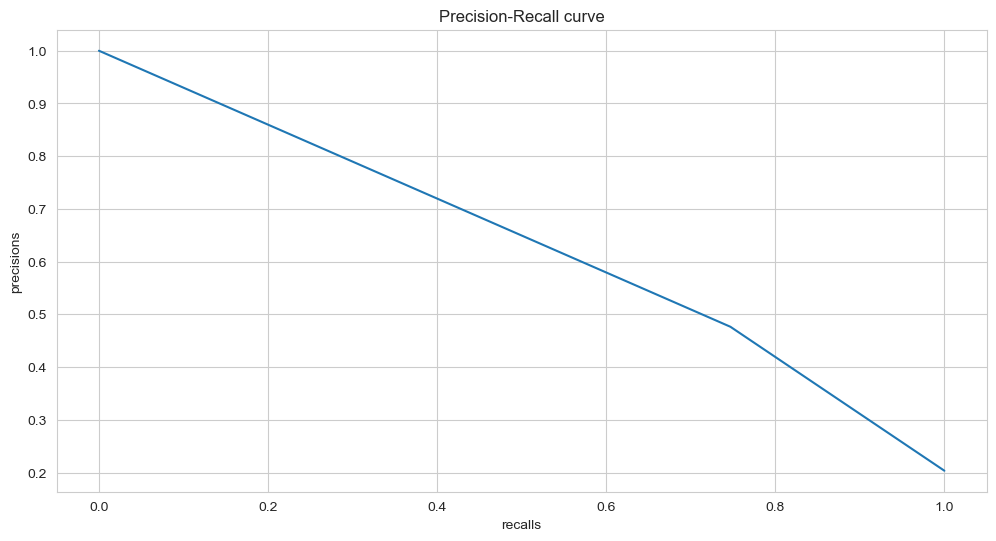

In [65]:
y_pred_proba = grid_model.predict(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

In [66]:
average_precision_score(y_test, y_pred_proba)

0.4074033527685565

# Final Model and Model Deployment

In [67]:
import pickle

pickle.dump(scaler, open("churn_scaler", 'wb'))

In [68]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.003)

model.compile(optimizer=opt,loss="binary_crossentropy",metrics=["Recall"])

In [69]:
model.fit(x=X_train,y=y_train,validation_data=(X_test, y_test), callbacks=[early_stop],batch_size=256,epochs=200,verbose=1,class_weight=class_weights)  

Epoch 1/200
32/32 [==============================] - 0s 5ms/step - loss: 0.6786 - recall: 0.4117 - val_loss: 0.6552 - val_recall: 0.4840
Epoch 2/200
32/32 [==============================] - 0s 1ms/step - loss: 0.6474 - recall: 0.6117 - val_loss: 0.6522 - val_recall: 0.6929
Epoch 3/200
32/32 [==============================] - 0s 1ms/step - loss: 0.6248 - recall: 0.6472 - val_loss: 0.6159 - val_recall: 0.6290
Epoch 4/200
32/32 [==============================] - 0s 1ms/step - loss: 0.6117 - recall: 0.6607 - val_loss: 0.6378 - val_recall: 0.7199
Epoch 5/200
32/32 [==============================] - 0s 1ms/step - loss: 0.5992 - recall: 0.6865 - val_loss: 0.6885 - val_recall: 0.8059
Epoch 6/200
32/32 [==============================] - 0s 1ms/step - loss: 0.5913 - recall: 0.7104 - val_loss: 0.5532 - val_recall: 0.6339
Epoch 7/200
32/32 [==============================] - 0s 1ms/step - loss: 0.5811 - recall: 0.6945 - val_loss: 0.5769 - val_recall: 0.6757
Epoch 8/200
32/32 [======================

<AxesSubplot:>

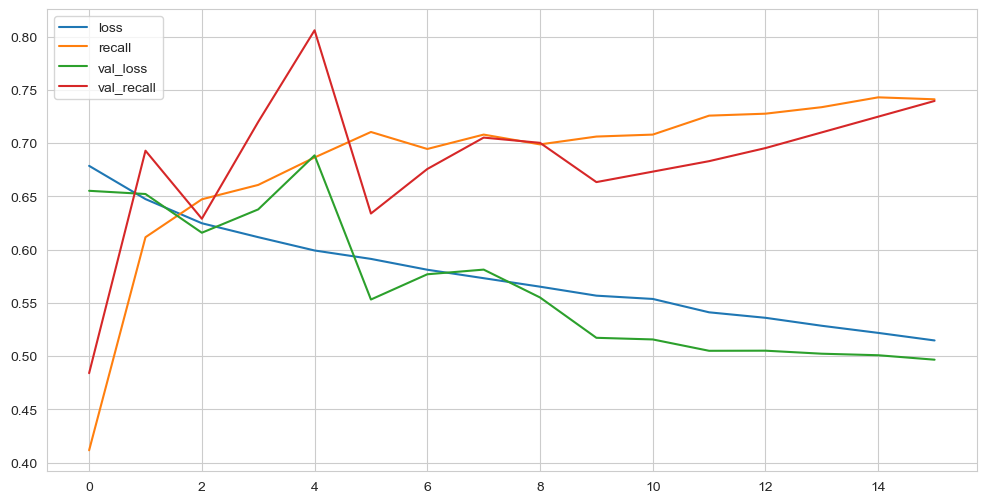

In [70]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [71]:
loss, recall = model.evaluate(X_test, y_test, verbose=0)
print("average loss :",loss)
print("average recall :",recall)

average loss : 0.4966810941696167
average recall : 0.7395577430725098


In [72]:
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

63/63 [==============================] - 0s 501us/step
[[1217  376]
 [ 106  301]]
              precision    recall  f1-score   support

           0       0.92      0.76      0.83      1593
           1       0.44      0.74      0.56       407

    accuracy                           0.76      2000
   macro avg       0.68      0.75      0.70      2000
weighted avg       0.82      0.76      0.78      2000



In [73]:
model.save('model_churn.h5')

## Prediction

In [74]:
single_customer = df.drop('Exited', axis=1).iloc[0]
single_customer

CreditScore            619.000
Age                     42.000
Tenure                   2.000
Balance                  0.000
NumOfProducts            1.000
HasCrCard                1.000
IsActiveMember           1.000
EstimatedSalary     101348.880
Geography_Germany        0.000
Geography_Spain          0.000
Gender_Male              0.000
Name: 1, dtype: float64

In [75]:
single_customer = scaler.transform(single_customer.values.reshape(-1, 11))
single_customer

array([[0.538     , 0.32432432, 0.2       , 0.        , 0.        ,
        1.        , 1.        , 0.50673489, 0.        , 0.        ,
        0.        ]])

In [76]:
y_pred =(model.predict(single_customer) > 0.5).astype("int32")
y_pred

1/1 [==============================] - 0s 20ms/step


array([[0]], dtype=int32)

In [77]:
df["Exited"].iloc[0]

1

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___